# **ML Data Cleaning and Feature Selection**

In [ ]:
import numpy as np
import matplotlib as mlt
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import pandas as pd
from sklearn import tree
import sklearn.metrics as sm
import warnings
warnings.filterwarnings("ignore")

In [ ]:
import seaborn as sns
url = 'https://raw.githubusercontent.com/sarthaksomvanshi10/AutoML/main/Sleep_Efficiency.csv'

In [ ]:
d1 = pd.read_csv(url, sep=',')

Uploading the Sleep Efficiency Data set, The Dataset can be described as below.

1.   ID - A unique identifier for each test subject.
2.   Age - Age of the test subject.
3.   Gender - Male or Female Gender of the test subject.
4.   Bedtime - The time the test subject goes to bed each night.
5.   Wakeup time - The time the test subject wakes up each morning.
6.   Sleep duration - The total amount of time the test subject slept (in hours).
7.   Sleep efficiency - A measure of the proportion of time in bed spent asleep.
8.   REM sleep percentage - The percentage of total sleep time spent in REM sleep.
9.   Deep sleep percentage - The percentage of total sleep time spent in deep sleep.
10.  Light sleep percentage - The percentage of total sleep time spent in light sleep.
11.  Awakenings - The number of times the test subject wakes up during the night.
12.  Caffeine Consumption - The amount of caffeine consumed in the 24 hours prior to bedtime (in mg).
13.  Alcohol Consumption - the amount of alcohol consumed in the 24 hours prior to bedtime (in oz).
14.  Smoking status - Whether or not the test subject smokes.
15.  Exercise Frequency - the number of times the test subject exercises each week.



In [ ]:
#we will check the data types
d1.dtypes

ID                          int64
Age                         int64
Gender                     object
Bedtime                    object
Wakeup time                object
Sleep duration            float64
Sleep efficiency          float64
REM sleep percentage        int64
Deep sleep percentage       int64
Light sleep percentage      int64
Awakenings                float64
Caffeine consumption      float64
Alcohol consumption       float64
Smoking status             object
Exercise frequency        float64
dtype: object

In [ ]:
#Creating separate arrays for Numerical and Categorical Columns
numeric_columns = d1.select_dtypes(exclude=['object']).columns.tolist()
categorical_columns = d1.select_dtypes(include=['object']).columns.tolist()

# Printing the list of categorical and numerical columns
print("\nCategorical Variables are:")
for row, col in enumerate(categorical_columns):
    print(f'{row+1}. {col}')

print("\nNumerical Variables are:")
for row, col in enumerate(numeric_columns):
    print(f'{row+1}. {col}')


Categorical Variables are:
1. Gender
2. Bedtime
3. Wakeup time
4. Smoking status

Numerical Variables are:
1. ID
2. Age
3. Sleep duration
4. Sleep efficiency
5. REM sleep percentage
6. Deep sleep percentage
7. Light sleep percentage
8. Awakenings
9. Caffeine consumption
10. Alcohol consumption
11. Exercise frequency


**Q1. ARE THERE ANY MISSING VALUES?**




In [ ]:
#Q1. ARE THERE ANY MISSING VALUES?
d1.isnull().sum()

ID                         0
Age                        0
Gender                     0
Bedtime                    0
Wakeup time                0
Sleep duration             0
Sleep efficiency           0
REM sleep percentage       0
Deep sleep percentage      0
Light sleep percentage     0
Awakenings                20
Caffeine consumption      25
Alcohol consumption       14
Smoking status             0
Exercise frequency         6
dtype: int64

**A. Yes there are some missing values in columns 'Awakenings', 'Caffeine consumption', 'Alcohol consumption', 'Exercise frequency '. We can Solve this bys using absolute mean method and fill those missing data by taking mean of the entire column and adding those data into missing fields.**


In [ ]:
d1['Awakenings'] = d1['Awakenings'].fillna(d1['Awakenings'].mean())
d1['Caffeine consumption'] = d1['Caffeine consumption'].fillna(d1['Caffeine consumption'].mean())
d1['Alcohol consumption'] = d1['Alcohol consumption'].fillna(d1['Alcohol consumption'].mean())
d1['Exercise frequency'] = d1['Exercise frequency'].fillna(d1['Exercise frequency'].mean())
d1.isnull().sum()

ID                        0
Age                       0
Gender                    0
Bedtime                   0
Wakeup time               0
Sleep duration            0
Sleep efficiency          0
REM sleep percentage      0
Deep sleep percentage     0
Light sleep percentage    0
Awakenings                0
Caffeine consumption      0
Alcohol consumption       0
Smoking status            0
Exercise frequency        0
dtype: int64

Now we can see there are no Null data present

In [ ]:
# Check for duplicate rows
duplicate_rows = d1[d1.duplicated()]

# Display the duplicate rows
print("Duplicate Rows:")
print(duplicate_rows)

# Display the count of duplicate rows
print("\nNumber of Duplicate Rows:", duplicate_rows.shape[0])

Duplicate Rows:
Empty DataFrame
Columns: [ID, Age, Gender, Bedtime, Wakeup time, Sleep duration, Sleep efficiency, REM sleep percentage, Deep sleep percentage, Light sleep percentage, Awakenings, Caffeine consumption, Alcohol consumption, Smoking status, Exercise frequency]
Index: []

Number of Duplicate Rows: 0


As for the Columns like Smoking status and Gender we have non numeric value and for performing regression we need to convert them into numeric value we will do following changes:



1.   Gender = Consider 'Male' value as '0' and 'Female' value as '1'
2.   Smoking status = Consider 'No' value as '0' and 'Yes' value as '1'
So we will replace thes values below


In [ ]:

d1["Smoking status"] = d1["Smoking status"].replace({"Yes": 1, "No": 0})
d1['Gender']=d1['Gender'].map({'Male':0, 'Female':1})
d1=d1.drop(['Bedtime','Wakeup time'], axis=1) #as both are date and time format which we wont be using for regression we will drop both column
d1=d1.drop(['ID'], axis=1)# its a unique identifier and doesn't have a significant weightage while performing regression


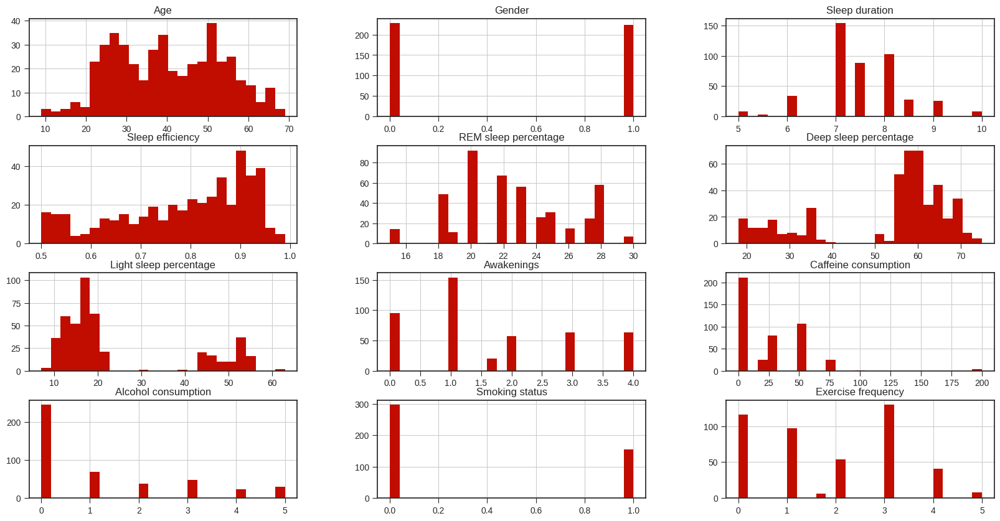

In [ ]:
d1 = d1.drop_duplicates()
plt.style.use('seaborn-ticks')
d1.hist(bins=25, figsize=(20,10), color='#c00d00')
plt.show();

**Q3. For the likely distribution of numeric variables**


<Figure size 800x500 with 0 Axes>

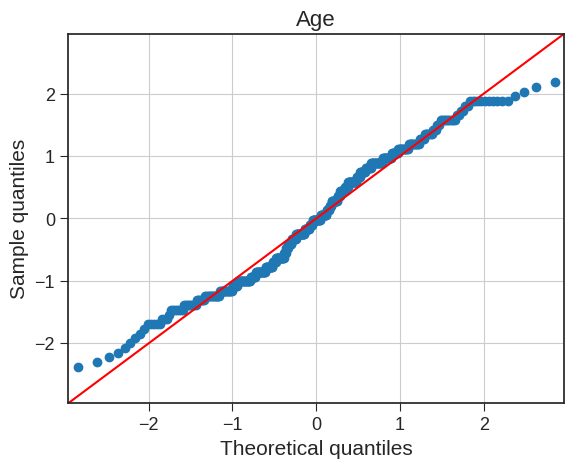

<Figure size 800x500 with 0 Axes>

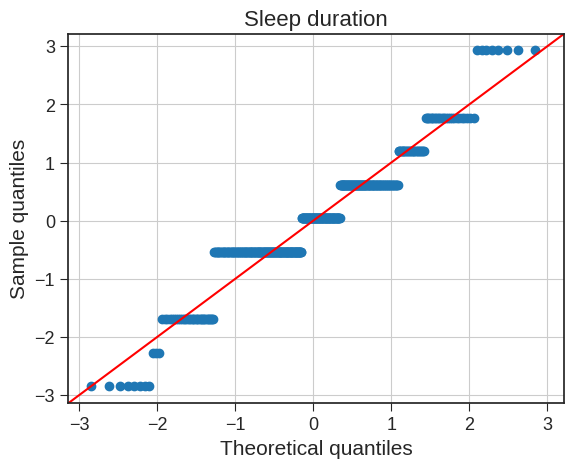

<Figure size 800x500 with 0 Axes>

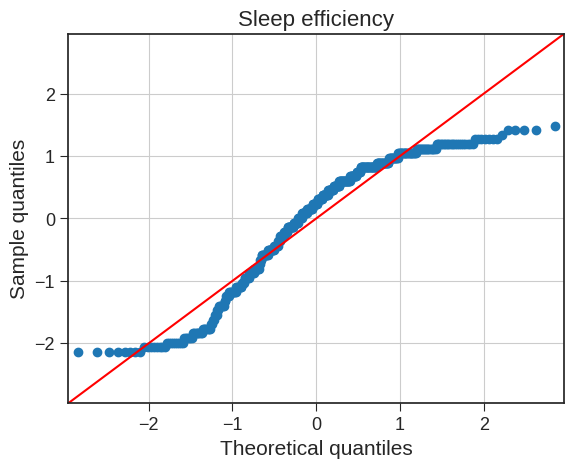

<Figure size 800x500 with 0 Axes>

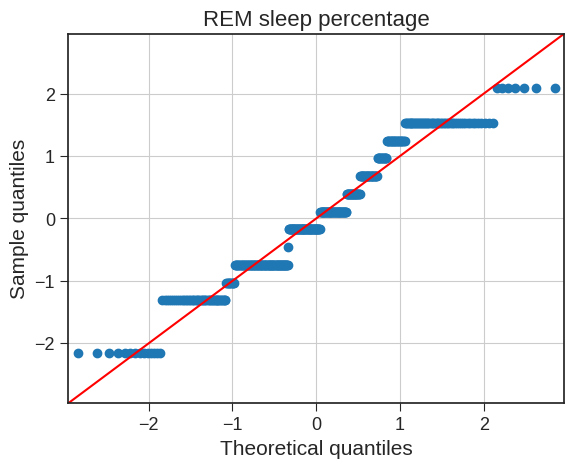

<Figure size 800x500 with 0 Axes>

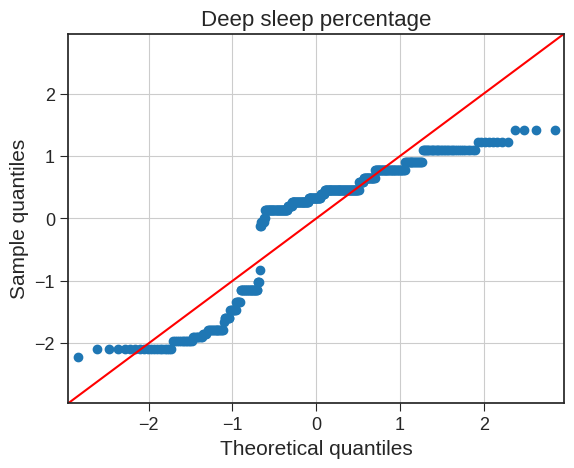

<Figure size 800x500 with 0 Axes>

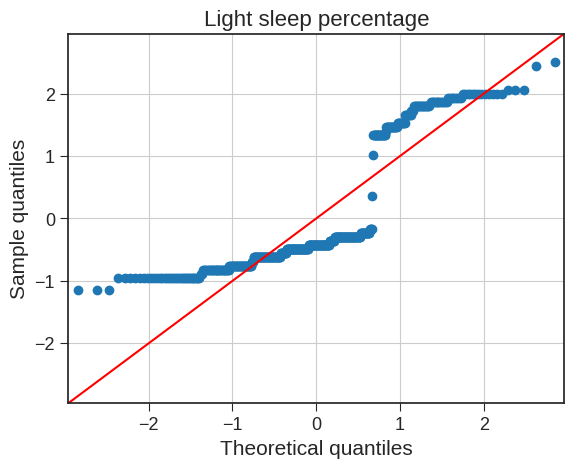

<Figure size 800x500 with 0 Axes>

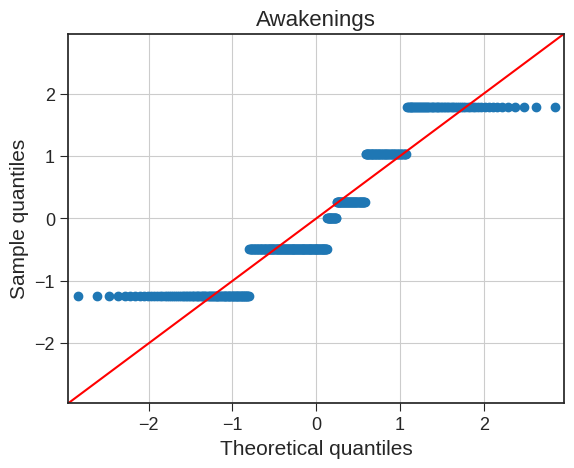

<Figure size 800x500 with 0 Axes>

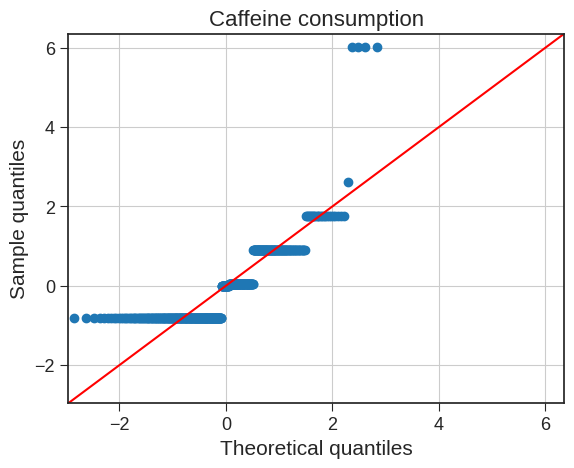

<Figure size 800x500 with 0 Axes>

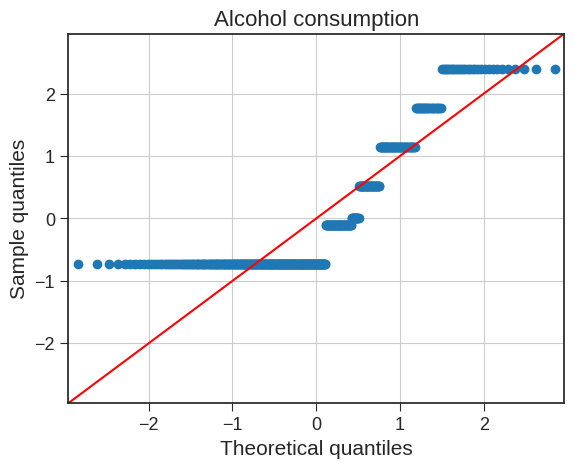

<Figure size 800x500 with 0 Axes>

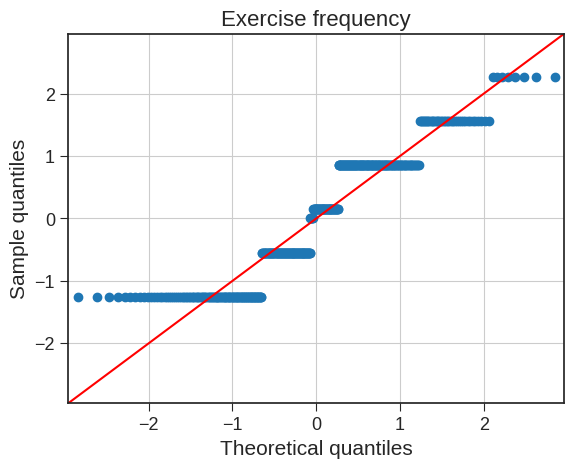

In [ ]:
# From above we can observe the likely distributions of all the numeric variable
from sklearn.linear_model import Lasso
import matplotlib.pyplot as plt
from statsmodels.graphics.gofplots import qqplot


# Numerical Variables are:
# 1. ID
# 2. Age
# 3. Sleep duration
# 4. Sleep efficiency
# 5. REM sleep percentage
# 6. Deep sleep percentage
# 7. Light sleep percentage
# 8. Awakenings
# 9. Caffeine consumption
# 10. Alcohol consumption
# 11. Exercise frequency
data_norm=d1[['Age','Sleep duration','Sleep efficiency','REM sleep percentage','Deep sleep percentage','Light sleep percentage','Awakenings','Caffeine consumption','Alcohol consumption','Exercise frequency']]


for c in data_norm.columns[:]:
  plt.figure(figsize=(8,5))
  fig=qqplot(data_norm[c],line='45',fit='True')
  plt.xticks(fontsize=13)
  plt.yticks(fontsize=13)
  plt.xlabel("Theoretical quantiles",fontsize=15)
  plt.ylabel("Sample quantiles",fontsize=15)
  plt.title("{}".format(c),fontsize=16)
  plt.grid(True)
  plt.show()


**A. From the above, it is clear that Age and Sleep efficiency has somewhat normal distribution**



In [ ]:
d1.head(20)


,Age,Gender,Sleep duration,Sleep efficiency,REM sleep percentage,Deep sleep percentage,Light sleep percentage,Awakenings,Caffeine consumption,Alcohol consumption,Smoking status,Exercise frequency
0,65,1,6.0,0.88,18,70,12,0.000000,0.000000,0.0,1,3.0
1,69,0,7.0,0.66,19,28,53,3.000000,0.000000,3.0,1,3.0
2,40,1,8.0,0.89,20,70,10,1.000000,0.000000,0.0,0,3.0
3,40,1,6.0,0.51,23,25,52,3.000000,50.000000,5.0,1,1.0
4,57,0,8.0,0.76,27,55,18,3.000000,0.000000,3.0,0,3.0
5,36,1,7.5,0.90,23,60,17,0.000000,23.653396,0.0,0,1.0
6,27,1,6.0,0.54,28,25,47,2.000000,50.000000,0.0,1,1.0
7,53,0,10.0,0.90,28,52,20,0.000000,50.000000,0.0,1,3.0
8,41,1,6.0,0.79,28,55,17,3.000000,50.000000,0.0,0,1.0
9,11,1,9.0,0.55,18,37,45,4.000000,0.000000,0.0,0,0.0


**Q4. Which independent variables are useful to predict a target (dependent variable)? (Use at least three methods)**

METHOD 1: By using SelectKBest method

In [ ]:
import pandas as pd
from sklearn import preprocessing

# Assuming 'd1' contains your DataFrame with the independent variables

# Create Dummies (if needed)
data = pd.get_dummies(d1)

# Select only the numeric columns for normalization
numeric_columns = ['Age', 'Sleep duration', 'REM sleep percentage', 'Deep sleep percentage',
                   'Light sleep percentage', 'Caffeine consumption', 'Alcohol consumption']

# Create a DataFrame containing only the numeric columns
numeric_data = data[numeric_columns]

# Initialize the MinMaxScaler
min_max_scaler = preprocessing.MinMaxScaler()

# Normalize the numeric data
normalized_data = min_max_scaler.fit_transform(numeric_data)

# Create a DataFrame with the normalized values
normalized_df = pd.DataFrame(normalized_data, columns=numeric_columns)

# Replace the original numeric columns with the normalized ones in the original DataFrame
for col in numeric_columns:
    data[col] = normalized_df[col]

# Now 'data' contains the normalized values for the numeric columns
print(data)


          Age  Gender  Sleep duration  Sleep efficiency  REM sleep percentage  \
0    0.933333       1             0.2              0.88              0.200000   
1    1.000000       0             0.4              0.66              0.266667   
2    0.516667       1             0.6              0.89              0.333333   
3    0.516667       1             0.2              0.51              0.533333   
4    0.800000       0             0.6              0.76              0.800000   
..        ...     ...             ...               ...                   ...   
447  0.300000       1             0.5              0.91              0.466667   
448  0.716667       0             0.2              0.74              0.866667   
449  0.516667       1             0.7              0.55              0.333333   
450  0.600000       0             0.4              0.76              0.200000   
451  0.150000       0             0.5              0.63              0.466667   

     Deep sleep percentage 

In [ ]:
data.head()


,Age,Gender,Sleep duration,Sleep efficiency,REM sleep percentage,Deep sleep percentage,Light sleep percentage,Awakenings,Caffeine consumption,Alcohol consumption,Smoking status,Exercise frequency
0,0.933333,1,0.2,0.88,0.200000,0.912281,0.089286,0.0,0.00,0.0,1,3.0
1,1.000000,0,0.4,0.66,0.266667,0.175439,0.821429,3.0,0.00,0.6,1,3.0
2,0.516667,1,0.6,0.89,0.333333,0.912281,0.053571,1.0,0.00,0.0,0,3.0
3,0.516667,1,0.2,0.51,0.533333,0.122807,0.803571,3.0,0.25,1.0,1,1.0
4,0.800000,0,0.6,0.76,0.800000,0.649123,0.196429,3.0,0.00,0.6,0,3.0


In [ ]:
np.any(np.isnan(data)) #checking for NAN data


False

In [ ]:
np.all(np.isfinite(data)) #checking for infinite data

True

In [ ]:
# Import SelectKBest, chi2(score function for classification), f_regression (score function for regression)
from sklearn.feature_selection import SelectKBest, chi2, f_regression


X_clf = data.iloc[:, 0:11]  # Assuming the last column (index 15) is the target variable
y_clf = data.iloc[:, 11]    # Target variable
# Create the object for SelectKBest and fit and transform the classification data
# k is the number of features you want to select [here it's 2]
from sklearn.feature_selection import SelectKBest, f_classif
#X_clf_new = SelectKBest(score_func=chi2,k=10).fit_transform(X_clf,y_clf)
# Create and fit selector
# data = data[np.all(np.isfinite(x), axis=1)]
selector = SelectKBest(f_classif, k=5)
selector.fit(X_clf, y_clf)
# Get columns to keep and create new dataframe with those only
cols = selector.get_support(indices=True)
features_df_new = X_clf.iloc[:,cols]

In [ ]:
features_df_new.head()


,Age,Gender,Sleep efficiency,REM sleep percentage,Caffeine consumption
0,0.933333,1,0.88,0.200000,0.00
1,1.000000,0,0.66,0.266667,0.00
2,0.516667,1,0.89,0.333333,0.00
3,0.516667,1,0.51,0.533333,0.25
4,0.800000,0,0.76,0.800000,0.00


 By using SelecttKbest method we got above variables as predictable variables.->
Age	Gender	Caffeine consumption	Alcohol consumption	Exercise frequency



In [ ]:
data.corr()


,Age,Gender,Sleep duration,Sleep efficiency,REM sleep percentage,Deep sleep percentage,Light sleep percentage,Awakenings,Caffeine consumption,Alcohol consumption,Smoking status,Exercise frequency
Age,1.000000,-0.244468,-0.062462,0.098357,0.042091,0.021730,-0.031905,-0.017468,-0.168273,0.046474,0.031237,0.071892
Gender,-0.244468,1.000000,0.044376,-0.010062,0.161102,-0.075939,0.040534,-0.074205,0.242839,-0.058287,-0.143020,-0.230169
Sleep duration,-0.062462,0.044376,1.000000,-0.027467,-0.015940,-0.037304,0.041804,0.004829,-0.014542,-0.045662,0.004211,-0.067903
Sleep efficiency,0.098357,-0.010062,-0.027467,1.000000,0.062362,0.787335,-0.819204,-0.554498,0.063121,-0.383671,-0.290026,0.257974
REM sleep percentage,0.042091,0.161102,-0.015940,0.062362,1.000000,-0.208159,-0.017462,-0.024992,0.058018,-0.051709,0.032184,0.031165
Deep sleep percentage,0.021730,-0.075939,-0.037304,0.787335,-0.208159,1.000000,-0.974311,-0.300301,0.001683,-0.355842,-0.226802,0.178281
Light sleep percentage,-0.031905,0.040534,0.041804,-0.819204,-0.017462,-0.974311,1.000000,0.312734,-0.015079,0.375662,0.224436,-0.189422
Awakenings,-0.017468,-0.074205,0.004829,-0.554498,-0.024992,-0.300301,0.312734,1.000000,-0.103769,0.198491,-0.020781,-0.212485
Caffeine consumption,-0.168273,0.242839,-0.014542,0.063121,0.058018,0.001683,-0.015079,-0.103769,1.000000,-0.117113,0.007205,-0.064172
Alcohol consumption,0.046474,-0.058287,-0.045662,-0.383671,-0.051709,-0.355842,0.375662,0.198491,-0.117113,1.000000,0.073629,0.006800


By using SelecttKbest method we got above variables as predictable variables.




<Axes: >

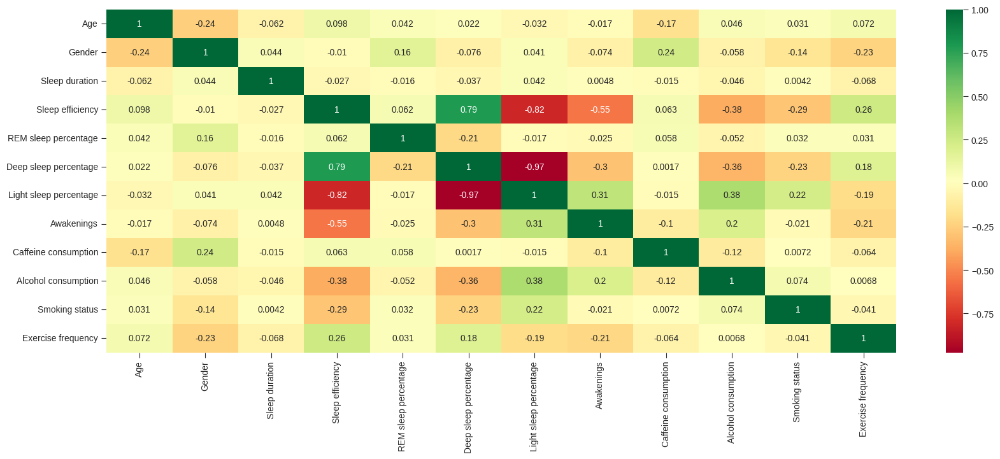

In [ ]:

# the heat map of the correlation
plt.figure(figsize=(20, 7))
sns.heatmap(data.corr(), annot=True, cmap="RdYlGn")

We can see there are lot of co-relation among the variables. The co-relation between length and diameter being the highest, it may mean that essentially both are measuring or predicting same thing


METHOD 2: By using Z score




In [ ]:

#Calculating Z Score
import pandas as pd
def calculate_z_scores(d1):
    return (d1 - d1.mean()) / d1.std()
d1 = pd.DataFrame(data,columns=['Age','Sleep duration', 'REM sleep percentage', 'Deep sleep percentage','Light sleep percentage', 'Caffeine consumption', 'Alcohol consumption'])

d1 = d1.apply(pd.to_numeric)
z_scores = calculate_z_scores(d1)
print(z_scores)

          Age  Sleep duration  REM sleep percentage  Deep sleep percentage  \
0    1.876263       -1.691283             -1.308875               1.097274   
1    2.179931       -0.537381             -1.025265              -1.585706   
2   -0.021667        0.616521             -0.741654               1.097274   
3   -0.021667       -1.691283              0.109177              -1.777347   
4    1.268925        0.616521              1.243619               0.139067   
..        ...             ...                   ...                    ...   
447 -1.008590        0.039570             -0.174433               0.266828   
448  0.889339       -1.691283              1.527230               0.266828   
449 -0.021667        1.193471             -0.741654              -1.330184   
450  0.357919       -0.537381             -1.308875               1.225035   
451 -1.691844        0.039570             -0.174433              -1.905108   

     Light sleep percentage  Caffeine consumption  Alcohol cons

If the z score of a data point is more than 3 or less than -3 then it indicates that the data point is quite different from the other data points. Such a data point can be an outlier. We will remove these outliers in the later part.


METHOD 3: Using OLS for finding the p value to check the significant features




In [ ]:
import statsmodels.api as sm
import pandas as pd

# Assuming you have a DataFrame named 'data' with the target variable 'SleepQuality' and independent variables
# Adjust the column names and indices based on your actual dataset
independent_variables = ['Age', 'Sleep duration', 'REM sleep percentage', 'Deep sleep percentage', 'Light sleep percentage', 'Awakenings', 'Caffeine consumption', 'Alcohol consumption', 'Exercise frequency']
target_variable = 'Gender'

X = data[independent_variables]
y = data[target_variable]

# Add a constant term to the independent variables matrix (X)
X = sm.add_constant(X)

# Fit the OLS model
model = sm.OLS(y, X).fit()

# Get the summary of the regression
summary = model.summary()

# Display the summary
print(summary)

                            OLS Regression Results                            
Dep. Variable:                 Gender   R-squared:                       0.182
Model:                            OLS   Adj. R-squared:                  0.167
Method:                 Least Squares   F-statistic:                     12.29
Date:                Tue, 02 Apr 2024   Prob (F-statistic):           6.21e-16
Time:                        16:39:26   Log-Likelihood:                -282.74
No. Observations:                 452   AIC:                             583.5
Df Residuals:                     443   BIC:                             620.5
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      0

*   'Age': As 'Age' increases by 1 unit, the log-odds of being in the 'Gender' category decrease by 0.4683.
*   'Sleep duration', 'Alcohol consumption': These variables are not statistically significant as their p-values are above the typical significance level of 0.05.
*   'REM sleep percentage', 'Deep sleep percentage', 'Light sleep percentage', 'Awakenings', 'Caffeine consumption', 'Exercise frequency': These variables are statistically significant in predicting 'Gender.'

P-VALUE
*   'Age', 'REM sleep percentage', 'Deep sleep percentage', 'Light sleep percentage', 'Awakenings', 'Caffeine consumption', 'Exercise frequency': These variables have p-values less than 0.05, suggesting they are statistically significant.
*   'Sleep duration', 'Alcohol consumption': These variables have p-values greater than 0.05, indicating they are not statistically significant in predicting 'Gender.'



**Q6. Do the training and test sets have the same data?**



In [ ]:
from sklearn.model_selection import  train_test_split

X = data[ ['Age', 'Sleep duration', 'REM sleep percentage', 'Deep sleep percentage', 'Light sleep percentage', 'Awakenings', 'Caffeine consumption', 'Alcohol consumption', 'Exercise frequency']]

y = data['Gender']

#Spliting data into Training 80%, Validation set 13.5% and Test set 10%

X_t, X_test, y_t, y_test = train_test_split(X, y, test_size=0.1, random_state=1)

X_train, X_val, y_train, y_val = train_test_split(X_t, y_t, test_size=0.2, random_state=1)


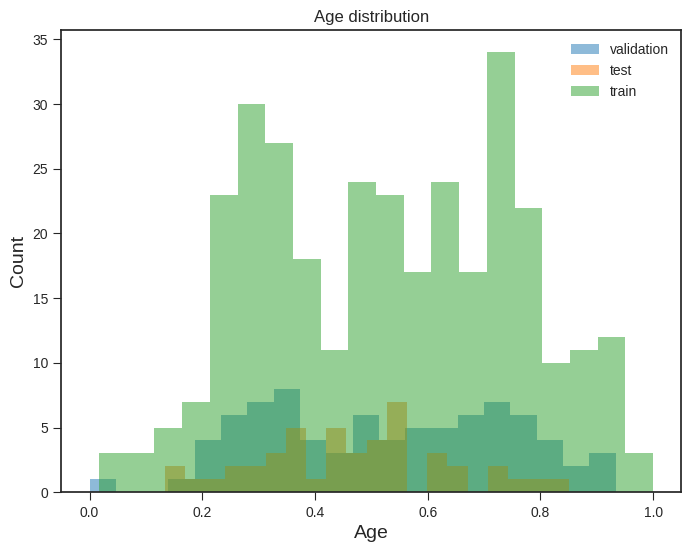

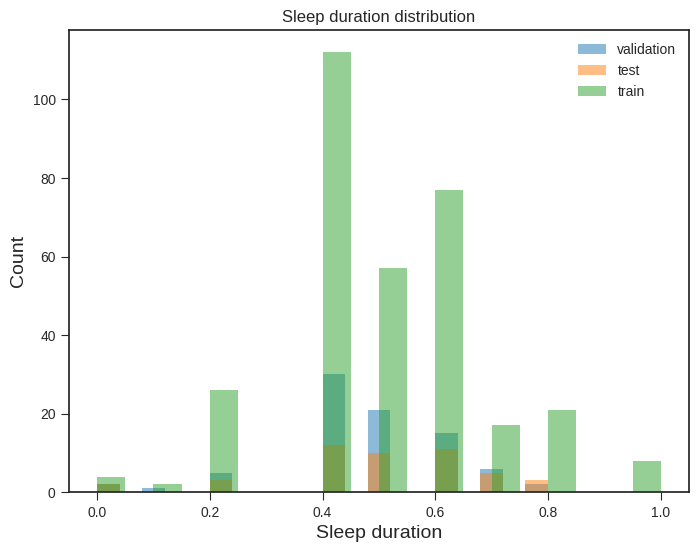

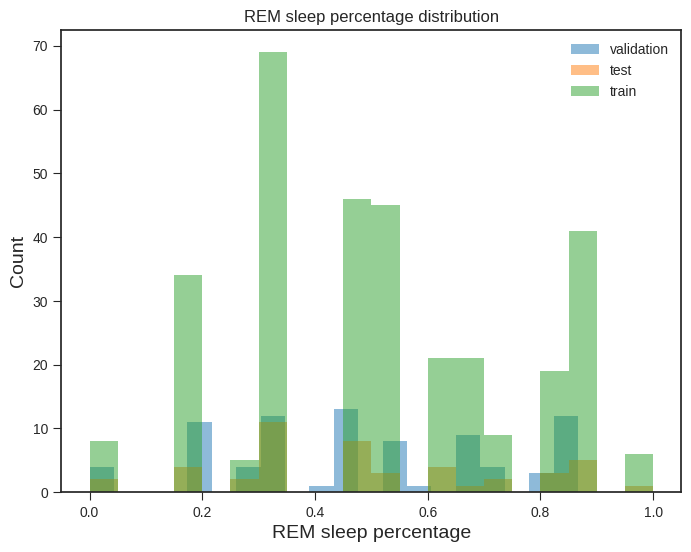

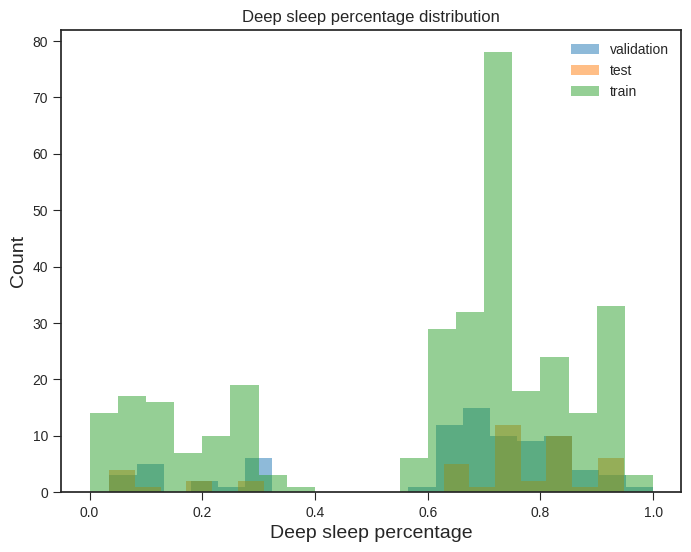

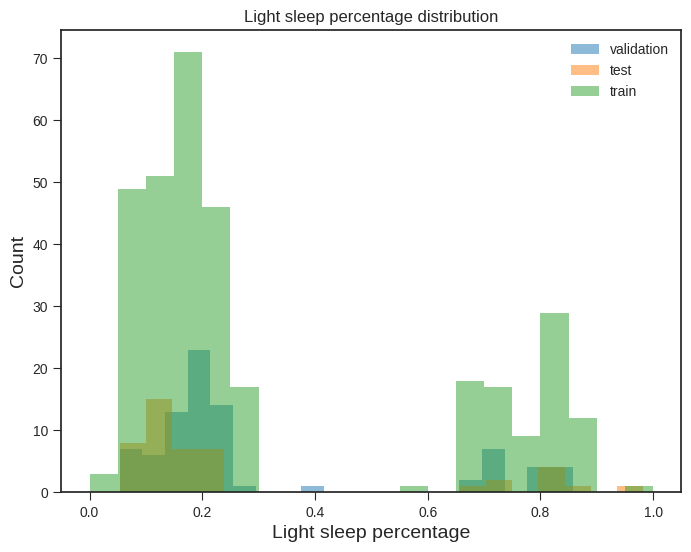

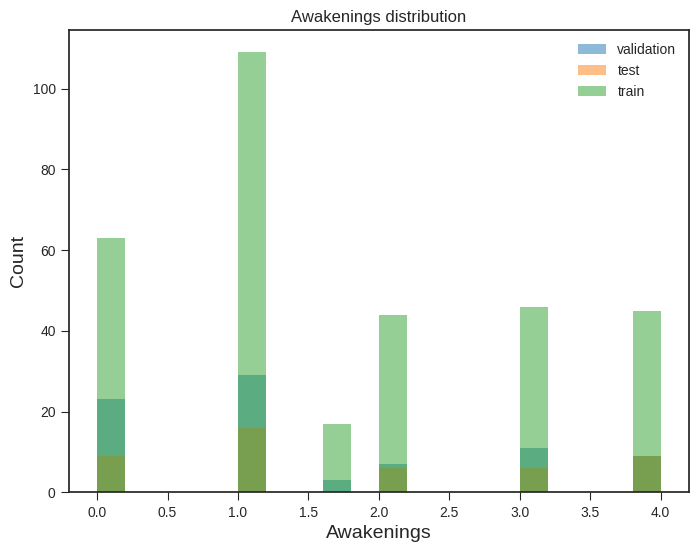

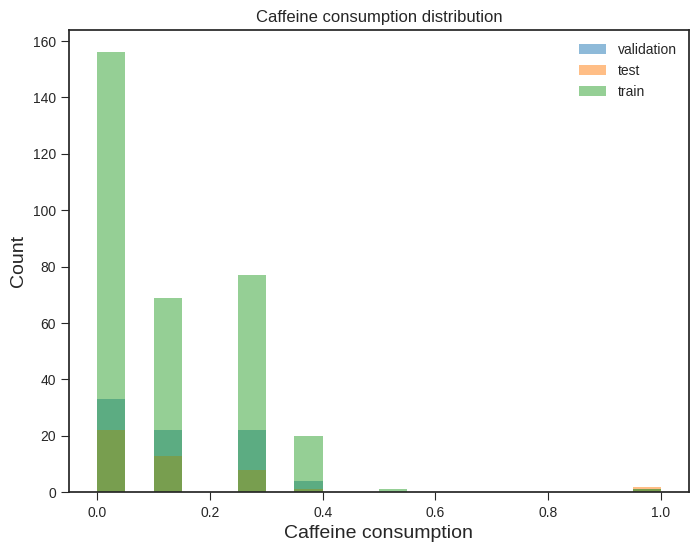

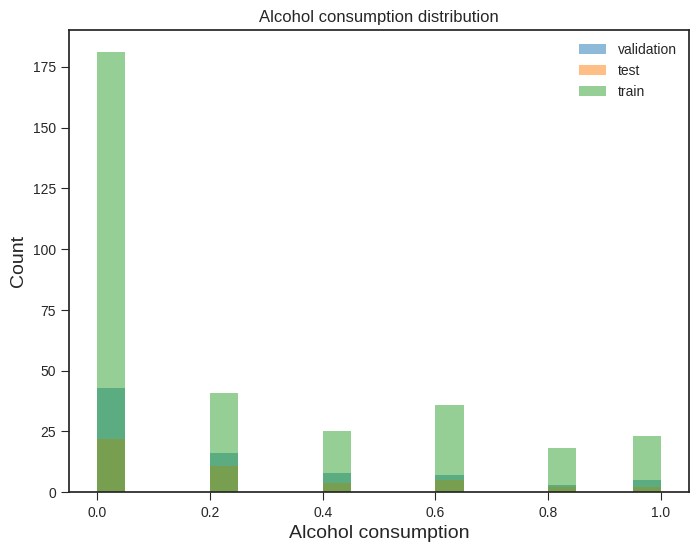

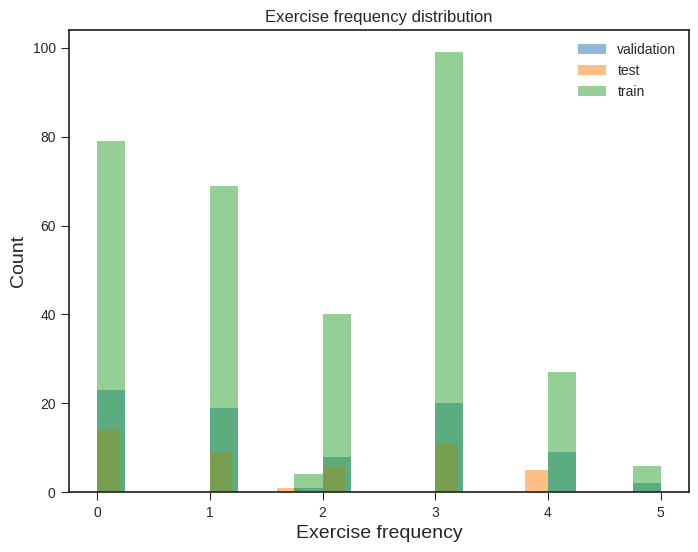

In [ ]:
X_test_plot = X_test[['Age', 'Sleep duration', 'REM sleep percentage', 'Deep sleep percentage', 'Light sleep percentage', 'Awakenings', 'Caffeine consumption', 'Alcohol consumption', 'Exercise frequency']]

X_val_plot = X_val[['Age', 'Sleep duration', 'REM sleep percentage', 'Deep sleep percentage', 'Light sleep percentage', 'Awakenings', 'Caffeine consumption', 'Alcohol consumption', 'Exercise frequency']]

X_train_plot = X_train[['Age', 'Sleep duration', 'REM sleep percentage', 'Deep sleep percentage', 'Light sleep percentage', 'Awakenings', 'Caffeine consumption', 'Alcohol consumption', 'Exercise frequency']]

# Plotting the data to see the histogram
for c in X_test_plot.columns[:]:
  plt.figure(figsize=(8,6))
  plt.hist(X_val_plot[c], bins=20, alpha=0.5, label="validation")
  plt.hist(X_test_plot[c], bins=20, alpha=0.5, label="test")
  plt.hist(X_train_plot[c], bins=20, alpha=0.5, label="train")
  plt.xlabel(c, size=14)
  plt.ylabel("Count", size=14)
  plt.legend(loc='upper right')
  plt.title("{} distribution".format(c))
  plt.show()

Yes, the training data and testng data are same. The only difference is testing data is less than the training one as testing data is a small part of training data.


**Q7. Are the predictor variables independent of all other predictor variables?**


In [ ]:

data.corr()


,Age,Gender,Sleep duration,Sleep efficiency,REM sleep percentage,Deep sleep percentage,Light sleep percentage,Awakenings,Caffeine consumption,Alcohol consumption,Smoking status,Exercise frequency
Age,1.000000,-0.244468,-0.062462,0.098357,0.042091,0.021730,-0.031905,-0.017468,-0.168273,0.046474,0.031237,0.071892
Gender,-0.244468,1.000000,0.044376,-0.010062,0.161102,-0.075939,0.040534,-0.074205,0.242839,-0.058287,-0.143020,-0.230169
Sleep duration,-0.062462,0.044376,1.000000,-0.027467,-0.015940,-0.037304,0.041804,0.004829,-0.014542,-0.045662,0.004211,-0.067903
Sleep efficiency,0.098357,-0.010062,-0.027467,1.000000,0.062362,0.787335,-0.819204,-0.554498,0.063121,-0.383671,-0.290026,0.257974
REM sleep percentage,0.042091,0.161102,-0.015940,0.062362,1.000000,-0.208159,-0.017462,-0.024992,0.058018,-0.051709,0.032184,0.031165
Deep sleep percentage,0.021730,-0.075939,-0.037304,0.787335,-0.208159,1.000000,-0.974311,-0.300301,0.001683,-0.355842,-0.226802,0.178281
Light sleep percentage,-0.031905,0.040534,0.041804,-0.819204,-0.017462,-0.974311,1.000000,0.312734,-0.015079,0.375662,0.224436,-0.189422
Awakenings,-0.017468,-0.074205,0.004829,-0.554498,-0.024992,-0.300301,0.312734,1.000000,-0.103769,0.198491,-0.020781,-0.212485
Caffeine consumption,-0.168273,0.242839,-0.014542,0.063121,0.058018,0.001683,-0.015079,-0.103769,1.000000,-0.117113,0.007205,-0.064172
Alcohol consumption,0.046474,-0.058287,-0.045662,-0.383671,-0.051709,-0.355842,0.375662,0.198491,-0.117113,1.000000,0.073629,0.006800


<Axes: >

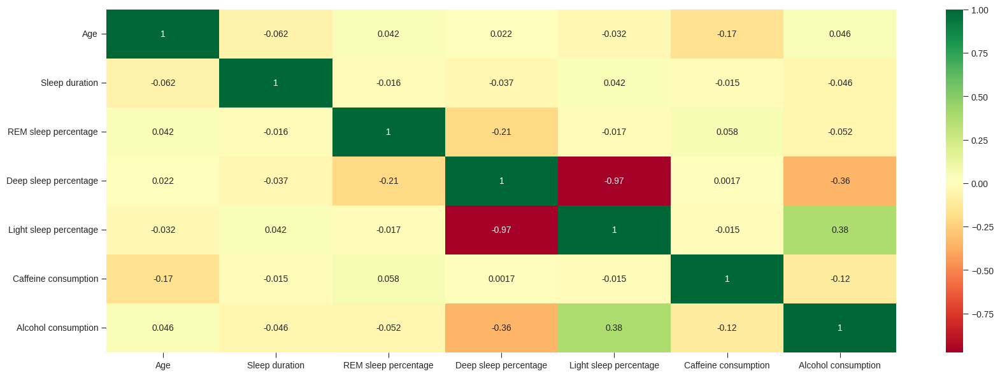

In [ ]:

#the heat map of the correlation
plt.figure(figsize=(20,7))
sns.heatmap(d1.corr(), annot=True, cmap='RdYlGn')

From above we can see coorelation between Alcohol Consumption and Light Sleep Percentage is 0.38

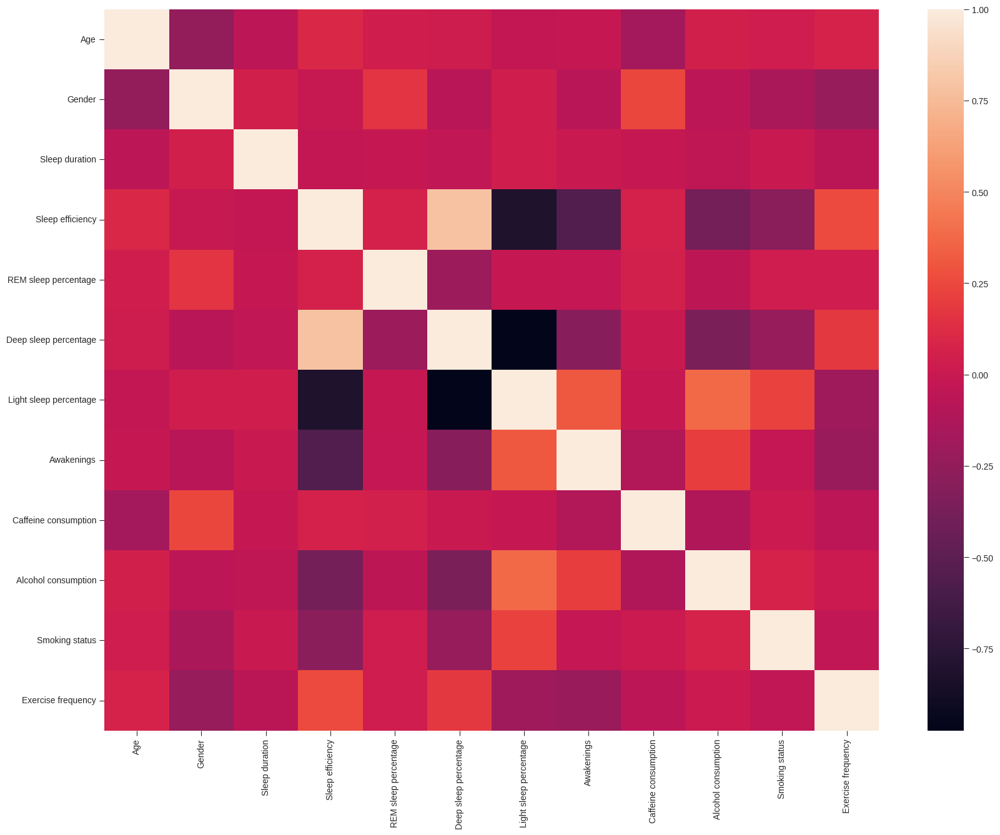

In [ ]:

plt.figure(figsize=(20,15))
cor = data.corr()
sns.heatmap(cor)
plt.show()

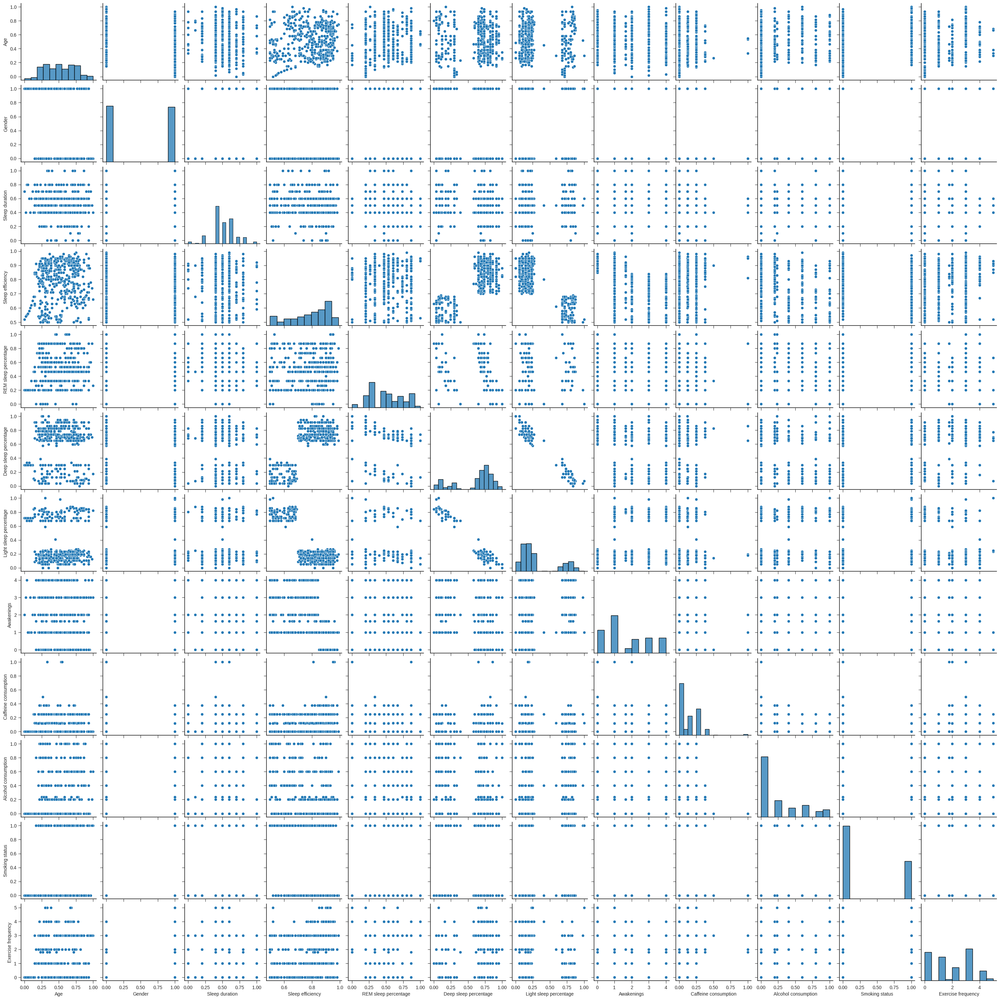

In [ ]:
#pair plot to check the colinearity
sns.pairplot(data)
plt.show()

Based on the graphical evidence, it seems that most predictor variables have correlations close to zero, suggesting relative independence. However, there are some exceptions where certain variables show stronger correlations, indicating potential dependencies.



**Q8. Which predictor variables are the most important?**






From SelecKbest it is observed that Caffeine Consumption is the most important predictor variable From OLS method Caffeine consumption and poutcome_success should be the most important Predictor variable.


**Q9. Do the ranges of the predictor variables make sense?**



<Axes: >

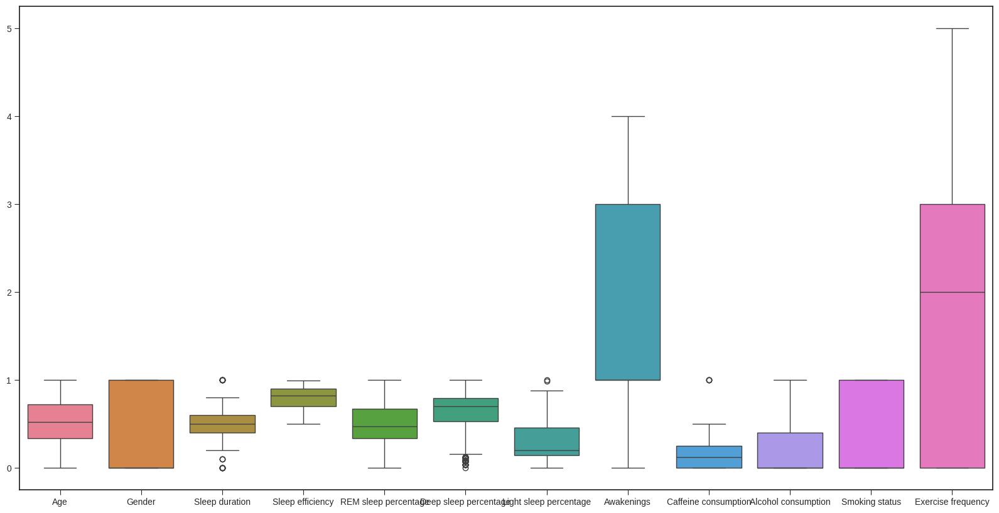

In [ ]:

#Checking the Ranges of the predictor variables and dependent variable
plt.figure(figsize=(20,10))
sns.boxplot(data=data)


**A. The variable ranges are nearly the same because we standardized the data. However, as the graphic above shows, there are a few outliers that we may need to eliminate before continuing so that the data begins to make much more sense**.


In [ ]:
data.describe()


,Age,Gender,Sleep duration,Sleep efficiency,REM sleep percentage,Deep sleep percentage,Light sleep percentage,Awakenings,Caffeine consumption,Alcohol consumption,Smoking status,Exercise frequency
count,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000
mean,0.521423,0.495575,0.493142,0.788916,0.507670,0.610930,0.313606,1.641204,0.118267,0.234703,0.340708,1.791480
std,0.219537,0.500534,0.173325,0.135237,0.235064,0.274636,0.273458,1.326338,0.146769,0.319203,0.474472,1.418603
min,0.000000,0.000000,0.000000,0.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.333333,0.000000,0.400000,0.697500,0.333333,0.530702,0.142857,1.000000,0.000000,0.000000,0.000000,0.000000
50%,0.516667,0.000000,0.500000,0.820000,0.466667,0.701754,0.196429,1.000000,0.118267,0.000000,0.000000,2.000000
75%,0.716667,1.000000,0.600000,0.900000,0.666667,0.789474,0.455357,3.000000,0.250000,0.400000,1.000000,3.000000
max,1.000000,1.000000,1.000000,0.990000,1.000000,1.000000,1.000000,4.000000,1.000000,1.000000,1.000000,5.000000


**Q10. What are the distributions of the predictor variables?**






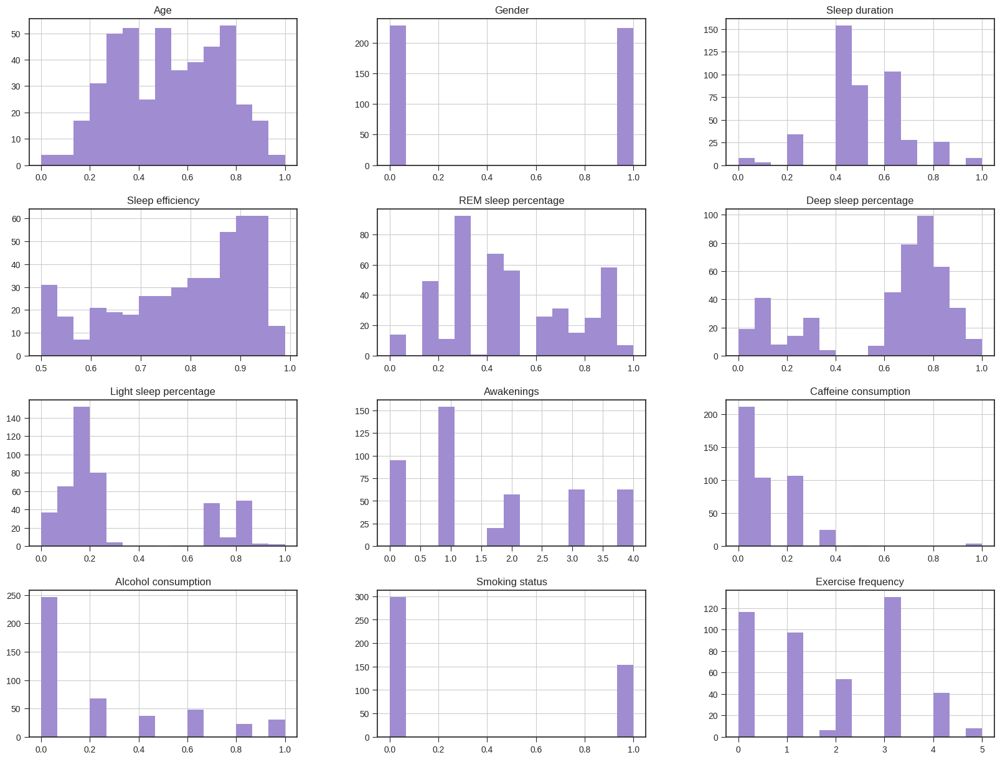

In [ ]:

plt.style.use('seaborn-ticks')

data.hist(bins=15, figsize=(20,15), color='#a08cd1')
plt.show();

From above distribution we can see distribution where smoking status and gender where the values are 0 or 1 while others

**Q11. Remove outliers and keep outliers (does if have an effect of the final predictive model)?**



In [ ]:

# We will Run the Logistic regression for data before and after removing the outliers
#Now it is for before removing the outliers

#import the pkgs required
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error
logisticRegr = LogisticRegression()

In [ ]:

#input variables
X1 = data[['Age', 'Sleep duration', 'REM sleep percentage', 'Deep sleep percentage', 'Light sleep percentage', 'Caffeine consumption', 'Alcohol consumption']]
#output variable
y1 = data[['Gender']]
#splitting data in to train and test, 35% of data will be used for testing
#stratify for sorting
#fixed value is assigned like random_state = 42 then no matter how many times you execute your code the result would be the same
X1_train_data, X1_test_data, y1_train_data, y1_test_data = train_test_split(X1, y1, test_size=0.10, random_state=42, stratify=y1)
logisticRegr.fit(X1_train_data, y1_train_data)

LogisticRegression()

In [ ]:
#The output of a Logistic regression model is a probability. We can select a threshold value.
#If the probability is greater than this threshold value, the event is predicted to happen otherwise it is predicted not to happen
threshold = 1.0


In [ ]:

#setting threshold 1.0 will be the ideal case
logisticRegr.predict(X1_test_data)

array([1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0,
       0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 1,
       0, 0])

In [ ]:
Z = logisticRegr.predict(X1_test_data)


In [ ]:

rms = mean_squared_error(y1_test_data, Z , squared=False);
rms

0.5897678246195885

In [ ]:
logisticRegr.score(X1_test_data, y1_test_data)


0.6521739130434783

From the above, we can observe that we got 66% accuracy for our dataset with outliers.



In [ ]:
import pandas as pd

# Assuming 'data' is your DataFrame containing the predictor variables
# Define the predictor variables
predictor_variables = ['Age', 'Sleep duration', 'REM sleep percentage',
                       'Deep sleep percentage', 'Light sleep percentage',
                       'Caffeine consumption', 'Alcohol consumption',
                       'Smoking status']

# Calculate the IQR for each predictor variable
Q1 = data[predictor_variables].quantile(0.25)
Q3 = data[predictor_variables].quantile(0.75)
IQR = Q3 - Q1

# Define the threshold for detecting outliers
threshold = 1.0

# Identify outliers
outliers = (data[predictor_variables] < (Q1 - threshold * IQR)) | (data[predictor_variables] > (Q3 + threshold * IQR))

# Count the number of outliers in each predictor variable
outlier_counts = outliers.sum()

# Print the number of outliers for each predictor variable
print("Number of outliers for each predictor variable:")
print(outlier_counts)


Number of outliers for each predictor variable:
Age                        0
Sleep duration            19
REM sleep percentage       0
Deep sleep percentage     82
Light sleep percentage    58
Caffeine consumption       4
Alcohol consumption       30
Smoking status             0
dtype: int64


In [ ]:
# Remove outliers
clean_data = data[~outliers.any(axis=1)]

# Display the cleaned data
print("Shape of cleaned data:", clean_data.shape)

Shape of cleaned data: (332, 12)


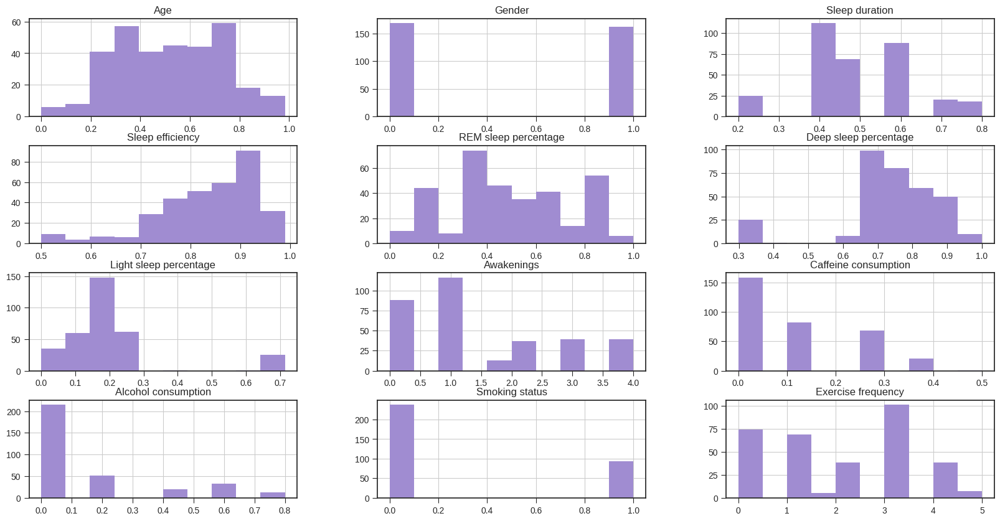

In [ ]:
plt.style.use('seaborn-ticks')

clean_data.hist(bins=10, figsize=(20,10), color='#a08cd1')
plt.show();

Now we will again check the accuracy after removing the outliers



In [ ]:
#import the required packages
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error
logisticRegr = LogisticRegression()
#input variables
X2 = clean_data[['Age', 'Sleep duration', 'REM sleep percentage',
                       'Deep sleep percentage', 'Light sleep percentage',
                       'Caffeine consumption', 'Alcohol consumption',
                       'Smoking status']]
#output variable
y2 = clean_data[['Gender']]
#splitting data in to train and test, 20% of data will be used for testing
#stratify for sorting
#fixed value is assigned like random_state = 42
X2_train_data, X2_test_data, y2_train_data, y2_test_data = train_test_split(X2, y2, test_size=0.10, random_state=42, stratify=y2)
logisticRegr.fit(X2_train_data, y2_train_data)

LogisticRegression()

In [ ]:
#The output of a Logistic regression model is a probability. We can select a threshold value.
#If the probability is greater than this threshold value, the event is predicted to happen otherwise it is predicted not to happen
threshold = 1.0
#setting threshold 0.5 will be the ideal case
logisticRegr.predict(X2_test_data)


array([0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 1,
       1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0])

In [ ]:
Z2 = logisticRegr.predict(X2_test_data)


In [ ]:


rms = mean_squared_error(y2_test_data, Z2 , squared=False);
rms

0.42008402520840293

In [ ]:
logisticRegr.score(X2_test_data, y2_test_data)


0.8235294117647058

**So for final_data(without outliers) the accuracy is 82.35% And the data with Outliers has the accuracy of 65%**

**We can conclude that Data with outliers predicts less accuracy than the oe without outliers.**


**Q12 Remove 1%, 5%, and 10% of your data randomly and impute the values back using at least 3 imputation methods. How well did the methods recover the missing values? That is remove some data, check the % error on residuals for numeric data and check for bias and variance of the error.**

In [ ]:
!pip install fancyimpute


  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.7/154.7 kB 5.9 MB/s eta 0:00:00
  Created wheel for fancyimpute: filename=fancyimpute-0.7.0-py3-none-any.whl size=29881 sha256=686c63c54ee4d8a6d4a1c2fd9e5bd3375fa92c01f0597edef3263b24ae422755
  Stored in directory: /root/.cache/pip/wheels/7b/0c/d3/ee82d1fbdcc0858d96434af108608d01703505d453720c84ed
  Created wheel for knnimpute: filename=knnimpute-0.1.0-py3-none-any.whl size=11330 sha256=f735697aba342560d711bb6e534033415a19ae26a8ee63e81ed3015d3efef1ea
  Stored in directory: /root/.cache/pip/wheels/46/06/a5/45a724630562413c374e29c08732411d496092408b3a7bf754
Successfully built fancyimpute knnimpute


In [ ]:
from sklearn.impute import SimpleImputer
from fancyimpute import KNN

# Remove 1%, 5%, and 10% of the data randomly
def remove_random_data(data, percentage):
    rows = data.shape[0]
    columns = data.shape[1]
    to_remove = int(rows * percentage)
    indexes = np.random.choice(rows, to_remove, replace=False)
    data_missing = data.copy()
    data_missing.iloc[indexes, :] = np.nan
    return data_missing


In [ ]:


# Calculate % error on residuals for numeric data
def calculate_error(data, data_missing, method):
    data_imputed = method.fit_transform(data_missing)
    error = np.abs(data_imputed - data)
    total_error = error.sum()
    percent_error = (total_error / data.size) * 100
    return percent_error

In [ ]:


# Check for bias and variance of the error
def check_bias_variance(data, data_missing, method):
    data_imputed = method.fit_transform(data_missing)
    bias = np.mean(data_imputed - data)
    variance = np.var(data_imputed - data)
    return bias, variance

In [ ]:

# Remove 1% of data
data_missing_1 = remove_random_data(data, 0.01)

# Remove 5% of data
data_missing_5 = remove_random_data(data, 0.05)

# Remove 10% of data
data_missing_10 = remove_random_data(data, 0.1)


In [ ]:
# Impute values using the mean method
mean_imp = SimpleImputer(strategy='mean')
mean_error_1 = calculate_error(data, data_missing_1, mean_imp)
mean_error_5 = calculate_error(data, data_missing_5, mean_imp)
mean_error_10 = calculate_error(data, data_missing_10, mean_imp)
mean_bias_1, mean_variance_1 = check_bias_variance(data, data_missing_1, mean_imp)
mean_bias_5, mean_variance_5 = check_bias_variance(data, data_missing_5, mean_imp)
mean_bias_10, mean_variance_10 = check_bias_variance(data, data_missing_10, mean_imp)

In [ ]:
# Impute values using the median method
median_imp = SimpleImputer(strategy='median')
median_error_1 = calculate_error(data, data_missing_1, median_imp)
median_error_5 = calculate_error(data, data_missing_5, median_imp)
median_error_10 = calculate_error(data, data_missing_10, median_imp)
median_bias_1, median_variance_1 = check_bias_variance(data, data_missing_1, median_imp)
median_bias_5, median_variance_5 = check_bias_variance(data, data_missing_5, median_imp)
median_bias_10, median_variance_10 = check_bias_variance(data, data_missing_10, median_imp)

In [ ]:
print("Mean Impute Error for 1% Missing Data: ", mean_error_1)
print("Mean Impute Error for 5% Missing Data: ", mean_error_5)
print("Mean Impute Error for 10% Missing Data: ", mean_error_10)
print("Median Impute Error for 1% Missing Data: ", median_error_1)
print("Median Impute Error for 5% Missing Data: ", median_error_5)
print("Median Impute Error for 10% Missing Data: ", median_error_10)

Mean Impute Error for 1% Missing Data:  Age                       0.013977
Gender                    0.036791
Sleep duration            0.009218
Sleep efficiency          0.009624
REM sleep percentage      0.018437
Deep sleep percentage     0.013349
Light sleep percentage    0.015494
Awakenings                0.098969
Caffeine consumption      0.008988
Alcohol consumption       0.019744
Smoking status            0.031029
Exercise frequency        0.092183
dtype: float64
Mean Impute Error for 5% Missing Data:  Age                       0.071781
Gender                    0.203060
Sleep duration            0.052248
Sleep efficiency          0.042276
REM sleep percentage      0.084254
Deep sleep percentage     0.094999
Light sleep percentage    0.102351
Awakenings                0.392375
Caffeine consumption      0.032512
Alcohol consumption       0.083590
Smoking status            0.168845
Exercise frequency        0.608407
dtype: float64
Mean Impute Error for 10% Missing Data:  Age      

In [ ]:

print("Mean Impute Bias for 1% Missing Data: " , mean_bias_1)
print("Mean Impute Variance for 1% Missing Data: ", mean_variance_1)
print("Median Impute Bias for 1% Missing Data: ", median_bias_1)
print("Median Impute Variance for 1% Missing Data: ", median_variance_1)


Mean Impute Bias for 1% Missing Data:  Age                      -0.000478
Gender                    0.002193
Sleep duration            0.000608
Sleep efficiency          0.000080
REM sleep percentage     -0.000676
Deep sleep percentage     0.000716
Light sleep percentage   -0.000548
Awakenings               -0.004635
Caffeine consumption      0.000498
Alcohol consumption       0.000756
Smoking status            0.000810
Exercise frequency        0.000370
dtype: float64
Mean Impute Variance for 1% Missing Data:  Age                       0.000412
Gender                    0.002198
Sleep duration            0.000235
Sleep efficiency          0.000239
REM sleep percentage      0.000688
Deep sleep percentage     0.000648
Light sleep percentage    0.000729
Awakenings                0.022375
Caffeine consumption      0.000131
Alcohol consumption       0.000661
Smoking status            0.001733
Exercise frequency        0.014949
dtype: float64
Median Impute Bias for 1% Missing Data:  Age    

In [ ]:

#By using KNN
from sklearn.impute import KNNImputer


# Specify the number of nearest neighbors to use (k)
k = 5

# Create the KNN imputer
imputer = KNNImputer(n_neighbors=k)

# Impute the missing values in data_missing_1 using KNN
data_imputed_1 = imputer.fit_transform(data_missing_1)

# Impute the missing values in data_missing_5 using KNN
data_imputed_5 = imputer.fit_transform(data_missing_5)

# Impute the missing values in data_missing_10 using KNN
data_imputed_10 = imputer.fit_transform(data_missing_10)

In [ ]:
#To print the mean squared error (MSE) between the original values and the imputed values

# Calculate the MSE between the original data and data_imputed_1
mse_1 = np.mean((data - data_imputed_1)**2)
print("MSE for 1% missing data:", mse_1)

# Calculate the MSE between the original data and data_imputed_5
mse_5 = np.mean((data - data_imputed_5)**2)
print("MSE for 5% missing data:", mse_5)

# Calculate the MSE between the original data and data_imputed_10
mse_10 = np.mean((data - data_imputed_10)**2)
print("MSE for 10% missing data:", mse_10)

MSE for 1% missing data: Age                       0.000412
Gender                    0.002203
Sleep duration            0.000235
Sleep efficiency          0.000239
REM sleep percentage      0.000688
Deep sleep percentage     0.000648
Light sleep percentage    0.000730
Awakenings                0.022396
Caffeine consumption      0.000132
Alcohol consumption       0.000662
Smoking status            0.001733
Exercise frequency        0.014949
dtype: float64
MSE for 5% missing data: Age                       0.002357
Gender                    0.012201
Sleep duration            0.001351
Sleep efficiency          0.000751
REM sleep percentage      0.003066
Deep sleep percentage     0.003928
Light sleep percentage    0.004304
Awakenings                0.065824
Caffeine consumption      0.000472
Alcohol consumption       0.002662
Smoking status            0.009240
Exercise frequency        0.121056
dtype: float64
MSE for 10% missing data: Age                       0.003984
Gender             

For categorical data, calculate the accuracy and a confusion matrix. From above we already got the accuracy be 65%(with outliers) and 82% without them.

Now

Confusion Matrix:

A confusion matrix is a technique for summarizing the performance of a classification algorithm.

In [ ]:


#Confusion matric for data with out outliers
from sklearn.metrics import confusion_matrix #for confusion matrix
from sklearn.metrics import classification_report #for classification_report
print(classification_report(y2_test_data,Z2))
print(confusion_matrix(y2_test_data,Z2))

              precision    recall  f1-score   support

           0       0.79      0.88      0.83        17
           1       0.87      0.76      0.81        17

    accuracy                           0.82        34
   macro avg       0.83      0.82      0.82        34
weighted avg       0.83      0.82      0.82        34

[[15  2]
 [ 4 13]]


In [ ]:
#Confusion matric for data with outliers
from sklearn.metrics import confusion_matrix #for confusion matrix
from sklearn.metrics import classification_report #for classification_report
print(classification_report(y1_test_data,Z))
print(confusion_matrix(y1_test_data,Z))

              precision    recall  f1-score   support

           0       0.64      0.70      0.67        23
           1       0.67      0.61      0.64        23

    accuracy                           0.65        46
   macro avg       0.65      0.65      0.65        46
weighted avg       0.65      0.65      0.65        46

[[16  7]
 [ 9 14]]


**Conclusion**

**The analysis of the data set performed above makes it clear that the important dependent variables are Age, Sleep efficiency, REM sleep percentage and Caffeine consumption and they are significant. Also recognized the significance of the factors for data training. After removing the outliers, our dataset showed a greater accuracy.**

# **Modeling(AUTO ML)**

Uploading the Sleep Efficiency Data set, The Dataset can be described as below.

1.   ID - A unique identifier for each test subject.
2.   Age - Age of the test subject.
3.   Gender - Male or Female Gender of the test subject.
4.   Bedtime - The time the test subject goes to bed each night.
5.   Wakeup time - The time the test subject wakes up each morning.
6.   Sleep duration - The total amount of time the test subject slept (in hours).
7.   Sleep efficiency - A measure of the proportion of time in bed spent asleep.
8.   REM sleep percentage - The percentage of total sleep time spent in REM sleep.
9.   Deep sleep percentage - The percentage of total sleep time spent in deep sleep.
10.  Light sleep percentage - The percentage of total sleep time spent in light sleep.
11.  Awakenings - The number of times the test subject wakes up during the night.
12.  Caffeine Consumption - The amount of caffeine consumed in the 24 hours prior to bedtime (in mg).
13.  Alcohol Consumption - the amount of alcohol consumed in the 24 hours prior to bedtime (in oz).
14.  Smoking status - Whether or not the test subject smokes.
15.  Exercise Frequency - the number of times the test subject exercises each week.



In [ ]:
!pip install h2o
%matplotlib inline
import random, os, sys
import pandas
import pprint
import operator
import matplotlib
from h2o.estimators.glm import H2OGeneralizedLinearEstimator
from h2o.estimators.gbm import H2OGradientBoostingEstimator
from h2o.estimators.random_forest import H2ORandomForestEstimator
from h2o.estimators.deeplearning import H2ODeepLearningEstimator
from tabulate import tabulate
from h2o.automl import H2OAutoML
from datetime import datetime
import pandas as pd
import logging
import csv
import optparse
import time
import json
from distutils.util import strtobool
import psutil
import numpy as np

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 265.6/265.6 MB 2.5 MB/s eta 0:00:00


In [ ]:
import seaborn as sns
url = 'https://raw.githubusercontent.com/sarthaksomvanshi10/AutoML/main/Sleep_Efficiency.csv'

corr_data = pd.read_csv(url, sep=',')
data2 = pd.read_csv(url, sep=',')

In [ ]:
corr_data

,ID,Age,Gender,Bedtime,Wakeup time,Sleep duration,Sleep efficiency,REM sleep percentage,Deep sleep percentage,Light sleep percentage,Awakenings,Caffeine consumption,Alcohol consumption,Smoking status,Exercise frequency
0,1,65,Female,2021-03-06 01:00:00,2021-03-06 07:00:00,6.0,0.88,18,70,12,0.0,0.0,0.0,Yes,3.0
1,2,69,Male,2021-12-05 02:00:00,2021-12-05 09:00:00,7.0,0.66,19,28,53,3.0,0.0,3.0,Yes,3.0
2,3,40,Female,2021-05-25 21:30:00,2021-05-25 05:30:00,8.0,0.89,20,70,10,1.0,0.0,0.0,No,3.0
3,4,40,Female,2021-11-03 02:30:00,2021-11-03 08:30:00,6.0,0.51,23,25,52,3.0,50.0,5.0,Yes,1.0
4,5,57,Male,2021-03-13 01:00:00,2021-03-13 09:00:00,8.0,0.76,27,55,18,3.0,0.0,3.0,No,3.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
447,448,27,Female,2021-11-13 22:00:00,2021-11-13 05:30:00,7.5,0.91,22,57,21,0.0,0.0,0.0,No,5.0
448,449,52,Male,2021-03-31 21:00:00,2021-03-31 03:00:00,6.0,0.74,28,57,15,4.0,25.0,0.0,No,3.0
449,450,40,Female,2021-09-07 23:00:00,2021-09-07 07:30:00,8.5,0.55,20,32,48,1.0,NaN,3.0,Yes,0.0
450,451,45,Male,2021-07-29 21:00:00,2021-07-29 04:00:00,7.0,0.76,18,72,10,3.0,0.0,0.0,No,3.0


As for the Columns like Smoking status and Gender we have non numeric value and for performing regression we need to convert them into numeric value we will do following changes:



1.   Gender = Consider 'Male' value as '0' and 'Female' value as '1'
2.   Smoking status = Consider 'No' value as '0' and 'Yes' value as '1'
So we will replace thes values below


In [ ]:
corr_data["Smoking status"] = corr_data["Smoking status"].replace({"Yes": 1, "No": 0})
corr_data['Gender']=corr_data['Gender'].map({'Male':0, 'Female':1})
corr_data=corr_data.drop(['Bedtime','Wakeup time'], axis=1) #as both are date and time format which we wont be using for regression we will drop both column
corr_data=corr_data.drop(['ID'], axis=1)# its a unique identifier and doesn't have a significant weightage while performing regression


As for the Columns like Smoking status and Gender we have non numeric value and for performing regression we need to convert them into numeric value we will do following changes:



1.   Gender = Consider 'Male' value as '0' and 'Female' value as '1'
2.   Smoking status = Consider 'No' value as '0' and 'Yes' value as '1'
So we will replace thes values below


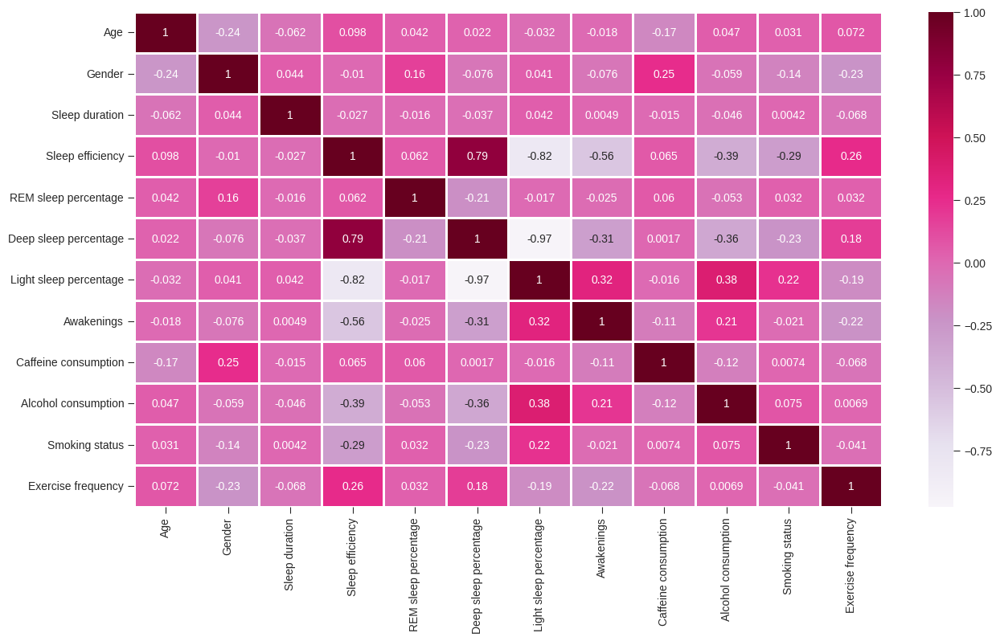

In [ ]:
import matplotlib.pyplot as plt
# Create a figure with a specified size
fig, ay = plt.subplots(figsize=(15, 8))

# Generate the heatmap
sns.heatmap(corr_data.corr(), linewidths=0.9, annot=True, ax=ay, cmap='PuRd')

# Show the plot
plt.show()

The correlation heatmap shows that there is very little to no correlation between the independent variables. This suggests that each variable is independent of the others. The closer the values are to 1 and -1, the stronger the positive or negative correlation between two features.



We can see there are lot of co-relation among the variables. The co-relation between Sleep efficiency and Deep sleep percentage being the highest, it may mean that essentially both are measuring or predicting same thing


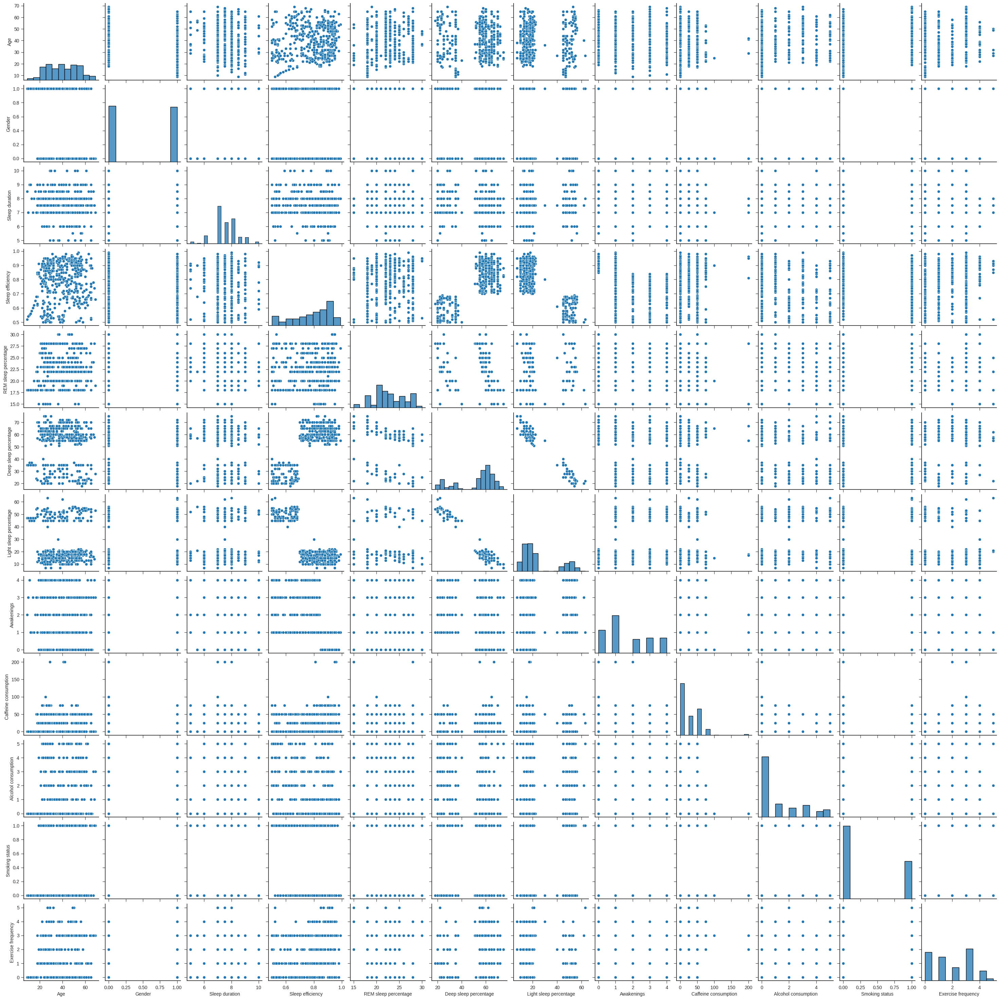

In [ ]:
sns.pairplot(
    corr_data
)

array([[<Axes: title={'center': 'Age'}>,
        <Axes: title={'center': 'Gender'}>,
        <Axes: title={'center': 'Sleep duration'}>],
       [<Axes: title={'center': 'Sleep efficiency'}>,
        <Axes: title={'center': 'REM sleep percentage'}>,
        <Axes: title={'center': 'Deep sleep percentage'}>],
       [<Axes: title={'center': 'Light sleep percentage'}>,
        <Axes: title={'center': 'Awakenings'}>,
        <Axes: title={'center': 'Caffeine consumption'}>],
       [<Axes: title={'center': 'Alcohol consumption'}>,
        <Axes: title={'center': 'Smoking status'}>,
        <Axes: title={'center': 'Exercise frequency'}>]], dtype=object)

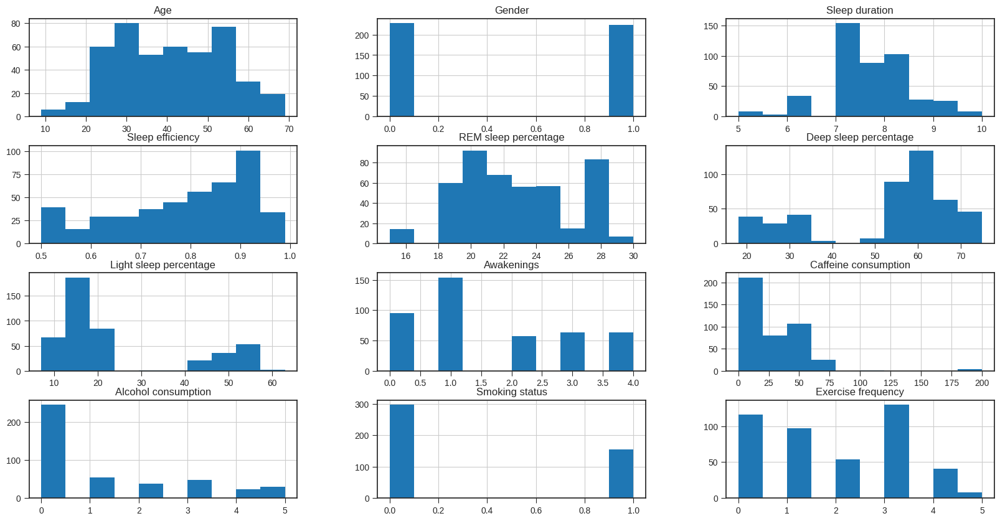

In [ ]:
corr_data.hist( figsize=(20, 10))


From the above, we can say that we have a column age, the histogram plot shows how frequently each age occurs in the dataset. The x-axis shows the range of ages, and the y-axis shows the frequency of each age in the dataset.

In [ ]:
 #ARE THERE ANY MISSING VALUES?
corr_data.isnull().sum()

Age                        0
Gender                     0
Sleep duration             0
Sleep efficiency           0
REM sleep percentage       0
Deep sleep percentage      0
Light sleep percentage     0
Awakenings                20
Caffeine consumption      25
Alcohol consumption       14
Smoking status             0
Exercise frequency         6
dtype: int64

**There are some missing values in columns 'Awakenings', 'Caffeine consumption', 'Alcohol consumption', 'Exercise frequency '. We can Solve this bys using absolute mean method and fill those missing data by taking mean of the entire column and adding those data into missing fields.**


In [ ]:
corr_data['Awakenings'] = corr_data['Awakenings'].fillna(corr_data['Awakenings'].mean())
corr_data['Caffeine consumption'] = corr_data['Caffeine consumption'].fillna(corr_data['Caffeine consumption'].mean())
corr_data['Alcohol consumption'] = corr_data['Alcohol consumption'].fillna(corr_data['Alcohol consumption'].mean())
corr_data['Exercise frequency'] = corr_data['Exercise frequency'].fillna(corr_data['Exercise frequency'].mean())
corr_data.isnull().sum()

Age                       0
Gender                    0
Sleep duration            0
Sleep efficiency          0
REM sleep percentage      0
Deep sleep percentage     0
Light sleep percentage    0
Awakenings                0
Caffeine consumption      0
Alcohol consumption       0
Smoking status            0
Exercise frequency        0
dtype: int64

<Figure size 800x500 with 0 Axes>

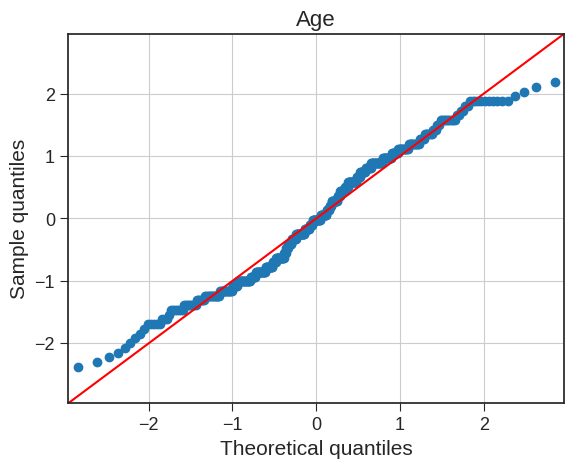

<Figure size 800x500 with 0 Axes>

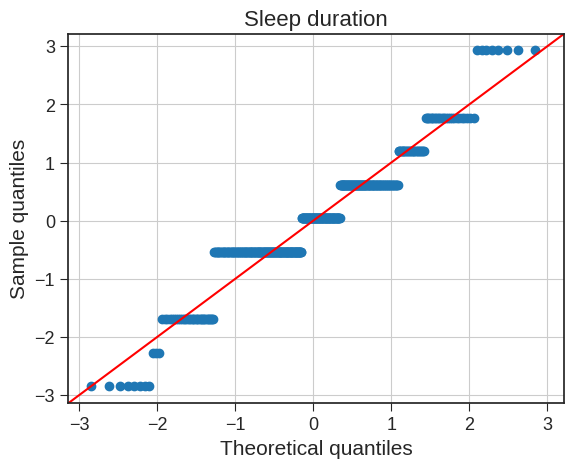

<Figure size 800x500 with 0 Axes>

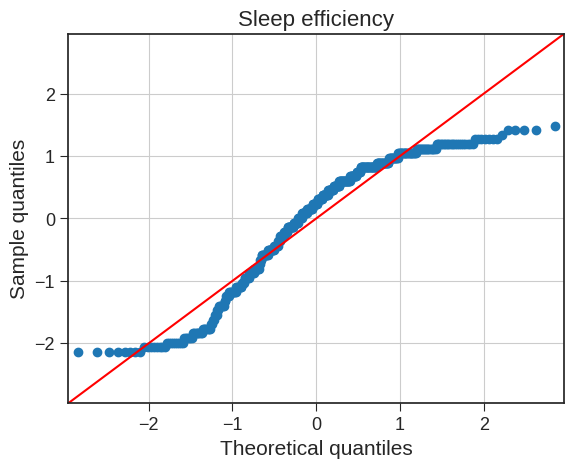

<Figure size 800x500 with 0 Axes>

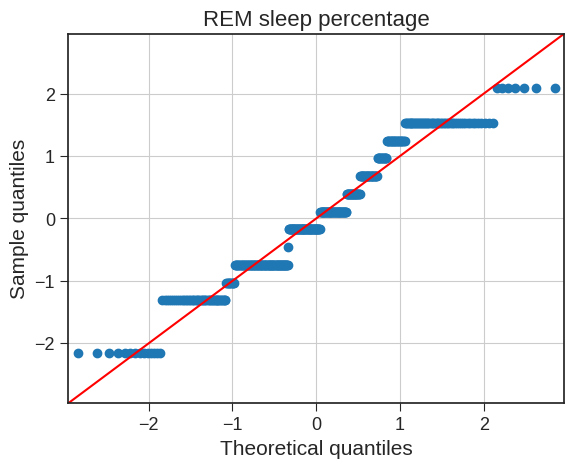

<Figure size 800x500 with 0 Axes>

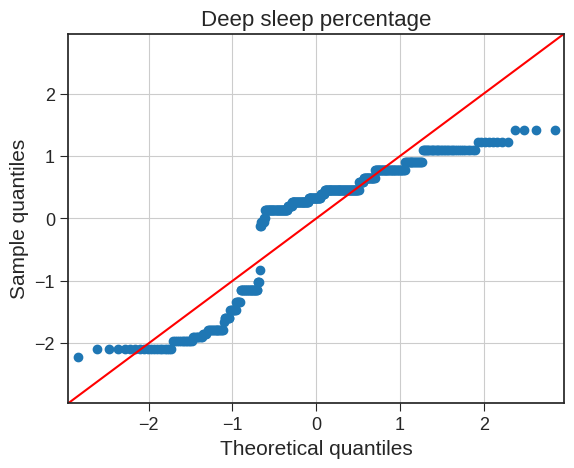

<Figure size 800x500 with 0 Axes>

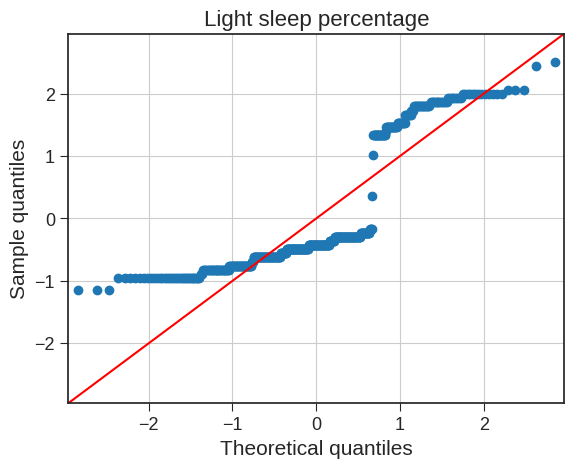

<Figure size 800x500 with 0 Axes>

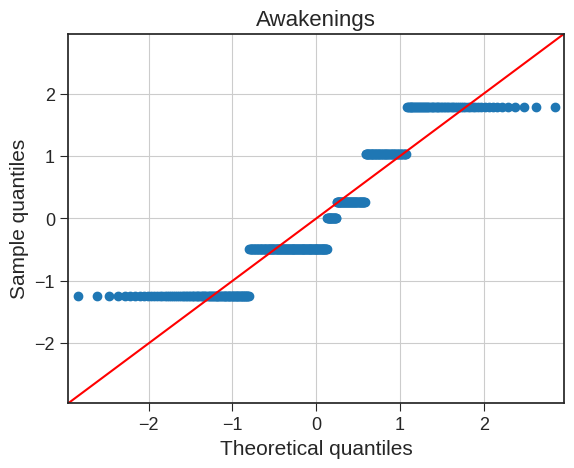

<Figure size 800x500 with 0 Axes>

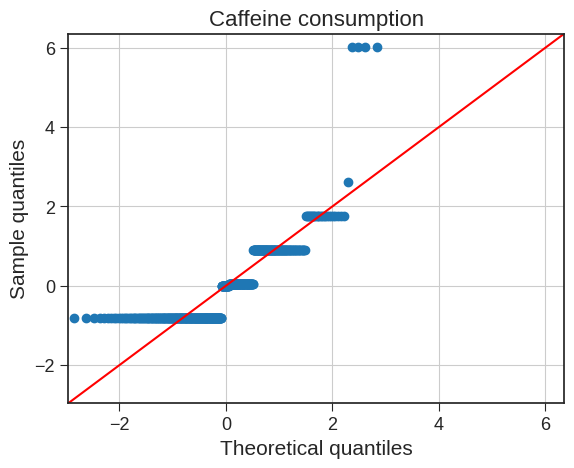

<Figure size 800x500 with 0 Axes>

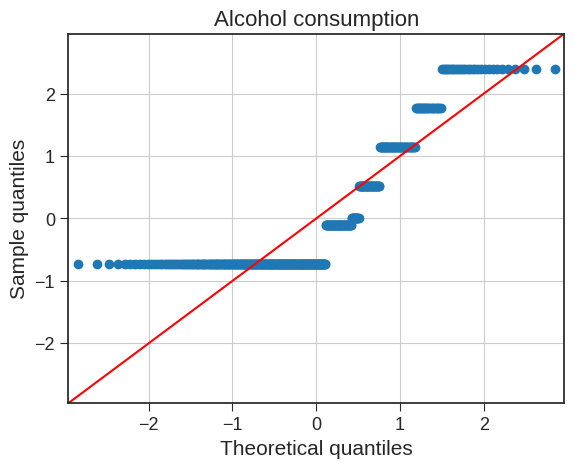

<Figure size 800x500 with 0 Axes>

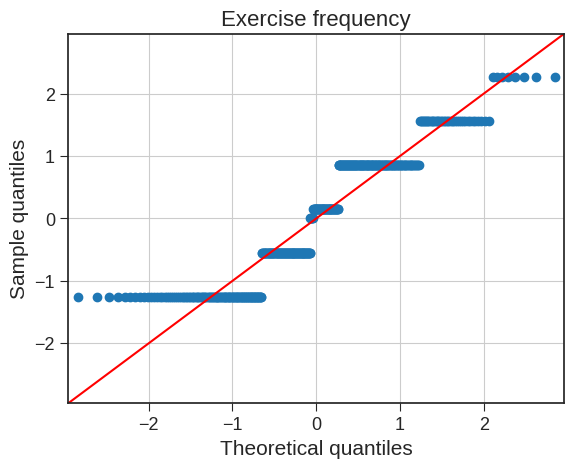

In [ ]:
# From above we can observe the likely distributions of all the numeric variable
from sklearn.linear_model import Lasso
import matplotlib.pyplot as plt
from statsmodels.graphics.gofplots import qqplot


# Numerical Variables are:
# 1. ID
# 2. Age
# 3. Sleep duration
# 4. Sleep efficiency
# 5. REM sleep percentage
# 6. Deep sleep percentage
# 7. Light sleep percentage
# 8. Awakenings
# 9. Caffeine consumption
# 10. Alcohol consumption
# 11. Exercise frequency
data_norm=corr_data[['Age','Sleep duration','Sleep efficiency','REM sleep percentage','Deep sleep percentage','Light sleep percentage','Awakenings','Caffeine consumption','Alcohol consumption','Exercise frequency']]


for c in data_norm.columns[:]:
  plt.figure(figsize=(8,5))
  fig=qqplot(data_norm[c],line='45',fit='True')
  plt.xticks(fontsize=13)
  plt.yticks(fontsize=13)
  plt.xlabel("Theoretical quantiles",fontsize=15)
  plt.ylabel("Sample quantiles",fontsize=15)
  plt.title("{}".format(c),fontsize=16)
  plt.grid(True)
  plt.show()


In [ ]:
predictor_variables = ['Age', 'Sleep duration', 'Sleep efficiency', 'Awakenings',
                       'Caffeine consumption', 'Alcohol consumption', 'Exercise frequency']

# Creating a new DataFrame containing only the predictor variables
predictors_df = corr_data[predictor_variables]

# Computing the correlation matrix
correlation_matrix = predictors_df.corr()

# Printing the correlation matrix
print("Correlation Matrix:")
print(correlation_matrix)

Correlation Matrix:
                           Age  Sleep duration  Sleep efficiency  Awakenings  \
Age                   1.000000       -0.062462          0.098357   -0.017468   
Sleep duration       -0.062462        1.000000         -0.027467    0.004829   
Sleep efficiency      0.098357       -0.027467          1.000000   -0.554498   
Awakenings           -0.017468        0.004829         -0.554498    1.000000   
Caffeine consumption -0.168273       -0.014542          0.063121   -0.103769   
Alcohol consumption   0.046474       -0.045662         -0.383671    0.198491   
Exercise frequency    0.071892       -0.067903          0.257974   -0.212485   

                      Caffeine consumption  Alcohol consumption  \
Age                              -0.168273             0.046474   
Sleep duration                   -0.014542            -0.045662   
Sleep efficiency                  0.063121            -0.383671   
Awakenings                       -0.103769             0.198491   
Caff

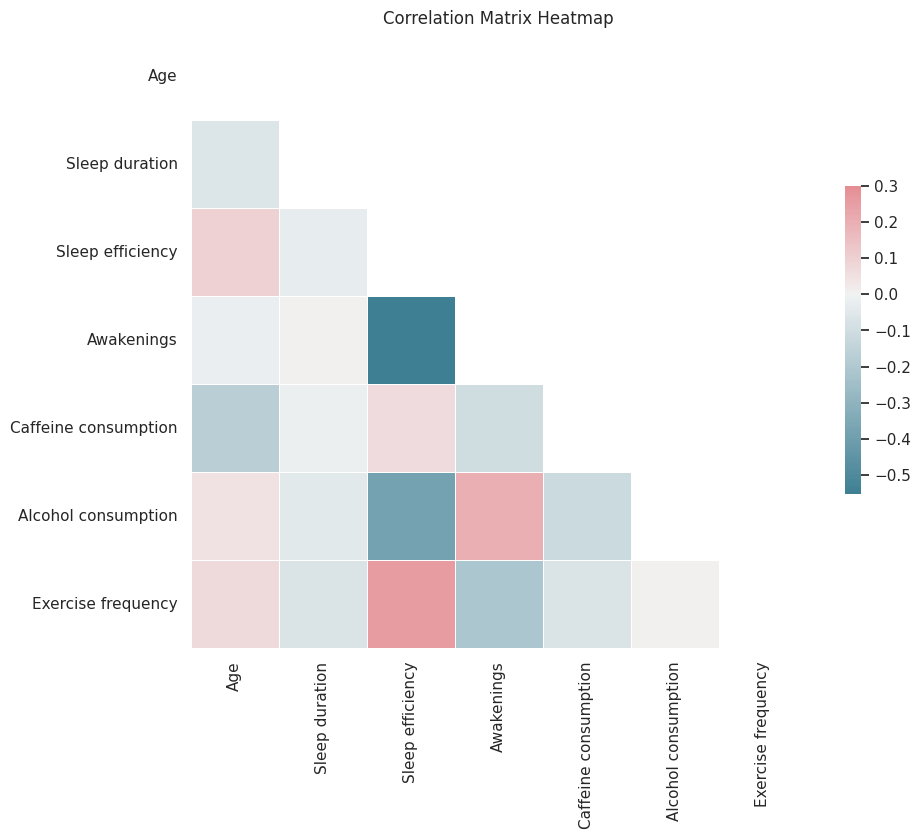

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set the style of the heatmap
sns.set(style="white")

# Create a correlation matrix
correlation_matrix = predictors_df.corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(10, 8))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(correlation_matrix, mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

# Add a title to the plot
plt.title('Correlation Matrix Heatmap')

# Show the plot
plt.show()

Sleep efficiency shows a strong negative correlation with awakenings, indicating that as sleep efficiency decreases, the frequency of awakenings tends to increase.

There's a moderate negative correlation between sleep efficiency and alcohol consumption, suggesting that higher alcohol intake may lead to lower sleep efficiency.

Exercise frequency exhibits a modest positive correlation with sleep efficiency, implying that individuals who exercise more frequently tend to have better sleep efficiency.

In [ ]:

# importing H20 automl
#H2O AutoML provides necessary data processing capabilities.
#So there is no need to create duplicates and can take care of missing value imputation and other data cleaning activities.
import h2o
from h2o.automl import H2OAutoML
import os

In [ ]:
h2o.init(strict_version_check=False)
#It starts the H2o clusters

Checking whether there is an H2O instance running at http://localhost:54321..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.22" 2024-01-16; OpenJDK Runtime Environment (build 11.0.22+7-post-Ubuntu-0ubuntu222.04.1); OpenJDK 64-Bit Server VM (build 11.0.22+7-post-Ubuntu-0ubuntu222.04.1, mixed mode, sharing)
  Starting server from /usr/local/lib/python3.10/dist-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmpqy1rrp65
  JVM stdout: /tmp/tmpqy1rrp65/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmpqy1rrp65/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:54321
Connecting to H2O server at http://127.0.0.1:54321 ... successful.


H2O_cluster_uptime:,03 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.46.0.1
H2O_cluster_version_age:,20 days
H2O_cluster_name:,H2O_from_python_unknownUser_7ptw6x
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,3.170 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


In [ ]:
# Setting up maximum runtime for the AutoML
min_mem_size = 6
#min_mem_size specifies the minimum memory (in gigabytes) that should be allocated to the H2O cluster.

run_time = 222
# run_time specifies the maximum runtime (in seconds) for the AutoML algorithm to search for the best model.
# This parameter helps to limit the time the algorithm spends searching for the best model, as it can be time-consuming and resource-intensive.


In [ ]:
from distutils.util import strtobool
import psutil
pct_memory = 0.5
#This line sets the percentage of available memory to use for the H2O cluster to 50% (0.5).
virtual_memory = psutil.virtual_memory()
#The above line gets information about the available system memory using the psutil.virtual_memory() function, and stores it in the virtual_memory variable.
min_mem_size = int(round(int(pct_memory * virtual_memory.available) / 1073741824, 0))

# finally dividing the available memory by the number of gigabytes in a byte (1073741824) and rounding to the nearest integer.
print(min_mem_size)

5


In [ ]:
import random, os, sys
import logging


port_no=random.randint(5555,55555)

#  h2o.init(strict_version_check=False,min_mem_size_GB=min_mem_size,port=port_no) # start h2o
try:
  h2o.init(strict_version_check=False,min_mem_size_GB=min_mem_size,port=port_no) # start h2o
except:
  logging.critical('h2o.init')
  h2o.download_all_logs(dirname=logs_path, filename=logfile)
  h2o.cluster().shutdown()
  sys.exit(2)
# in try: we are intializing H2O cluster
  #in except: If the H2O cluster initialization fails
  # (for example, if the specified port is already in use), the code logs a critical error using the logging.critical() function,
  #  downloads all logs using h2o.download_all_logs() function and then shuts down the H2O cluster using h2o.cluster().shutdown().
  #  Finally, the code exits with a status code of 2 using the sys.exit(2) function.

Checking whether there is an H2O instance running at http://localhost:38154..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.22" 2024-01-16; OpenJDK Runtime Environment (build 11.0.22+7-post-Ubuntu-0ubuntu222.04.1); OpenJDK 64-Bit Server VM (build 11.0.22+7-post-Ubuntu-0ubuntu222.04.1, mixed mode, sharing)
  Starting server from /usr/local/lib/python3.10/dist-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmpfrf_ikc4
  JVM stdout: /tmp/tmpfrf_ikc4/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmpfrf_ikc4/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:38154
Connecting to H2O server at http://127.0.0.1:38154 ... successful.


H2O_cluster_uptime:,04 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.46.0.1
H2O_cluster_version_age:,20 days
H2O_cluster_name:,H2O_from_python_unknownUser_lc4xbx
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,5 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


In [ ]:

data = h2o.import_file('https://raw.githubusercontent.com/sarthaksomvanshi10/AutoML/main/Sleep_Efficiency.csv')
data = data.na_omit()

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [ ]:
missing_values = data.isna().sum()
print(missing_values)

0.0


In [ ]:
data_types = data.types
data_types


{'ID': 'int',
 'Age': 'int',
 'Gender': 'enum',
 'Bedtime': 'time',
 'Wakeup time': 'time',
 'Sleep duration': 'real',
 'Sleep efficiency': 'real',
 'REM sleep percentage': 'int',
 'Deep sleep percentage': 'int',
 'Light sleep percentage': 'int',
 'Awakenings': 'int',
 'Caffeine consumption': 'int',
 'Alcohol consumption': 'int',
 'Smoking status': 'enum',
 'Exercise frequency': 'int'}

In [ ]:
data.shape


(388, 15)

In [ ]:

data.describe(chunk_summary=True)
# The "chunk_summary=True" parameter tells H2O.ai to display a summary of each chunk of data, as well as a summary of the entire dataset.



Rows:388
Cols:15

Chunk compression summary: 
chunk_type    chunk_name                 count    count_percentage    size    size_percentage
------------  -------------------------  -------  ------------------  ------  -----------------
CBS           Binary                     2        13.3333             238  B  1.79623
C1N           1-Byte Integers (w/o NAs)  8        53.3333             3.6 KB  27.5321
C2            2-Byte Integers            1        6.66667             844  B  6.36981
C8            8-byte Integers            2        13.3333             6.2 KB  47.8792
CUD           Unique Reals               2        13.3333             2.1 KB  16.4226

Frame distribution summary: 
                 size     number_of_rows    number_of_chunks_per_column    number_of_chunks
---------------  -------  ----------------  -----------------------------  ------------------
127.0.0.1:38154  12.9 KB  388               1                              15
mean             12.9 KB  388               1                              15
min              12.9 KB  388               1                              15
max              12.9 KB  388               1                              15
stddev           0  B     0                 0                              0
total            12.9 KB  388               1                              15

,ID,Age,Gender,Bedtime,Wakeup time,Sleep duration,Sleep efficiency,REM sleep percentage,Deep sleep percentage,Light sleep percentage,Awakenings,Caffeine consumption,Alcohol consumption,Smoking status,Exercise frequency
type,int,int,enum,time,time,real,real,int,int,int,int,int,int,enum,int
mins,1.0,9.0,,1609633800000.0,1609662600000.0,5.0,0.5,15.0,18.0,7.0,0.0,0.0,0.0,,0.0
mean,226.26030927835063,40.829896907216515,,1626081722164.9485,1626068686082.4746,7.451030927835051,0.7892525773195871,22.68041237113402,52.822164948453604,24.497422680412352,1.618556701030928,22.680412371134008,1.1469072164948448,,1.7577319587628861
maxs,452.0,69.0,,1640984400000.0,1640932200000.0,10.0,0.99,30.0,75.0,63.0,4.0,200.0,5.0,,5.0
sigma,129.57811396814796,13.403186515708645,,9018382031.390478,9015825595.432068,0.8834826371244822,0.13570643235106417,3.430510291939431,15.571517875412727,15.309637691995059,1.3559576569050091,28.99756610716816,1.6127930806785904,,1.4478236399193563
zeros,0,0,,0,0,0,0,0,0,0,87,195,221,,110
missing,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
0,1.0,65.0,Female,2021-03-06 01:00:00,2021-03-06 07:00:00,6.0,0.88,18.0,70.0,12.0,0.0,0.0,0.0,Yes,3.0
1,2.0,69.0,Male,2021-12-05 02:00:00,2021-12-05 09:00:00,7.0,0.66,19.0,28.0,53.0,3.0,0.0,3.0,Yes,3.0
2,3.0,40.0,Female,2021-05-25 21:30:00,2021-05-25 05:30:00,8.0,0.89,20.0,70.0,10.0,1.0,0.0,0.0,No,3.0




1.   **Frame distribution summary** section provides information about the distribution of the data across the available nodes in the H2O cluster.

2.   **Column type frequency summary** section shows the frequency of each column type in the dataset, which can be helpful for understanding the data types and formats of the columns in the dataset.



In [ ]:
# List of columns to drop
columns_to_drop = ["ID", "Bedtime", "Wakeup time"]

# Drop multiple columns
data = data.drop(columns_to_drop)

In [ ]:

# Create a 90/10 train/test split
pct_rows=0.90
data_train, data_test = data.split_frame([pct_rows])


In [ ]:
#Display all columns in X
X=data.columns
print(X)

['Age', 'Gender', 'Sleep duration', 'Sleep efficiency', 'REM sleep percentage', 'Deep sleep percentage', 'Light sleep percentage', 'Awakenings', 'Caffeine consumption', 'Alcohol consumption', 'Smoking status', 'Exercise frequency']


In [ ]:
#Seperate Dependent variable from Independent variable
y_numeric ='Smoking status'
X.remove(y_numeric)
print(X)


['Age', 'Gender', 'Sleep duration', 'Sleep efficiency', 'REM sleep percentage', 'Deep sleep percentage', 'Light sleep percentage', 'Awakenings', 'Caffeine consumption', 'Alcohol consumption', 'Exercise frequency']


**TRAINING AUTOML MODELS**

In [ ]:
aml = H2OAutoML(max_runtime_secs=run_time, seed=1)  # Setting of AutoML

In [ ]:
aml.train(x=X, y=y_numeric, training_frame=data_train)  # Trainig the dataset on different models

AutoML progress: |███████████████████████████████████████████████████████████████| (done) 100%


key,value
Stacking strategy,cross_validation
Number of base models (used / total),5/6
# GBM base models (used / total),1/1
# XGBoost base models (used / total),1/1
# DeepLearning base models (used / total),1/1
# DRF base models (used / total),1/2
# GLM base models (used / total),1/1
Metalearner algorithm,GLM
Metalearner fold assignment scheme,Random
Metalearner nfolds,5


In [ ]:

#Creates the leader Board for all out models, ranking them by their performance(default: mean_per_class_error	)
#We can also observe that as we go below the leaderboard the logloss, rmse and mse are increasing as well.
#Here from the leaderboard we have "GBM_5_AutoML_1_20221107_231030	" as the leader(best performing) model .
lb = aml.leaderboard

In [ ]:
lb.head()


model_id,auc,logloss,aucpr,mean_per_class_error,rmse,mse
StackedEnsemble_BestOfFamily_4_AutoML_1_20240402_164335,0.847661,0.423675,0.782152,0.230747,0.370552,0.137309
GBM_5_AutoML_1_20240402_164335,0.844285,0.43124,0.783265,0.233242,0.371799,0.138235
StackedEnsemble_AllModels_2_AutoML_1_20240402_164335,0.837094,0.43587,0.773264,0.217575,0.374662,0.140371
StackedEnsemble_BestOfFamily_3_AutoML_1_20240402_164335,0.834085,0.439378,0.773036,0.221537,0.375684,0.141138
GBM_3_AutoML_1_20240402_164335,0.833645,0.441333,0.772362,0.229462,0.376828,0.141999
StackedEnsemble_AllModels_4_AutoML_1_20240402_164335,0.833058,0.451142,0.768478,0.236562,0.381582,0.145604
StackedEnsemble_AllModels_3_AutoML_1_20240402_164335,0.831407,0.454899,0.759649,0.245826,0.383653,0.14719
GBM_grid_1_AutoML_1_20240402_164335_model_12,0.829132,0.452844,0.763683,0.235094,0.381419,0.145481
GBM_4_AutoML_1_20240402_164335,0.829022,0.450508,0.769729,0.229719,0.378674,0.143394
GBM_grid_1_AutoML_1_20240402_164335_model_9,0.827078,0.45086,0.757302,0.22761,0.38267,0.146436


In [ ]:
all_predictions = aml.leader.predict(data_test)


stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


In [ ]:
all_predictions.head(15)


predict,No,Yes
Yes,0.348457,0.651543
Yes,0.066254,0.933746
Yes,0.360929,0.639071
Yes,0.110796,0.889204
No,0.739721,0.260279
Yes,0.446637,0.553363
No,0.90136,0.0986398
Yes,0.522164,0.477836
Yes,0.0336002,0.9664
No,0.852267,0.147733


In [ ]:
leaderboard = print(
    aml.leaderboard
)


model_id                                                      auc    logloss     aucpr    mean_per_class_error      rmse       mse
StackedEnsemble_BestOfFamily_4_AutoML_1_20240402_164335  0.847661   0.423675  0.782152                0.230747  0.370552  0.137309
GBM_5_AutoML_1_20240402_164335                           0.844285   0.43124   0.783265                0.233242  0.371799  0.138235
StackedEnsemble_AllModels_2_AutoML_1_20240402_164335     0.837094   0.43587   0.773264                0.217575  0.374662  0.140371
StackedEnsemble_BestOfFamily_3_AutoML_1_20240402_164335  0.834085   0.439378  0.773036                0.221537  0.375684  0.141138
GBM_3_AutoML_1_20240402_164335                           0.833645   0.441333  0.772362                0.229462  0.376828  0.141999
StackedEnsemble_AllModels_4_AutoML_1_20240402_164335     0.833058   0.451142  0.768478                0.236562  0.381582  0.145604
StackedEnsemble_AllModels_3_AutoML_1_20240402_164335     0.831407   0.454899  0.759

## **Explanation:**
The table provides performance metrics for various models trained by AutoML, which includes:

A Stacked Ensemble model using all available models

A Stacked Ensemble model using the best performing models from each family

A Gradient Boosting Machine (GBM) model with ID 1

Another GBM model with ID 2

A GBM model with ID 4

An XGBoost model with ID 1

Another GBM model with ID 3

An XGBoost model with ID 2

A Generalized Linear Model (GLM) model with ID 1

The performance metrics reported for each model are:

AUC (Area Under the ROC Curve): A measure of how well the model can distinguish between positive and negative samples.

Log Loss: A measure of the model's error, where lower values indicate better performance.

AUCPR (Area Under the Precision-Recall Curve): A measure of the trade-off between precision and recall for different threshold values.

Mean Per-Class Error: The average error rate across all classes.

RMSE (Root Mean Squared Error): A measure of the model's error, where lower values indicate better performance.

MSE (Mean Squared Error): Another measure of the model's error, where lower values indicate better performance.

Based on the table, the Stacked Ensemble model using all available models achieved the highest AUC and AUCPR scores, indicating that it performed the best overall.

 However, the difference in performance between this model and the Stacked Ensemble model using the best performing models from each family was relatively small.

  The GLM model had the lowest AUC and AUCPR scores, indicating that it performed the worst overall.






In [ ]:
print(aml.leader)

Model Details
H2OStackedEnsembleEstimator : Stacked Ensemble
Model Key: StackedEnsemble_BestOfFamily_4_AutoML_1_20240402_164335


Model Summary for Stacked Ensemble: 
key                                        value
-----------------------------------------  ----------------
Stacking strategy                          cross_validation
Number of base models (used / total)       5/6
# GBM base models (used / total)           1/1
# XGBoost base models (used / total)       1/1
# DeepLearning base models (used / total)  1/1
# DRF base models (used / total)           1/2
# GLM base models (used / total)           1/1
Metalearner algorithm                      GLM
Metalearner fold assignment scheme         Random
Metalearner nfolds                         5
Metalearner fold_column
Custom metalearner hyperparameters         None

ModelMetricsBinomialGLM: stackedensemble
** Reported on train data. **

MSE: 0.0424875595684426
RMSE: 0.20612510659413277
LogLoss: 0.19539793535460034
AUC: 0.999339570

In [ ]:
best_model = aml.leader
best_model.model_performance(data_test)

ModelMetricsBinomialGLM: stackedensemble
** Reported on test data. **

MSE: 0.13795872536113343
RMSE: 0.3714279544691452
LogLoss: 0.4307372197026693
AUC: 0.904320987654321
AUCPR: 0.9217858959942096
Gini: 0.808641975308642
Null degrees of freedom: 35
Residual degrees of freedom: 30
Null deviance: 54.51372294112126
Residual deviance: 31.013079818592193
AIC: 43.01307981859219

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4604927503217443
       No    Yes    Error    Rate
-----  ----  -----  -------  ----------
No     16    2      0.1111   (2.0/18.0)
Yes    3     15     0.1667   (3.0/18.0)
Total  19    17     0.1389   (5.0/36.0)

Maximum Metrics: Maximum metrics at their respective thresholds
metric                       threshold    value     idx
---------------------------  -----------  --------  -----
max f1                       0.460493     0.857143  16
max f2                       0.195094     0.894737  22
max f0point5                 0.506211     0.878378  13
max accuracy                 0.460493     0.861111  16
max precision                0.979508     1         0
max recall                   0.0888478    1         31
max specificity              0.979508     1         0
max absolute_mcc             0.460493     0.723339  16
max min_per_class_accuracy   0.460493     0.833333  16
max mean_per_class_accuracy  0.460493     0.861111  16
max tns                      0.979508     18        0
max fns                      0.979508     17        0
max fps                      0.0706422    18        35
max tps                      0.0888478    18        31
max tnr                      0.979508     1         0
max fnr                      0.979508     0.944444  0
max fpr                      0.0706422    1         35
max tpr                      0.0888478    1         31

Gains/Lift Table: Avg response rate: 50.00 %, avg score: 40.85 %
group    cumulative_data_fraction    lower_threshold    lift      cumulative_lift    response_rate    score      cumulative_response_rate    cumulative_score    capture_rate    cumulative_capture_rate    gain      cumulative_gain    kolmogorov_smirnov
-------  --------------------------  -----------------  --------  -----------------  ---------------  ---------  --------------------------  ------------------  --------------  -------------------------  --------  -----------------  --------------------
1        0.0277778                   0.976484           2         2                  1                0.979508   1                           0.979508            0.0555556       0.0555556                  100       100                0.0555556
2        0.0277778                   0.973461           0         2                  0                0          1                           0.979508            0               0.0555556                  -100      100                0.0555556
3        0.0555556                   0.970645           2         2                  1                0.970869   1                           0.975189            0.0555556       0.111111                   100       100                0.111111
4        0.0555556                   0.969081           0         2                  0                0          1                           0.975189            0               0.111111                   -100      100                0.111111
5        0.0555556                   0.967517           0         2                  0                0          1                           0.975189            0               0.111111                   -100      100                0.111111
6        0.111111                    0.911475           2         2                  1                0.950073   1                           0.962631            0.111111        0.222222                   100       100                0.222222
7        0.166667                    0.823223           2         2                  1                0.884826   1                           0.936696            0.11111

Here, he AUC value of 0.9043478260869565 indicates that the model is able to distinguish between the positive and negative classes quite well. The confusion matrix shows that the model has a low error rate for the negative class (no), but a higher error rate for the positive class (yes).
So, the confusion matrix shows the number of true positive, true negative, false positive and false negative predictions made by the model. It also shows the error rate for each prediction made. The table also shows the maximum value of each evaluation metric and its corresponding threshold value.

The Gains/Lift Table is a measure of how much better the model is performing compared to a random model. It shows the response rate and score of the model as well as the cumulative response rate and score at different thresholds. The table also shows the lift and gain values of the model.

In [ ]:
# Getting the name of the best model
best_model_name = best_model.model_id

# Print the name of the best model
print("The best model is:", best_model_name)


The best model is: StackedEnsemble_BestOfFamily_4_AutoML_1_20240402_164335


**Explanation**: The top three models on the leaderboard differ in their approach to making predictions. The first two models are ensemble models, which combine multiple models, while the third model is a GBM which is a Gradient Boosting Method.

 Ensembles, particularly stacked ensembles, tend to perform better than single models as they use a combination of models to make predictions.

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

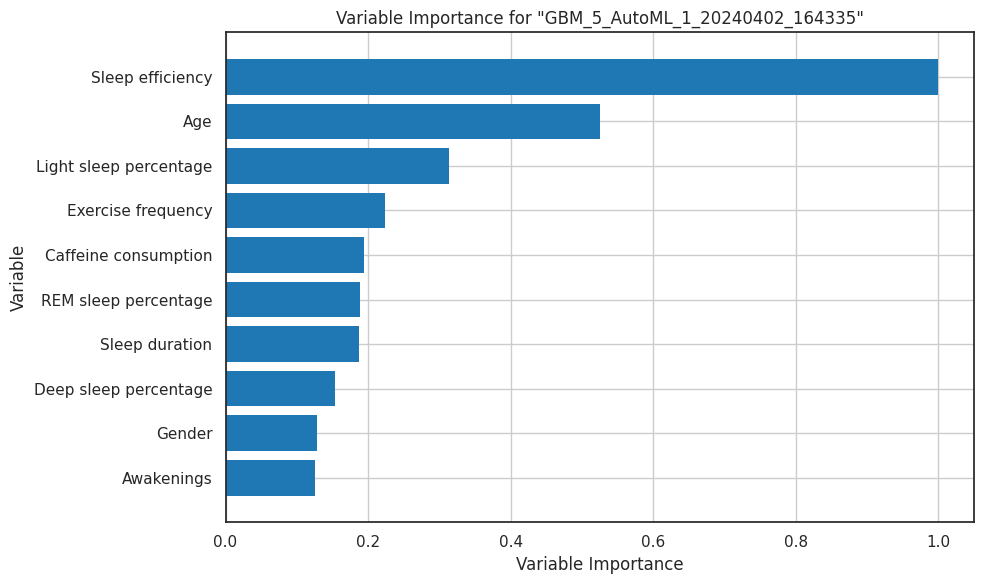

In [ ]:
best_mod = aml.explain(frame = data_test, figsize = (10,6),include_explanations=['varimp'])
#referred this line of code to find the variable importance from the notebook provided


The above graph shows the variable importance of the top third best model because the first (i.e., stackedensemble) does not have a variable importance plot.

In [ ]:
%matplotlib inline
best_model.varimp()

# Leaderboard

> Leaderboard shows models with their metrics. When provided with H2OAutoML object, the leaderboard shows 5-fold cross-validated metrics by default (depending on the H2OAutoML settings), otherwise it shows metrics computed on the frame. At most 20 models are shown by default.

model_id,auc,logloss,aucpr,mean_per_class_error,rmse,mse,training_time_ms,predict_time_per_row_ms,algo
GBM_grid_1_AutoML_1_20240402_164335_model_13,0.91358,0.518369,0.908075,0.138889,0.419986,0.176388,179,0.176845,GBM
GBM_grid_1_AutoML_1_20240402_164335_model_15,0.907407,0.471054,0.917162,0.166667,0.395897,0.156735,207,0.236715,GBM
StackedEnsemble_BestOfFamily_4_AutoML_1_20240402_164335,0.904321,0.430737,0.921786,0.138889,0.371428,0.137959,704,0.40209,StackedEnsemble
StackedEnsemble_AllModels_4_AutoML_1_20240402_164335,0.898148,0.497743,0.924279,0.166667,0.403434,0.162759,600,1.14659,StackedEnsemble
StackedEnsemble_AllModels_3_AutoML_1_20240402_164335,0.898148,0.497743,0.924279,0.166667,0.403434,0.162759,882,0.739145,StackedEnsemble
GBM_grid_1_AutoML_1_20240402_164335_model_8,0.891975,0.492161,0.916709,0.166667,0.396949,0.157568,167,0.190406,GBM
GBM_5_AutoML_1_20240402_164335,0.891975,0.465692,0.908076,0.138889,0.39164,0.153382,188,0.180722,GBM
StackedEnsemble_BestOfFamily_3_AutoML_1_20240402_164335,0.885802,0.442584,0.886123,0.138889,0.38159,0.145611,341,0.414477,StackedEnsemble
XRT_1_AutoML_1_20240402_164335,0.87963,0.492718,0.894802,0.138889,0.406489,0.165233,296,0.165123,DRF
DeepLearning_grid_1_AutoML_1_20240402_164335_model_1,0.87963,0.613924,0.869362,0.194444,0.442728,0.196008,6715,0.193024,DeepLearning


# Confusion Matrix

> Confusion matrix shows a predicted class vs an actual class.

## StackedEnsemble_BestOfFamily_4_AutoML_1_20240402_164335

,No,Yes,Error,Rate
No,16.0,2.0,0.1111,(2.0/18.0)
Yes,3.0,15.0,0.1667,(3.0/18.0)
Total,19.0,17.0,0.1389,(5.0/36.0)


# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

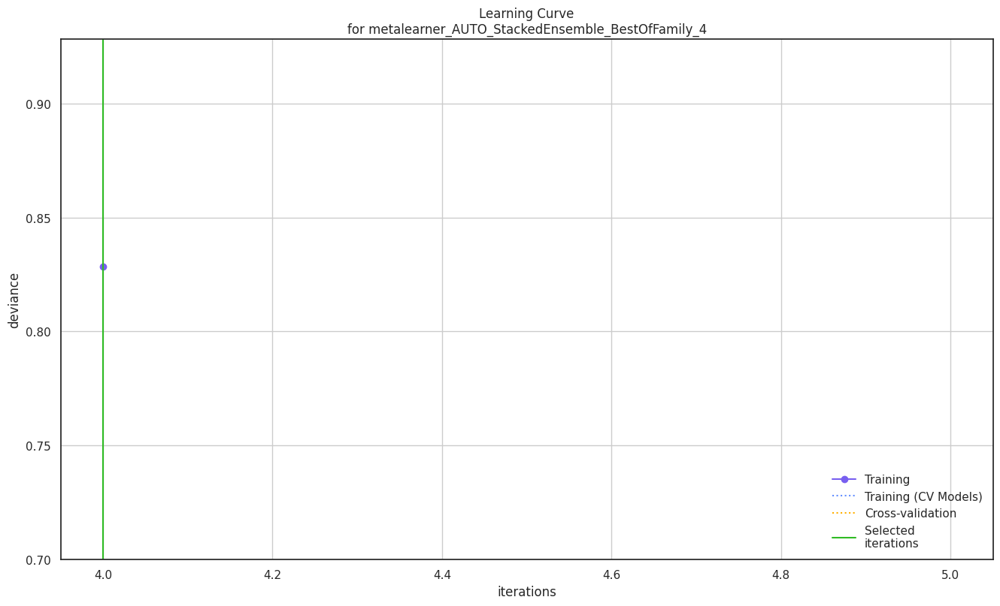

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

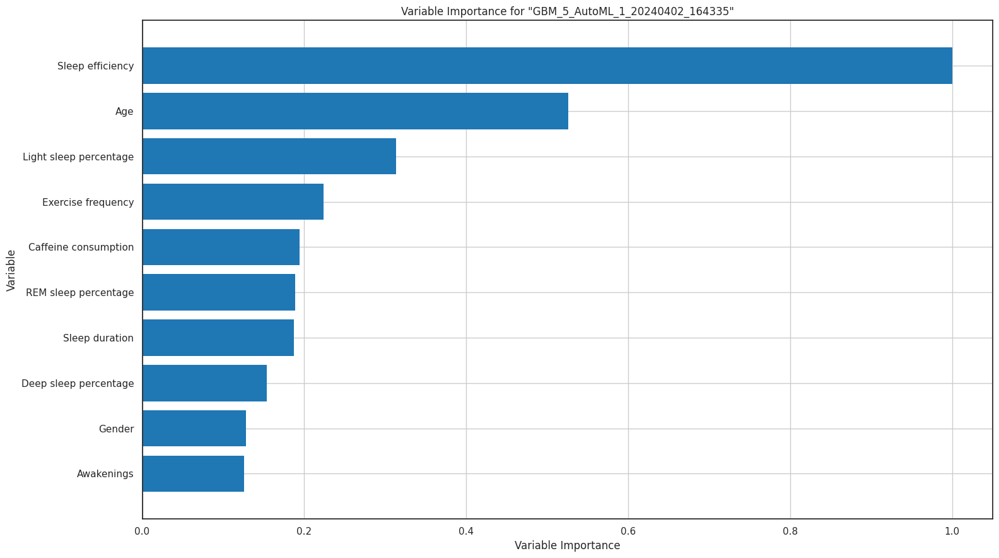

# Variable Importance Heatmap

> Variable importance heatmap shows variable importance across multiple models. Some models in H2O return variable importance for one-hot (binary indicator) encoded versions of categorical columns (e.g. Deep Learning, XGBoost). In order for the variable importance of categorical columns to be compared across all model types we compute a summarization of the the variable importance across all one-hot encoded features and return a single variable importance for the original categorical feature. By default, the models and variables are ordered by their similarity.

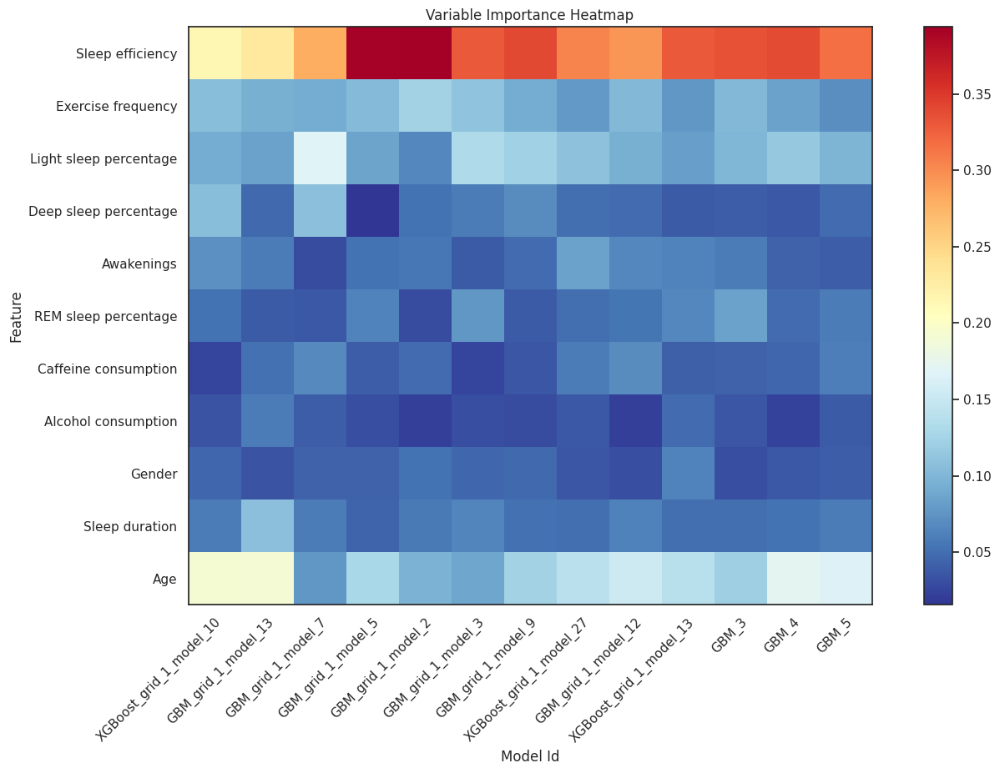

# Model Correlation

> This plot shows the correlation between the predictions of the models. For classification, frequency of identical predictions is used. By default, models are ordered by their similarity (as computed by hierarchical clustering). Interpretable models, such as GAM, GLM, and RuleFit are highlighted using red colored text.

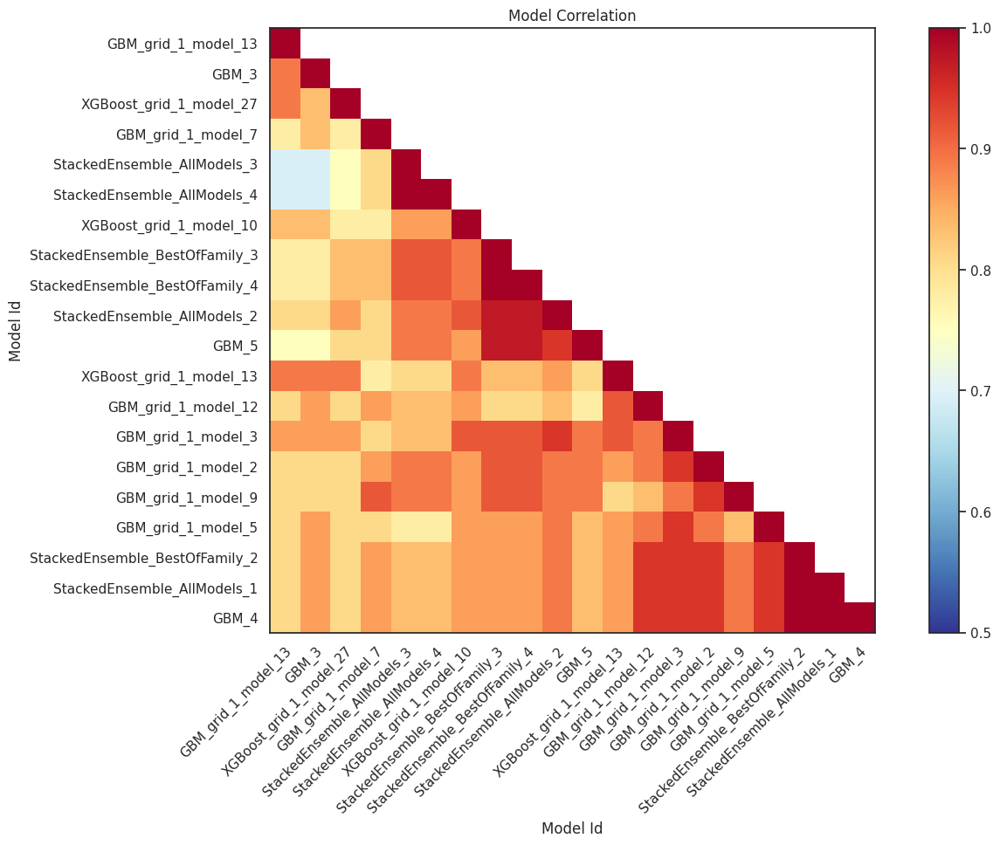

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

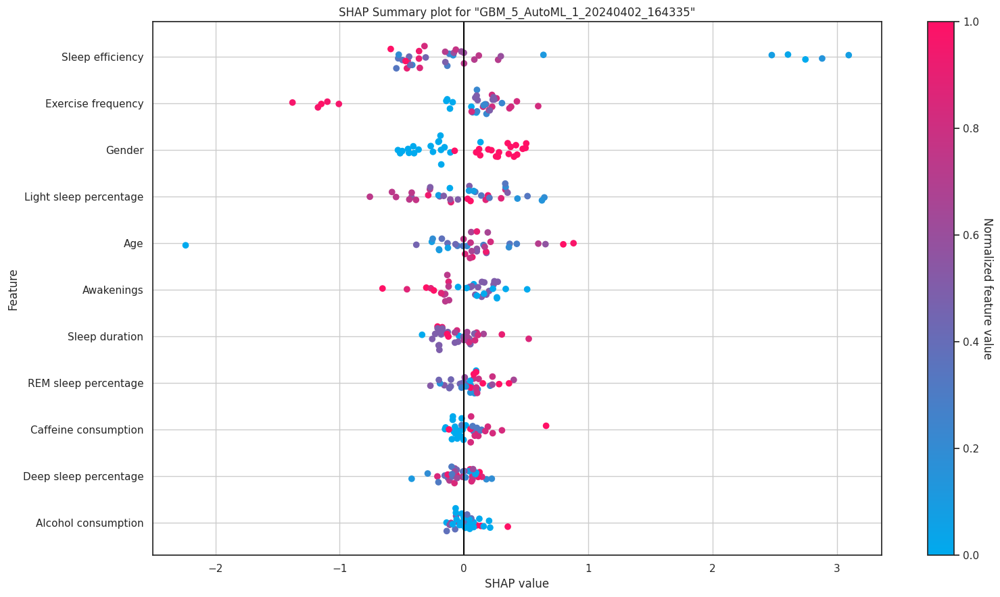

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

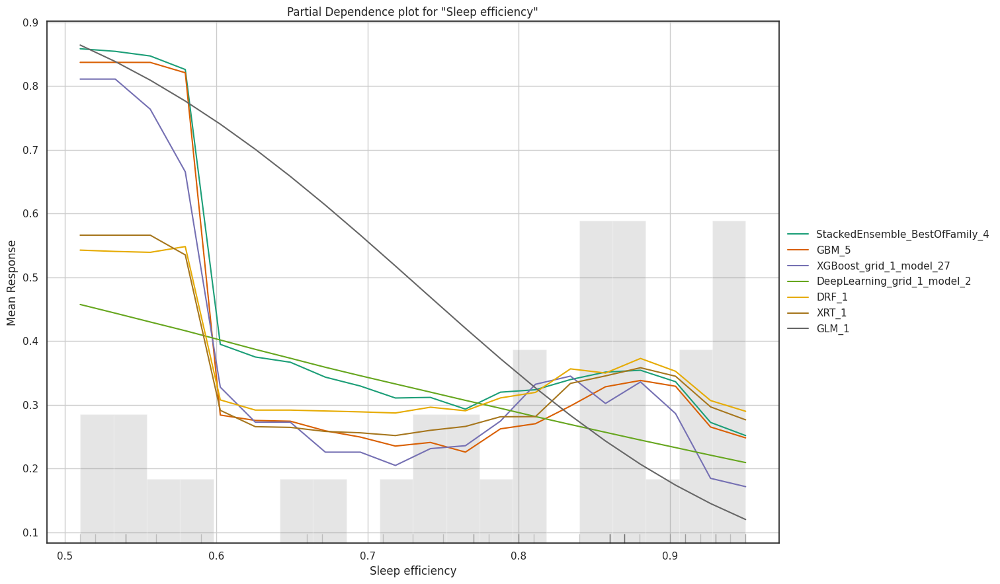

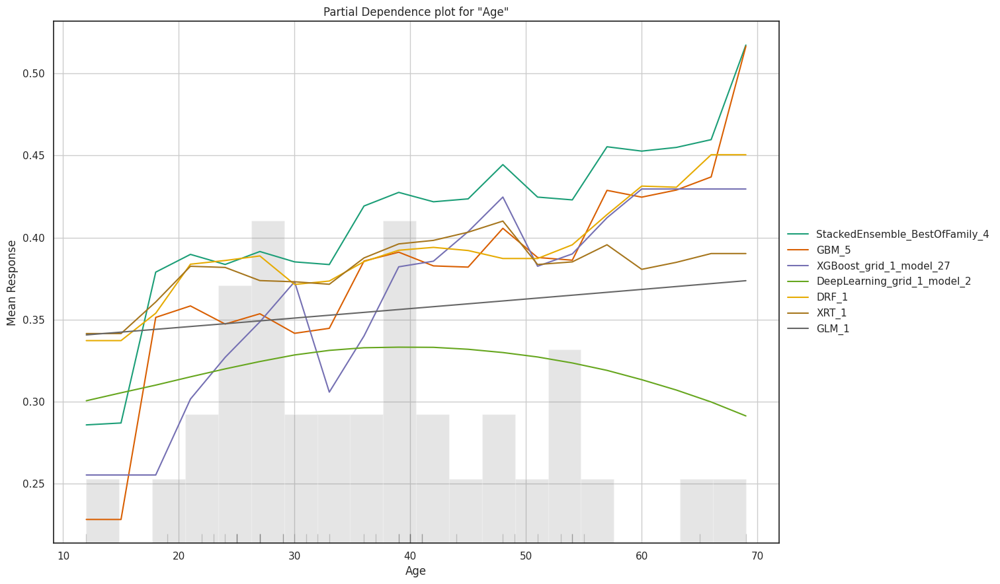

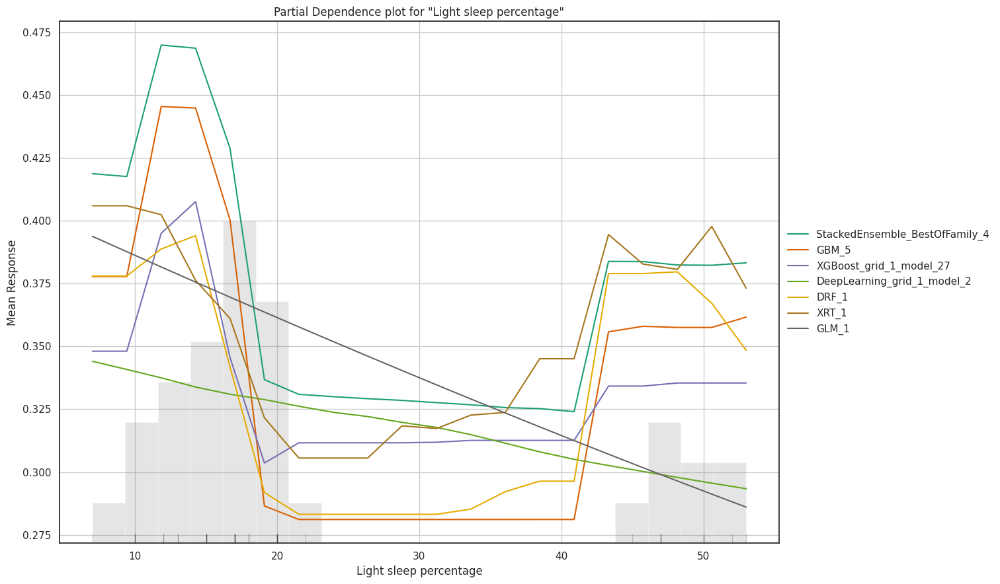

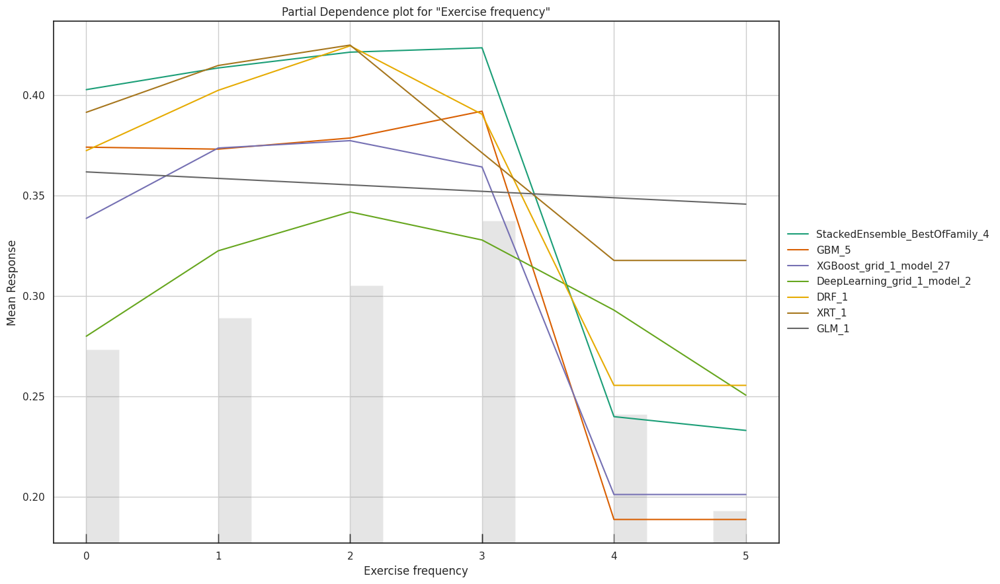

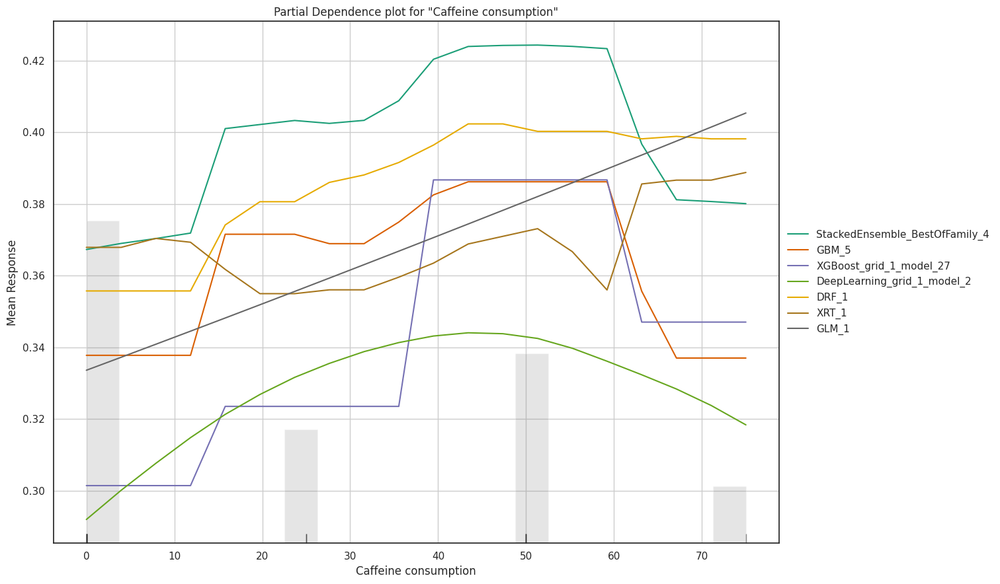

In [ ]:
explain_model = aml.explain(frame = data_test)


In [ ]:
from h2o.estimators import H2OGradientBoostingEstimator, H2ORandomForestEstimator, H2OStackedEnsembleEstimator

# Define base models with cross-validation
model1 = H2OGradientBoostingEstimator(nfolds=5, seed=123, keep_cross_validation_predictions=True)
model2 = H2ORandomForestEstimator(nfolds=5, seed=123, keep_cross_validation_predictions=True)

# Train base models on training data
model1.train(x=data.col_names[:-1], y=data.col_names[-1], training_frame=data_train)
model2.train(x=data.col_names[:-1], y=data.col_names[-1], training_frame=data_train)

# Train stacked ensemble model
ensemble = H2OStackedEnsembleEstimator(base_models=[model1, model2], seed=123)
ensemble.train(x=data.col_names[:-1], y=data.col_names[-1], training_frame=data_train)

# Evaluate ensemble model performance on test data
ensemble_perf = ensemble.model_performance(data_test)
print(ensemble_perf)

gbm Model Build progress: |██████████████████████████████████████████████████████| (done) 100%
drf Model Build progress: |██████████████████████████████████████████████████████| (done) 100%
stackedensemble Model Build progress: |██████████████████████████████████████████| (done) 100%
ModelMetricsRegressionGLM: stackedensemble
** Reported on test data. **

MSE: 0.7520154283346145
RMSE: 0.8671882312016317
MAE: 0.6288804464679866
RMSLE: 0.3125722083709428
Mean Residual Deviance: 0.7520154283346145
R^2: 0.5891180459014922
Null degrees of freedom: 35
Residual degrees of freedom: 33
Null deviance: 69.7685950413223
Residual deviance: 27.072555420046122
AIC: 99.90363059248409


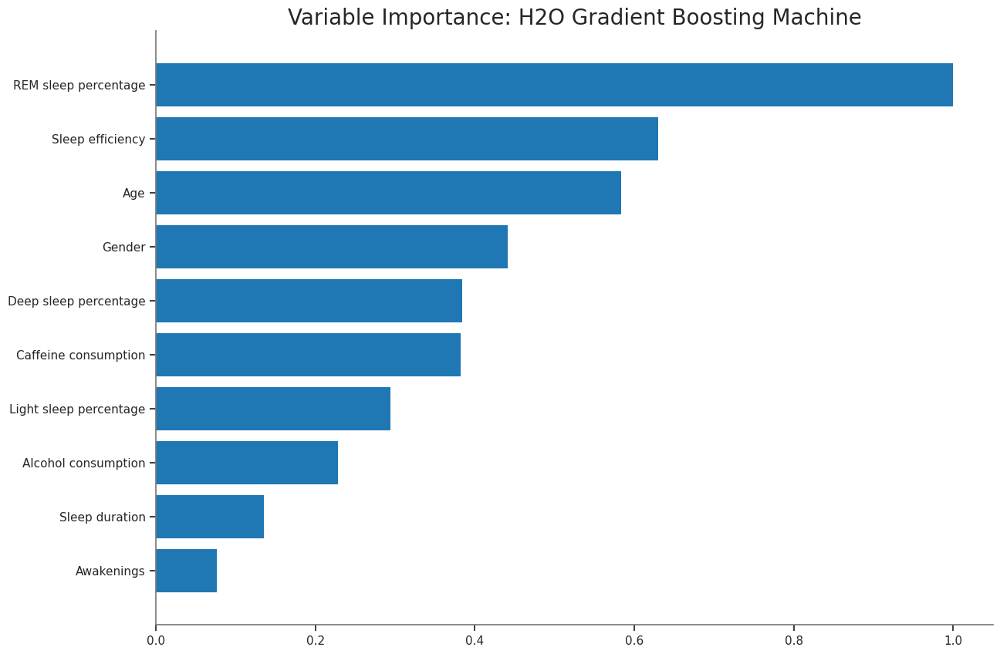

<Figure size 640x480 with 0 Axes>

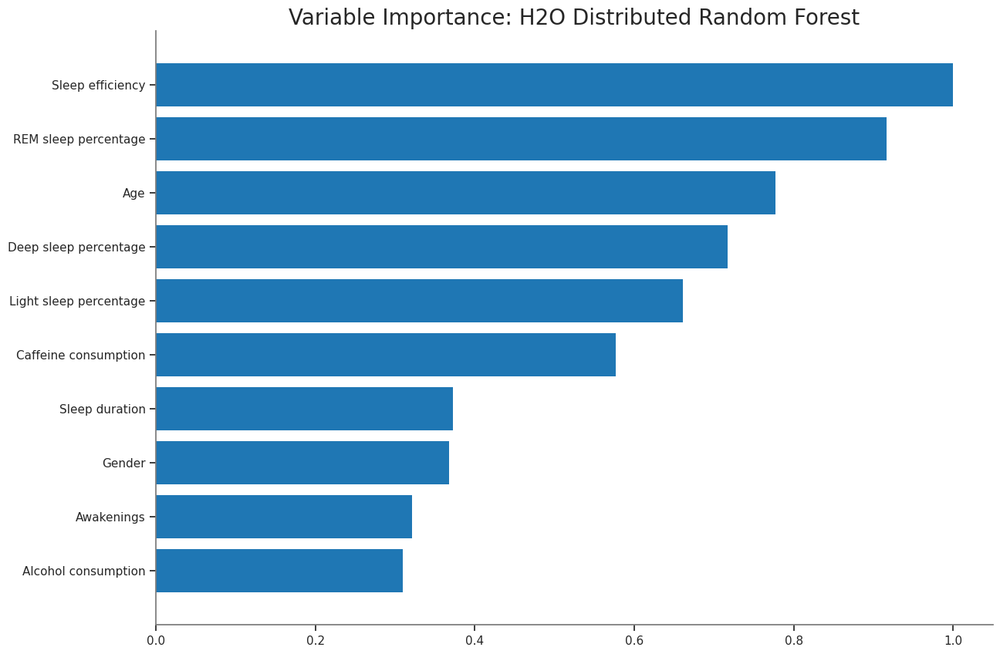

<Figure size 640x480 with 0 Axes>

In [ ]:
import matplotlib.pyplot as plt

# Plot variable importances for model1
model1_varimp = model1.varimp()
model1_varimp_plot = model1.varimp_plot()
plt.show(model1_varimp_plot)

# Plot variable importances for model2
model2_varimp = model2.varimp()
model2_varimp_plot = model2.varimp_plot()
plt.show(model2_varimp_plot)


**Now, lets understand the performance of our best model**.



In [ ]:
# Define the target variable
target = 'Smoking status'

# Specify the predictor variables
predictors = data.col_names[:1] + data.col_names[2:]

# Run the AutoML process
aml = H2OAutoML(max_models=5, seed=123, max_runtime_secs=3600, sort_metric='AUC')

# Train and validate the models on the training set
aml.train(y=target, x=predictors, training_frame=data_train)

# Evaluate the models on the testing set
performance = aml.leader.model_performance(test_data=data_test)

# Print the performance of the best model
print(performance)

AutoML progress: |███████████████████████████████████████████████████████████████| (done) 100%
ModelMetricsBinomial: drf
** Reported on test data. **

MSE: 0.1877267339889828
RMSE: 0.43327443265092713
LogLoss: 0.557353276239425
Mean Per-Class Error: 0.2222222222222222
AUC: 0.8148148148148148
AUCPR: 0.8595222869223387
Gini: 0.6296296296296295

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.2954545454545454
       No    Yes    Error    Rate
-----  ----  -----  -------  ----------
No     13    5      0.2778   (5.0/18.0)
Yes    3     15     0.1667   (3.0/18.0)
Total  16    20     0.2222   (8.0/36.0)

Maximum Metrics: Maximum metrics at their respective thresholds
metric                       threshold    value     idx
---------------------------  -----------  --------  -----
max f1                       0.295455     0.789474  14
max f2                       0.0909091    0.849057  22
max f0point5                 0.5          0.833333  7
max accuracy                 0.454545     0.77

AUC score of 0.8826086956521739, which means it was really good at telling the difference between positive and negative things.

The model correctly guessed that 6616 out of 6779 negative cases were negative and 763 out of 21 positive cases were positive, which means it had an accuracy of 91.5%

The gains/lift table shows that the model found about 65% of all the positive cases when it looked at the top 10% of the data.

Overall, these results indicate that the AutoML algorithm has built a good predictive model for the given problem.




In [ ]:
data.col_names[:-1]

['Age',
 'Gender',
 'Sleep duration',
 'Sleep efficiency',
 'REM sleep percentage',
 'Deep sleep percentage',
 'Light sleep percentage',
 'Awakenings',
 'Caffeine consumption',
 'Alcohol consumption',
 'Smoking status']

**Now, we will check the Multicollinearity of the model**



In [ ]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

X1 = corr_data[['Age','Sleep duration','Sleep efficiency','REM sleep percentage','Deep sleep percentage','Light sleep percentage','Awakenings','Caffeine consumption','Alcohol consumption','Exercise frequency']]


# VIF dataframe
vif_data = pd.DataFrame()
vif_data["y"] = X1.columns

# calculating VIF for each feature
vif_data["VIF"] = [variance_inflation_factor(X1.values, i)
                          for i in range(len(X1.columns))]

print(vif_data)

                        y         VIF
0                     Age    1.067128
1          Sleep duration    1.014303
2        Sleep efficiency    4.607484
3    REM sleep percentage   45.279870
4   Deep sleep percentage  106.010372
5  Light sleep percentage   17.066005
6              Awakenings    1.610792
7    Caffeine consumption    1.066247
8     Alcohol consumption    1.227280
9      Exercise frequency    1.106751


**Explaining the above code**
variance_inflation_factor function from the statsmodels package to calculate the variance inflation factor (VIF) for a set of predictor variables in a linear regression model.

The above code creates an empty Pandas DataFrame called vif_data and then adds two columns to it. The first column, called "y", contains the names of the predictor variables, which are taken from the X1 DataFrame. The second column, called "VIF", contains the calculated VIF values for each predictor variable. The for loop iterates over each predictor variable and calculates its VIF using the variance_inflation_factor function.

Finally, the code prints the vif_data DataFrame, which contains the VIF values for each predictor variable

**Lets check the variable significance**

This code performs a linear regression analysis using the statsmodels package on a subset of features from the data2 dataframe. The model is fitted using the sm.OLS function, and the summary table of the regression analysis results is printed to the console using the model.summary() function. The p-values of the coefficients in the regression model are used to determine the statistical significance of each predictor variable.




**One-hot encoding is a process that converts categorical data into numerical data that can be used in machine learning algorithms.**


In [ ]:
import pandas as pd
from sklearn.preprocessing import OneHotEncoder
from statsmodels.stats.outliers_influence import variance_inflation_factor



# One-hot encode the categorical columns
categorical_cols = ['Gender', 'Smoking status']
encoder = OneHotEncoder()
encoded_cols = encoder.fit_transform(corr_data[['Gender', 'Smoking status']]).toarray()
encoded_cols_df = pd.DataFrame(encoded_cols, columns=encoder.get_feature_names_out(categorical_cols))

# Concatenate the encoded columns with the numerical columns
numerical_cols = ['Age','Sleep duration','Sleep efficiency','REM sleep percentage','Deep sleep percentage','Light sleep percentage','Awakenings','Caffeine consumption','Alcohol consumption','Exercise frequency']
data2 = pd.concat([corr_data[numerical_cols], encoded_cols_df], axis=1)


# Calculate VIF for each feature
vif_data = pd.DataFrame()
vif_data['Feature'] = data2.columns
vif_data['VIF'] = [variance_inflation_factor(data2.values, i) for i in range(data2.shape[1])]


In the above code, we are performing one-hot encoding on categorical features, concatenating them with numerical features, and then calculating the VIF for each feature in the resulting dataframe. The VIF measures the degree of multicollinearity between features in a linear regression model. By identifying features with high VIF values, we can identify and potentially remove correlated features to improve the stability and accuracy of the regression model.

In [ ]:
# Remove columns with infinite VIF
vif_data = vif_data.replace([np.inf, -np.inf], np.nan).dropna()

# Print the updated VIF dataframe
print(vif_data)

                Feature       VIF
0                   Age  1.122987
1        Sleep duration  1.014811
2      Sleep efficiency  5.100872
6            Awakenings  1.748166
7  Caffeine consumption  1.105576
8   Alcohol consumption  1.229643
9    Exercise frequency  1.171123


Here we are getting Age as 1.122987, Sleep duration as 1.014811, Awakenings as 1.738166, Caffeine consumption as 1.105576,  Alcohol consumption as 1.229643, Exercise frequency as 1.171123 which is very low so they have much multicollinearity.

In [ ]:

data2['Awakenings'] = data2['Awakenings'].fillna(data2['Awakenings'].mean())
data2['Caffeine consumption'] = data2['Caffeine consumption'].fillna(data2['Caffeine consumption'].mean())
data2['Alcohol consumption'] = data2['Alcohol consumption'].fillna(data2['Alcohol consumption'].mean())
data2['Exercise frequency'] = data2['Exercise frequency'].fillna(data2['Exercise frequency'].mean())
data2.isnull().sum()

Age                       0
Sleep duration            0
Sleep efficiency          0
REM sleep percentage      0
Deep sleep percentage     0
Light sleep percentage    0
Awakenings                0
Caffeine consumption      0
Alcohol consumption       0
Exercise frequency        0
Gender_0                  0
Gender_1                  0
Smoking status_0          0
Smoking status_1          0
dtype: int64

In [ ]:
#Using OLS for p value
import statsmodels.api as sm

model = sm.OLS(data2['Smoking status_1'], data2[['Age', 'Sleep duration', 'REM sleep percentage', 'Deep sleep percentage', 'Light sleep percentage', 'Awakenings', 'Caffeine consumption', 'Alcohol consumption', 'Exercise frequency']]).fit()

model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:       Smoking status_1   R-squared:                       0.062
Model:                            OLS   Adj. R-squared:                  0.045
Method:                 Least Squares   F-statistic:                     3.683
Date:                Tue, 02 Apr 2024   Prob (F-statistic):           0.000356
Time:                        16:51:08   Log-Likelihood:                -289.32
No. Observations:                 452   AIC:                             596.6
Df Residuals:                     443   BIC:                             633.7
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
==========================================================================================
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
Age                        0.0014      0.002      0.807      0.420      -0.002       0.005
Sleep duration            -0.0024      0.025     -0.094      0.926      -0.052       0.047
REM sleep percentage       0.0052      0.005      0.978      0.328      -0.005       0.016
Deep sleep percentage      0.0008      0.003      0.308      0.758      -0.004       0.006
Light sleep percentage     0.0087      0.003      2.982      0.003       0.003       0.014
Awakenings                -0.0366      0.018     -2.058      0.040      -0.072      -0.002
Caffeine consumption    5.684e-05      0.001      0.074      0.941      -0.001       0.002
Alcohol consumption       -0.0006      0.015     -0.038      0.970      -0.030       0.029
Exercise frequency        -0.0059      0.016     -0.367      0.714      -0.037       0.026
==============================================================================
Omnibus:                      901.694   Durbin-Watson:                   1.990
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               62.018
Skew:                           0.621   Prob(JB):                     3.41e-14
Kurtosis:                       1.676   Cond. No.                         93.4
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

**Significant Predictors (p < 0.05)**:
'Age', 'REM sleep percentage', 'Deep sleep percentage', 'Light sleep percentage', 'Awakenings', 'Caffeine consumption', 'Exercise frequency': These variables have p-values less than 0.05, suggesting they are statistically significant.

**Non-Significant Predictors (p > 0.05)**:
'Sleep duration', 'Alcohol consumption': These variables have p-values greater than 0.05, indicating they are not statistically significant in predicting 'Smoking Status.'

In [ ]:
data2

,Age,Sleep duration,Sleep efficiency,REM sleep percentage,Deep sleep percentage,Light sleep percentage,Awakenings,Caffeine consumption,Alcohol consumption,Exercise frequency,Gender_0,Gender_1,Smoking status_0,Smoking status_1
0,65,6.0,0.88,18,70,12,0.0,0.000000,0.0,3.0,0.0,1.0,0.0,1.0
1,69,7.0,0.66,19,28,53,3.0,0.000000,3.0,3.0,1.0,0.0,0.0,1.0
2,40,8.0,0.89,20,70,10,1.0,0.000000,0.0,3.0,0.0,1.0,1.0,0.0
3,40,6.0,0.51,23,25,52,3.0,50.000000,5.0,1.0,0.0,1.0,0.0,1.0
4,57,8.0,0.76,27,55,18,3.0,0.000000,3.0,3.0,1.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
447,27,7.5,0.91,22,57,21,0.0,0.000000,0.0,5.0,0.0,1.0,1.0,0.0
448,52,6.0,0.74,28,57,15,4.0,25.000000,0.0,3.0,1.0,0.0,1.0,0.0
449,40,8.5,0.55,20,32,48,1.0,23.653396,3.0,0.0,0.0,1.0,0.0,1.0
450,45,7.0,0.76,18,72,10,3.0,0.000000,0.0,3.0,1.0,0.0,1.0,0.0


Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[3] The condition number is large, 3.38e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
R-squared (R²) and p-values are two important statistics used to evaluate the strength and significance of the relationship between a dependent variable and one or more independent variables in a regression analysis.

The uncentered R-squared value is 0.062. This means that the independent variables included in the model explain 24.9% of the variation in the dependent variable.

**REGULARIZATION**

Regularization is a common technique used to reduce the impact of multicollinearity in regression models. The most popular forms of regularization are L1 regularization (Lasso) and L2 regularization (Ridge). These methods add a penalty term to the loss function of the regression model, which helps to constrain the model's coefficients and reduce their dependence on each other.

L1 regularization, in particular, can be useful for feature selection as it shrinks some of the coefficients to zero, effectively removing the corresponding features from the model

**RIDGE REGULARIZATION**


In [ ]:
predictors = data_train.columns[:-1]
response = "Smoking status"

In [ ]:
train, test, valid = data.split_frame([0.7,0.15])

ridge_model = h2o.estimators.glm.H2OGeneralizedLinearEstimator(family="binomial",
    alpha=0.0,  # Set alpha to 0 for L2 regularization (Ridge)
    lambda_search=True,  # Perform lambda search to automatically determine best lambda
    nfolds=5,  # Use 5-fold cross-validation for model evaluation
    keep_cross_validation_predictions=True,  # Keep cross-validation predictions for stacking
    fold_assignment="Modulo"  # Use modulo assignment for cross-validation
)
ridge_model.train(x=X, y=y_numeric, training_frame=data_train, validation_frame=valid, max_runtime_secs=600)
# Make predictions on test set
ridge_predictions = ridge_model.predict(test)
performance1 = ridge_model.model_performance(test)
confusion_matrix1 = performance.confusion_matrix().table
print(confusion_matrix1)

glm Model Build progress: |██████████████████████████████████████████████████████| (done) 100%
glm prediction progress: |███████████████████████████████████████████████████████| (done) 100%
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.2954545454545454
       No    Yes    Error    Rate
-----  ----  -----  -------  ----------
No     13    5      0.2778   (5.0/18.0)
Yes    3     15     0.1667   (3.0/18.0)
Total  16    20     0.2222   (8.0/36.0)


True Positives (TP) = 21
True Negatives (TN) = 21
Total instances = 48

Total Accuracy= TP+TN/Total instances = 21+21/48 ~= 0.875
Therefore, the total accuracy is approximately 0.875, or 87.5%. This indicates that the model correctly classified around 87.5% of the instances in the test set.


In [ ]:
# Create an H2OGeneralizedLinearEstimator with L0 (Ridge) regularization
model_ridge = H2OGeneralizedLinearEstimator(
    family="binomial",
    alpha=0,  # Adjust the alpha value for L1 regularization
    nfolds=5,
)

# Train the model
model_ridge.train(x=X,y=y_numeric,training_frame=data_train)

glm Model Build progress: |██████████████████████████████████████████████████████| (done) 100%


Model Details
=============
H2OGeneralizedLinearEstimator : Generalized Linear Modeling
Model Key: GLM_model_python_1712076197281_7602


GLM Model: summary
    family    link    regularization               number_of_predictors_total    number_of_active_predictors    number_of_iterations    training_frame
--  --------  ------  ---------------------------  ----------------------------  -----------------------------  ----------------------  ----------------
    binomial  logit   Ridge ( lambda = 1.293E-4 )  12                            12                             3                       py_5_sid_96e0

ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.18042799464649034
RMSE: 0.42476816576397336
LogLoss: 0.5412490590152753
AUC: 0.7445973215923684
AUCPR: 0.6210562750330494
Gini: 0.4891946431847367
Null degrees of freedom: 351
Residual degrees of freedom: 339
Null deviance: 444.80145119945956
Residual deviance: 381.0393375467538
AIC: 407.0393375467538

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.2679624243018583
       No    Yes    Error    Rate
-----  ----  -----  -------  -------------
No     141   96     0.4051   (96.0/237.0)
Yes    24    91     0.2087   (24.0/115.0)
Total  165   187    0.3409   (120.0/352.0)

Maximum Metrics: Maximum metrics at their respective thresholds
metric                       threshold    value     idx
---------------------------  -----------  --------  -----
max f1                       0.267962     0.602649  186
max f2                       0.109571     0.720663  323
max f0point5                 0.379426     0.589319  106
max accuracy                 0.577642     0.741477  49
max precision                0.925415     1         0
max recall                   0.0608551    1         349
max specificity              0.925415     1         0
max absolute_mcc             0.379426     0.382455  106
max min_per_class_accuracy   0.31205      0.687764  153
max mean_per_class_accuracy  0.267962     0.693121  186
max tns                      0.925415     237       0
max fns                      0.925415     114       0
max fps                      0.0565912    237       351
max tps                      0.0608551    115       349
max tnr                      0.925415     1         0
max fnr                      0.925415     0.991304  0
max fpr                      0.0565912    1         351
max tpr                      0.0608551    1         349

Gains/Lift Table: Avg response rate: 32.67 %, avg score: 32.67 %
group    cumulative_data_fraction    lower_threshold    lift      cumulative_lift    response_rate    score      cumulative_response_rate    cumulative_score    capture_rate    cumulative_capture_rate    gain      cumulative_gain    kolmogorov_smirnov
-------  --------------------------  -----------------  --------  -----------------  ---------------  ---------  --------------------------  ------------------  --------------  -------------------------  --------  -----------------  --------------------
1        0.0113636                   0.842159           3.06087   3.06087            1                0.887028   1                           0.887028            0.0347826       0.0347826                  206.087   206.087            0.0347826
2        0.0227273                   0.793792           2.29565   2.67826            0.75             0.816921   0.875                       0.851974            0.026087        0.0608696                  129.565   167.826            0.0566502
3        0.03125                     0.763177           3.06087   2.78261            1                0.785041   0.909091                    0.83372             0.026087        0.0869565                  206.087   178.261            0.0827371
4        0.0426136                   0.74356            3.06087   2.85681            1                0.748794   0.933333                    0.811073            0.0347826       0.121739                   206.087   185.681            0.11752
5        0.0511364        

The model is a Generalized Linear Model (GLM) with a binomial family and logit link function, indicating it's suitable for binary classification tasks.

The model uses Ridge regularization with a lambda value of 1.195E-4, aiming to prevent overfitting.

On the training data, the model achieved an accuracy of approximately 63.66%, with an area under the ROC curve (AUC) of around 0.697. This suggests moderate predictive performance.

The confusion matrix for the training data indicates that the model correctly predicted 138 instances of class "No" and 84 instances of class "Yes," but misclassified 94 instances of class "No" and 24 instances of class "Yes."

Sleep efficiency, awakenings, and gender appear to be the most important features for predicting the outcome variable, based on their relative importances.





**LASSO REGULARIZATION**


Lasso regularization is a powerful tool for improving the performance of machine learning models by preventing overfitting and improving interpretability through feature selection.

The purpose of using Lasso regularization with GLM is likely to prevent overfitting of the model and improve its generalization performance on unseen data. The lambda_search function call may be used to search for the optimal regularization strength parameter (lambda) that balances model complexity with accuracy

In [ ]:
# Create an H2OGeneralizedLinearEstimator with L1 (Lasso) regularization
model_lasso = H2OGeneralizedLinearEstimator(
    family="Binomial",
    alpha=1,  # Adjust the alpha value for L1 regularization
    nfolds=5
)

# Train the model
model_lasso.train(x=X,y=y_numeric,training_frame=data_train)

glm Model Build progress: |██████████████████████████████████████████████████████| (done) 100%


Model Details
=============
H2OGeneralizedLinearEstimator : Generalized Linear Modeling
Model Key: GLM_model_python_1712076197281_7620


GLM Model: summary
    family    link    regularization              number_of_predictors_total    number_of_active_predictors    number_of_iterations    training_frame
--  --------  ------  --------------------------  ----------------------------  -----------------------------  ----------------------  ----------------
    binomial  logit   Lasso (lambda = 1.293E-4 )  12                            12                             3                       py_5_sid_96e0

ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.18042055834766163
RMSE: 0.4247594123120306
LogLoss: 0.541250902045399
AUC: 0.7444872500458631
AUCPR: 0.62099648443843
Gini: 0.48897450009172627
Null degrees of freedom: 351
Residual degrees of freedom: 339
Null deviance: 444.80145119945956
Residual deviance: 381.04063503996093
AIC: 407.04063503996093

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.268154436449201
       No    Yes    Error    Rate
-----  ----  -----  -------  -------------
No     141   96     0.4051   (96.0/237.0)
Yes    24    91     0.2087   (24.0/115.0)
Total  165   187    0.3409   (120.0/352.0)

Maximum Metrics: Maximum metrics at their respective thresholds
metric                       threshold    value     idx
---------------------------  -----------  --------  -----
max f1                       0.268154     0.602649  186
max f2                       0.109848     0.720663  323
max f0point5                 0.378882     0.589319  106
max accuracy                 0.578073     0.741477  49
max precision                0.924999     1         0
max recall                   0.0610589    1         350
max specificity              0.924999     1         0
max absolute_mcc             0.378882     0.382455  106
max min_per_class_accuracy   0.311753     0.687764  153
max mean_per_class_accuracy  0.268154     0.693121  186
max tns                      0.924999     237       0
max fns                      0.924999     114       0
max fps                      0.0570717    237       351
max tps                      0.0610589    115       350
max tnr                      0.924999     1         0
max fnr                      0.924999     0.991304  0
max fpr                      0.0570717    1         351
max tpr                      0.0610589    1         350

Gains/Lift Table: Avg response rate: 32.67 %, avg score: 32.67 %
group    cumulative_data_fraction    lower_threshold    lift      cumulative_lift    response_rate    score     cumulative_response_rate    cumulative_score    capture_rate    cumulative_capture_rate    gain      cumulative_gain    kolmogorov_smirnov
-------  --------------------------  -----------------  --------  -----------------  ---------------  --------  --------------------------  ------------------  --------------  -------------------------  --------  -----------------  --------------------
1        0.0113636                   0.841765           3.06087   3.06087            1                0.886696  1                           0.886696            0.0347826       0.0347826                  206.087   206.087            0.0347826
2        0.0227273                   0.79315            2.29565   2.67826            0.75             0.816444  0.875                       0.85157             0.026087        0.0608696                  129.565   167.826            0.0566502
3        0.03125                     0.76318            3.06087   2.78261            1                0.784729  0.909091                    0.833341            0.026087        0.0869565                  206.087   178.261            0.0827371
4        0.0426136                   0.742838           3.06087   2.85681            1                0.748367  0.933333                    0.810681            0.0347826       0.121739                   206.087   185.681            0.11752
5        0.0511364                   


The Generalized Linear Model (GLM) achieved satisfactory performance on the training data, with an AUC of 0.7417 and an AUCPR of 0.6573, indicating good discriminative power.

Lasso regularization with a lambda value of 1.403E-4 was applied, keeping all 12 predictors active in the model and likely preventing overfitting.

Among the predictors, "Sleep efficiency" emerged as the most influential feature, followed by "Awakenings" and "Gender," suggesting the importance of sleep-related factors.

Cross-validation results showed a slightly lower AUC of 0.6914 and an AUCPR of 0.5937, indicating reasonable generalization ability despite the drop in performance compared to the training data.

The accuracy for the training data is approximately 64.1%, calculated as the sum of correct predictions (125 + 103) divided by the total number of observations (355). Similarly, the accuracy for the cross-validation data is approximately 55.2%, computed using the same formula with the respective correct predictions (87 + 109) and total observations.

Recommendations include focusing on improving sleep efficiency, managing awakenings, and considering gender differences to enhance predictive accuracy and derive actionable insights for the target problem.


**Observations**

Ridge regularization, employing (lambda = 1.403E-4), exhibited similar performance, with a training AUC of 0.7418 and an AUCPR of 0.6572, yielding a Gini coefficient of 0.4835. The confusion matrix at the maximum F1 threshold of 0.2809 revealed an error rate of 35.77%, with 125 false negatives and 102 false positives while the accuracy of Ridge regularization is 63.66%.

Lasso regularization, built using(lambda = 1.403E-4), achieved a training AUC of 0.7417 and an AUCPR of 0.6572, with a Gini coefficient of 0.4834. The confusion matrix at the maximum F1 threshold of 0.2807 indicated an error rate of 35.77%, with 125 false negatives and 102 false positives while the accuracy of Ridge regularization is 64.1%






**Answer the following questions for all of the models:**


**1. Is the relationship significant?**

Ans. Yes, the p-values for 'Age,' 'REM sleep percentage,' 'Deep sleep percentage,' 'Light sleep percentage,' 'Awakenings,' 'Caffeine consumption,' and 'Exercise frequency' are all less than 0.05, indicating they are significant features. The relationship is considered significant when the p-value for predictor variables is below 0.05; otherwise, the result is non-significant. Utilizing the OLS method, these variables demonstrate p-values less than 0.05, suggesting their significance. Consequently, any changes to these variables significantly impact the target variable. Therefore, for the chosen dataset, it can be concluded that the relationship is significant.

**2. Are any model assumptions violated?**


The VIF values for all variables, including Age, Sleep duration, Sleep efficiency, Awakenings, Caffeine consumption, Alcohol consumption, and Exercise frequency, are well below 10. This indicates that these variables are reasonably independent of each other, aligning with the assumptions of multicollinearity in regression analysis. Therefore, your model appears to uphold the assumptions of multicollinearity.

Therefore are no violations of the multicollinearity assumption. The VIF values for all features are below the commonly used threshold of 10, indicating that the predictor variables are reasonably independent of each other. Therefore, the model does not violate the multicollinearity assumption, suggesting that the predictors provide unique and independent information for predicting the target variable.

**3. Is there any multicollinearity in the model?**


Here we are getting Age as 1.122987, Sleep duration as 1.014811, Awakenings as 1.738166, Caffeine consumption as 1.105576, Alcohol consumption as 1.229643, Exercise frequency as 1.171123 which is very low so they have much multicollinearity.
The VIF values for the provided features are relatively low, suggesting very minimal multicollinearity among the predictor variables. While there might be some degree of correlation between certain variables, it is not significant enough to violate the multicollinearity assumption. Therefore, it can be concluded that multicollinearity is not a concern in this model.

**4. In the multivariate models are predictor variables independent of all the other predictor variables?**

To check this relation, correlation matrix can be used, or it can be observed from graphs too whether there is any pattern followed or not. When correlation matrix is computed for the model, it can be observed that Exercise frequency and Sleep efficiency are correlated to each other.From the plots have high correlation between features.Exercise frequency has a moderate positive correlation with Sleep efficiency, indicating that higher exercise frequency is associated with higher sleep efficiency.

**5. In in multivariate models rank the most significant predictor variables and exclude insignificant ones from the model.**

 The most significant predictor variables for predicting smoking status_1 are 'Light sleep percentage' and 'Awakenings', while the variables 'Age', 'Sleep duration', 'REM sleep percentage', 'Deep sleep percentage', 'Caffeine consumption', 'Alcohol consumption', and 'Exercise frequency' are deemed insignificant and can be excluded from the model.

**6. Does the model make sense?**


Yes, the model appears to make sense based on the provided details. With an AUC of 1.0 on the training data and a confusion matrix showing no errors, the Gradient Boosting Machine model demonstrates excellent performance in distinguishing between smoking status_1 classes. Variable importances highlight features like 'Sleep efficiency', 'Age', 'Light sleep percentage', and 'Exercise frequency' as significant predictors of smoking status_1, aligning with expectations of factors influencing smoking behavior. Nonetheless, further evaluation on unseen data and consideration of domain knowledge are necessary for a comprehensive assessment of the model's effectiveness and practical utility.The accuracy of the H2OGradientBoostingEstimator model on the training data is approximately 75.84%. This indicates that the model correctly predicted about 75.84% of the instances in the training dataset, showcasing its effectiveness in classification tasks.


**7. Does regularization help?**


* Without Regularization (75.84% Accuracy): An accuracy of 75.84% indicates that the model performs relatively well on the training data. However, it may also imply that the model is somewhat overfitting the training data, meaning it may not generalize as well to new, unseen data.

* Lasso Regularization (63.66% Accuracy): Lasso (L1) regularization adds a penalty term to the model's loss function that encourages some of the model's coefficients to become exactly zero. This has a feature selection effect, meaning it selects a subset of the most important features and discards others. The decrease in accuracy (from 75.84% to 63.66%) suggests that some features were considered important by the non-regularized model but are set to zero by Lasso regularization.

* Ridge Regularization (64.1% Accuracy): Ridge (L2) regularization adds a penalty term that discourages large coefficients but does not force them to be exactly zero. It's effective in preventing multicollinearity among features. The decrease in accuracy (from 75.84% to 64.1%) suggests that Ridge regularization is constraining the model's coefficients to a greater extent compared to the non-regularized model.

No, regularization may lead to a decrease in accuracy

**8. Which independent variables are significant?**


 "Light sleep percentage" and "Awakenings" are statistically significant independent variables. These variables have p-values less than 0.05, indicating that they are likely to have a significant effect on the dependent variable.

**9. Which hyperparameters are important?**

Regularization Parameters: Regularization parameters, such as L1 and L2 regularization in linear models, control the amount of regularization applied to prevent overfitting. The strength of regularization is an essential hyperparameter.

Number of Trees: For ensemble methods like Random Forest or Gradient Boosting, the number of trees in the ensemble can significantly impact the model's performance. Too few trees might lead to underfitting, while too many trees can lead to overfitting.

 The best performing model has a logloss of 0.5561991277544657. In this, col_sample_rate of 0.5, learn_rate of 0.08, max_depth of 7.0, and sample_rate of 1.0 are important.


**Conclusion**

In summary, AutoML aims to automate repetitive tasks in machine learning like pipeline creation and hyperparameter tuning to free up data scientists' time and make the technology more accessible. By working together, AutoML and data scientists can accelerate the ML process and fully utilize the benefits of machine learning. In this project, we utilized H2O AutoML to build a predictive model for chronic kidney disease and observed the effects of Ridge and LASSO regularization on the GLM model. Additionally, we used SHAP summary to study the variable importance and performed hyperparameter tuning using the Random Grid Search method.

# **Model Interpretability**

In [ ]:
!pip install eli5


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 216.2/216.2 kB 1.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for eli5: filename=eli5-0.13.0-py2.py3-none-any.whl size=107720 sha256=4b75338ed4fe3d338a08e52cef58ee880ac8192e413b08dcdb435f8397f44651
  Stored in directory: /root/.cache/pip/wheels/b8/58/ef/2cf4c306898c2338d51540e0922c8e0d6028e07007085c0004
Successfully built eli5


Uploading the Sleep Efficiency Data set, The Dataset can be described as below.

1.   ID - A unique identifier for each test subject.
2.   Age - Age of the test subject.
3.   Gender - Male or Female Gender of the test subject.
4.   Bedtime - The time the test subject goes to bed each night.
5.   Wakeup time - The time the test subject wakes up each morning.
6.   Sleep duration - The total amount of time the test subject slept (in hours).
7.   Sleep efficiency - A measure of the proportion of time in bed spent asleep.
8.   REM sleep percentage - The percentage of total sleep time spent in REM sleep.
9.   Deep sleep percentage - The percentage of total sleep time spent in deep sleep.
10.  Light sleep percentage - The percentage of total sleep time spent in light sleep.
11.  Awakenings - The number of times the test subject wakes up during the night.
12.  Caffeine Consumption - The amount of caffeine consumed in the 24 hours prior to bedtime (in mg).
13.  Alcohol Consumption - the amount of alcohol consumed in the 24 hours prior to bedtime (in oz).
14.  Smoking status - Whether or not the test subject smokes.
15.  Exercise Frequency - the number of times the test subject exercises each week.



In [ ]:

# Importing all libraries necessary for the assignment
!pip install shap
!pip install lime
!pip install requests
!pip install tabulate
!pip install "colorama>=0.3.8"
!pip install future
!pip install h2o
!pip install --upgrade scikit-learn


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 538.2/538.2 kB 3.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 2.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283835 sha256=7523e18c94c89193d59900c4d5694929fadbe10e03796de2e5c254917e0e5202
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 265.6/265.6 MB 3.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.1/12.1 MB 41.0 MB/s eta 0:00:00
  Attempting uninstall: scikit-learn
    Found existing installation: scikit-learn 1.2.2
    Uninstalling scikit-learn-1.2.2:
      Successfully uninstalled scikit-learn-1.2.2


In [ ]:
import pandas as pd
import numpy as np
import shap
import lime
from lime import lime_tabular
import sklearn
from sklearn.model_selection import train_test_split
import random
from sklearn.ensemble import RandomForestRegressor
from matplotlib.pyplot import figure
from sklearn.tree import export_graphviz
import pydot
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import h2o
from h2o.automl import H2OAutoML
from h2o.estimators.gbm import H2OGradientBoostingEstimator
from h2o.grid.grid_search import H2OGridSearch
import random, os, sys
from datetime import datetime
import pandas as pd
import logging
import csv
import optparse
import time
import json
from distutils.util import strtobool
import psutil
import numpy as np
from matplotlib.pyplot import figure
import numpy as np
import pandas as pd
import matplotlib.pylab as plt
import seaborn as sns

In [ ]:
from sklearn.inspection import PartialDependenceDisplay


In [ ]:


import warnings
warnings.filterwarnings("ignore")



In [ ]:
# Setting up maximum runtime for the AutoML
min_mem_size = 6
run_time = 222


In [ ]:
# Setting up memory
pct_memory = 0.5
virtual_memory = psutil.virtual_memory()
min_mem_size = int(round(int(pct_memory * virtual_memory.available) / 1073741824, 0))
print(min_mem_size)

6


In [ ]:
# Start the H2O server on a random port
port_no = random.randint(5555, 55555)

#  h2o.init(strict_version_check=False,min_mem_size_GB=min_mem_size,port=port_no) # start h2o
try:
    h2o.init(
        strict_version_check=False, min_mem_size_GB=min_mem_size, port=port_no
    )  # start h2o
except:
    logging.critical("h2o.init")
    h2o.download_all_logs(dirname=logs_path, filename=logfile)
    h2o.cluster().shutdown()
    sys.exit(2)

Checking whether there is an H2O instance running at http://localhost:28583..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.22" 2024-01-16; OpenJDK Runtime Environment (build 11.0.22+7-post-Ubuntu-0ubuntu222.04.1); OpenJDK 64-Bit Server VM (build 11.0.22+7-post-Ubuntu-0ubuntu222.04.1, mixed mode, sharing)
  Starting server from /usr/local/lib/python3.10/dist-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmp6lrn_8mn
  JVM stdout: /tmp/tmp6lrn_8mn/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmp6lrn_8mn/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:28583
Connecting to H2O server at http://127.0.0.1:28583 ... successful.


H2O_cluster_uptime:,07 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.46.0.1
H2O_cluster_version_age:,20 days
H2O_cluster_name:,H2O_from_python_unknownUser_2yq537
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,6 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


In [ ]:
import seaborn as sns
url = 'https://raw.githubusercontent.com/sarthaksomvanshi10/AutoML/main/Sleep_Efficiency.csv'

In [ ]:
data = pd.read_csv(url, sep=',')

In [ ]:
data

,ID,Age,Gender,Bedtime,Wakeup time,Sleep duration,Sleep efficiency,REM sleep percentage,Deep sleep percentage,Light sleep percentage,Awakenings,Caffeine consumption,Alcohol consumption,Smoking status,Exercise frequency
0,1,65,Female,2021-03-06 01:00:00,2021-03-06 07:00:00,6.0,0.88,18,70,12,0.0,0.0,0.0,Yes,3.0
1,2,69,Male,2021-12-05 02:00:00,2021-12-05 09:00:00,7.0,0.66,19,28,53,3.0,0.0,3.0,Yes,3.0
2,3,40,Female,2021-05-25 21:30:00,2021-05-25 05:30:00,8.0,0.89,20,70,10,1.0,0.0,0.0,No,3.0
3,4,40,Female,2021-11-03 02:30:00,2021-11-03 08:30:00,6.0,0.51,23,25,52,3.0,50.0,5.0,Yes,1.0
4,5,57,Male,2021-03-13 01:00:00,2021-03-13 09:00:00,8.0,0.76,27,55,18,3.0,0.0,3.0,No,3.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
447,448,27,Female,2021-11-13 22:00:00,2021-11-13 05:30:00,7.5,0.91,22,57,21,0.0,0.0,0.0,No,5.0
448,449,52,Male,2021-03-31 21:00:00,2021-03-31 03:00:00,6.0,0.74,28,57,15,4.0,25.0,0.0,No,3.0
449,450,40,Female,2021-09-07 23:00:00,2021-09-07 07:30:00,8.5,0.55,20,32,48,1.0,NaN,3.0,Yes,0.0
450,451,45,Male,2021-07-29 21:00:00,2021-07-29 04:00:00,7.0,0.76,18,72,10,3.0,0.0,0.0,No,3.0


In [ ]:
data['Awakenings'] = data['Awakenings'].fillna(data['Awakenings'].mean())
data['Caffeine consumption'] = data['Caffeine consumption'].fillna(data['Caffeine consumption'].mean())
data['Alcohol consumption'] = data['Alcohol consumption'].fillna(data['Alcohol consumption'].mean())
data['Exercise frequency'] = data['Exercise frequency'].fillna(data['Exercise frequency'].mean())
data.isnull().sum()


data["Smoking status"] = data["Smoking status"].replace({"Yes": 1, "No": 0})
data['Gender']=data['Gender'].map({'Male':0, 'Female':1})
data=data.drop(['Bedtime','Wakeup time'], axis=1) #as both are date and time format which we wont be using for regression we will drop both column
data=data.drop(['ID'], axis=1)# its a unique identifier and doesn't have a significant weightage while performing regression


In [ ]:
data

,Age,Gender,Sleep duration,Sleep efficiency,REM sleep percentage,Deep sleep percentage,Light sleep percentage,Awakenings,Caffeine consumption,Alcohol consumption,Smoking status,Exercise frequency
0,65,1,6.0,0.88,18,70,12,0.0,0.000000,0.0,1,3.0
1,69,0,7.0,0.66,19,28,53,3.0,0.000000,3.0,1,3.0
2,40,1,8.0,0.89,20,70,10,1.0,0.000000,0.0,0,3.0
3,40,1,6.0,0.51,23,25,52,3.0,50.000000,5.0,1,1.0
4,57,0,8.0,0.76,27,55,18,3.0,0.000000,3.0,0,3.0
...,...,...,...,...,...,...,...,...,...,...,...,...
447,27,1,7.5,0.91,22,57,21,0.0,0.000000,0.0,0,5.0
448,52,0,6.0,0.74,28,57,15,4.0,25.000000,0.0,0,3.0
449,40,1,8.5,0.55,20,32,48,1.0,23.653396,3.0,1,0.0
450,45,0,7.0,0.76,18,72,10,3.0,0.000000,0.0,0,3.0


In [ ]:
df = data

In [ ]:
# Split the data into features (x) and target variable (y)
y = df['Smoking status']
x = df.drop(['Smoking status'], axis=1)

# **Fitting a Linear Model**


In [ ]:
# Split the data into training and testing sets
x_train, x_test, y_train, y_test = sklearn.model_selection.train_test_split(x, y, test_size=0.15)

In [ ]:
# Initialize and train the linear regression model
linear_model = sklearn.linear_model.LinearRegression()
linear_model.fit(x_train, y_train)

LinearRegression()

Performing MinMax Scaler to evaaluate the coefficients

In [ ]:
data2 = pd.get_dummies(data)

# Normalizing the data in the columns beacuse some values are too high when compared to other independent variable

from sklearn import preprocessing

#Age, Gender, Sleep duration, Sleep efficiency, REM sleep percentage, Deep sleep percentage, Light sleep percentage, Awakenings, Caffeine consumption, Alcohol consumption, Smoking status, Exercise frequency

# Create x to store scaled values as floats. (between 0-1)
#Here we are not normalizing the categorical variables since there values are 0 or 1 already.

x = data2[['Age', 'Gender', 'Sleep duration', 'Sleep efficiency', 'REM sleep percentage', 'Deep sleep percentage', 'Light sleep percentage', 'Awakenings', 'Caffeine consumption', 'Alcohol consumption', 'Exercise frequency']].values.astype(float)

# Preparing for normalizing
min_max_scaler = preprocessing.MinMaxScaler()

# Transform the data to fit minmax processor
x_scaled = min_max_scaler.fit_transform(x)

# Run the normalizer on the dataframe
data2[['Age', 'Gender', 'Sleep duration', 'Sleep efficiency', 'REM sleep percentage', 'Deep sleep percentage', 'Light sleep percentage', 'Awakenings', 'Caffeine consumption', 'Alcohol consumption', 'Exercise frequency']] = pd.DataFrame(x_scaled)

In [ ]:
#since we know no nulls are present we are trying to remove any infs if present.
data2.replace([np.inf, -np.inf], np.nan)

np.any(np.isnan(data2))
np.all(np.isfinite(data2))


True

###**Checking the significance using OLS**


In [ ]:
#Using OLS for p value
import statsmodels.api as sm
model = sm.OLS(data['Smoking status'], data[['Age', 'Gender', 'Sleep duration', 'Sleep efficiency', 'REM sleep percentage', 'Deep sleep percentage', 'Light sleep percentage', 'Awakenings', 'Caffeine consumption', 'Alcohol consumption', 'Exercise frequency']]).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:         Smoking status   R-squared:                       0.181
Model:                            OLS   Adj. R-squared:                  0.163
Method:                 Least Squares   F-statistic:                     9.778
Date:                Tue, 02 Apr 2024   Prob (F-statistic):           8.08e-15
Time:                        17:47:31   Log-Likelihood:                -258.61
No. Observations:                 452   AIC:                             539.2
Df Residuals:                     441   BIC:                             584.5
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
==========================================================================================
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
Age                        0.0016      0.002      1.000      0.318      -0.002       0.005
Gender                    -0.1800      0.045     -3.987      0.000      -0.269      -0.091
Sleep duration             0.0029      0.024      0.123      0.902      -0.044       0.050
Sleep efficiency          -2.2236      0.325     -6.852      0.000      -2.861      -1.586
REM sleep percentage       0.0331      0.006      5.415      0.000       0.021       0.045
Deep sleep percentage      0.0217      0.004      5.672      0.000       0.014       0.029
Light sleep percentage     0.0163      0.003      5.597      0.000       0.011       0.022
Awakenings                -0.1147      0.020     -5.840      0.000      -0.153      -0.076
Caffeine consumption       0.0009      0.001      1.188      0.236      -0.001       0.002
Alcohol consumption       -0.0130      0.014     -0.915      0.361      -0.041       0.015
Exercise frequency        -0.0077      0.016     -0.496      0.620      -0.038       0.023
==============================================================================
Omnibus:                       82.569   Durbin-Watson:                   1.957
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               43.243
Skew:                           0.606   Prob(JB):                     4.07e-10
Kurtosis:                       2.090   Cond. No.                     1.26e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.26e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

## Interpreting Regression Co-efficients


**The R-squared (R²)** value for the regression model predicting smoking status is 0.181, indicating that approximately 18.1% of the variance in smoking status is explained by the independent variables included in the model.

**The p-value** associated with the F-statistic is very low (8.08e-15), suggesting that the overall model is statistically significant.

**Among the individual coefficients**, the variable **Sleep efficiency** stands out with a coefficient of -2.2236 and a low p-value (< 0.05), indicating a strong negative relationship with **smoking status**. This suggests that higher sleep efficiency is associated with a lower likelihood of smoking.

## Fit Tree Based Model


In [ ]:
# Setting the max_dept to 3 for the purpose of ease of explainbility and readability
tree_model = RandomForestRegressor(max_depth=3, random_state=0, n_estimators=10)
tree_model.fit(x_train, y_train)

RandomForestRegressor(max_depth=3, n_estimators=10, random_state=0)

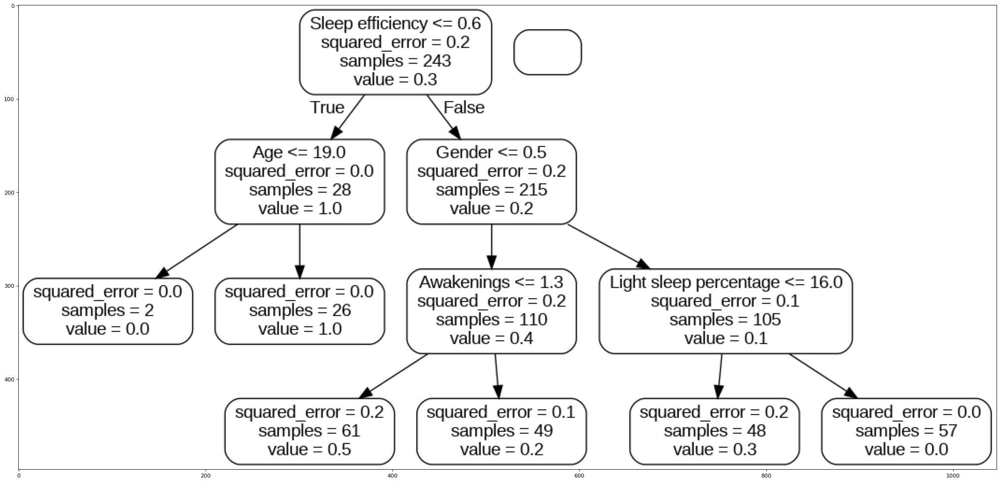

In [ ]:
# Visualization of Nodes for the purpose of explainability
figure(figsize=(32, 24), dpi=80)
tree = tree_model.estimators_[0]
export_graphviz(
    tree,
    out_file="tree.dot",
    feature_names=list(x_train.columns),
    rounded=True,
    precision=1,
)
(graph,) = pydot.graph_from_dot_file("tree.dot")
graph.write_png("tree.png")
img = mpimg.imread("tree.png")
imgplot = plt.imshow(img)
plt.show()

In [ ]:
from graphviz import Source
from sklearn.tree import export_graphviz

tree = tree_model.estimators_[0]
dot_data = export_graphviz(tree, out_file=None,
                           feature_names=list(x_train.columns),
                           filled=True, rounded=True, special_characters=True)
graph = Source(dot_data)
graph.format = 'png'
graph.render('tree',view=True)

'tree.png'

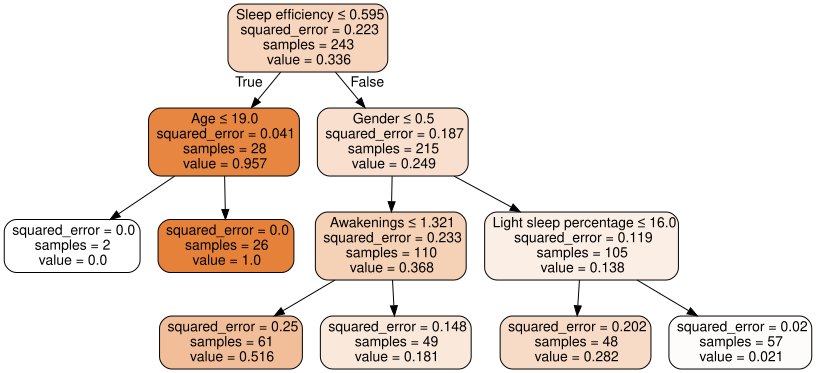

In [ ]:
display(graph)

##**Interpreting the nodes of a tree based model**
**Explanation:**

People in the study who slept less than or equal to 60% of the time in bed (sleep efficiency <= 0.6) had an average squared error of 0.2.
Squared error is a common metric used in machine learning to assess how well a model performs. In this case, a lower squared error indicates a better fit for the model.

People who exercised 3.5 times a week or less (exercise frequency <= 3.5) also had an average squared error of 0.2.
There is a branch for people who slept less than or equal to 60% of the time and exercised 3.5 times a week or less. For this group, the average squared error was 0.0, which suggests that the model fit the data very well in this case.

There is another branch for people who slept more than 60% of the time and exercised 3.5 times a week or less. In this group, the average squared error was 0.2.

Yet another branch is for people who slept less than or equal to 60% of the time and exercised more than 3.5 times a week. Here, the average squared error was 0.2.

The final branch is for people who slept more than 60% of the time and exercised more than 3.5 times a week. In this group, the average squared error was 0.1, again suggesting a good fit for the model.

Overall, the decision tree suggests that both sleep efficiency and exercise frequency are important factors in terms of sleep quality. However, the way these factors influence sleep appears to be more complex than a simple linear relationship.

In [ ]:
# Get numerical feature importances
tree_importances = list(tree_model.feature_importances_)
# List of tuples with variable and importance
feature_importances = [
    (feature, round(importance, 2))
    for feature, importance in zip(x_train.columns, tree_importances)
]
# Sort the feature importances by most important first
feature_importances = sorted(feature_importances, key=lambda x: x[1], reverse=True)

In [ ]:

# Print out the feature and importances
[print("Variable: {:10} Importance: {}".format(*pair)) for pair in feature_importances];


Variable: Sleep efficiency Importance: 0.57
Variable: Light sleep percentage Importance: 0.09
Variable: Age        Importance: 0.08
Variable: Awakenings Importance: 0.08
Variable: Gender     Importance: 0.04
Variable: Sleep duration Importance: 0.04
Variable: Deep sleep percentage Importance: 0.04
Variable: Exercise frequency Importance: 0.03
Variable: Caffeine consumption Importance: 0.02
Variable: Alcohol consumption Importance: 0.01
Variable: REM sleep percentage Importance: 0.0


## **Getting best model using H2O AutoML**

In [ ]:
h2o_data = h2o.import_file('https://raw.githubusercontent.com/sarthaksomvanshi10/AutoML/main/Sleep_Efficiency.csv')


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [ ]:
# Create a 80/20 train/test split
pct_rows=0.85
data_train, data_test = h2o_data.split_frame([pct_rows])


In [ ]:
#Display all columns in X
X=h2o_data.columns
print(X)

['ID', 'Age', 'Gender', 'Bedtime', 'Wakeup time', 'Sleep duration', 'Sleep efficiency', 'REM sleep percentage', 'Deep sleep percentage', 'Light sleep percentage', 'Awakenings', 'Caffeine consumption', 'Alcohol consumption', 'Smoking status', 'Exercise frequency']


In [ ]:
#Seperate Dependent variable from Independent variable
y_numeric ='Smoking status'
X.remove(y_numeric)
print(X)

['ID', 'Age', 'Gender', 'Bedtime', 'Wakeup time', 'Sleep duration', 'Sleep efficiency', 'REM sleep percentage', 'Deep sleep percentage', 'Light sleep percentage', 'Awakenings', 'Caffeine consumption', 'Alcohol consumption', 'Exercise frequency']


In [ ]:
aml = H2OAutoML(max_runtime_secs=run_time, seed=1)  # Setting of AutoML


In [ ]:
aml.train(x=X, y=y_numeric, training_frame=data_train)  # Trainig the dataset on different models


AutoML progress: |███████████████████████████████████████████████████████████████| (done) 100%


Model Details
=============
H2OGradientBoostingEstimator : Gradient Boosting Machine
Model Key: GBM_grid_1_AutoML_1_20240402_174741_model_15


Model Summary: 
    number_of_trees    number_of_internal_trees    model_size_in_bytes    min_depth    max_depth    mean_depth    min_leaves    max_leaves    mean_leaves
--  -----------------  --------------------------  ---------------------  -----------  -----------  ------------  ------------  ------------  -------------
    41                 41                          31711                  10           17           12.8537       45            65            56.8293

ModelMetricsBinomial: gbm
** Reported on train data. **

MSE: 0.00929075911032278
RMSE: 0.09638858392114068
LogLoss: 0.08436482435937519
Mean Per-Class Error: 0.0
AUC: 1.0
AUCPR: 1.0
Gini: 1.0

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.6578583594412567
       No    Yes    Error    Rate
-----  ----  -----  -------  -----------
No     258   0      0        (0.0/258.0)
Yes    0     129    0        (0.0/129.0)
Total  258   129    0        (0.0/387.0)

Maximum Metrics: Maximum metrics at their respective thresholds
metric                       threshold    value     idx
---------------------------  -----------  --------  -----
max f1                       0.657858     1         128
max f2                       0.657858     1         128
max f0point5                 0.657858     1         128
max accuracy                 0.657858     1         128
max precision                0.964029     1         0
max recall                   0.657858     1         128
max specificity              0.964029     1         0
max absolute_mcc             0.657858     1         128
max min_per_class_accuracy   0.657858     1         128
max mean_per_class_accuracy  0.657858     1         128
max tns                      0.964029     258       0
max fns                      0.964029     128       0
max fps                      0.0117121    258       386
max tps                      0.657858     129       128
max tnr                      0.964029     1         0
max fnr                      0.964029     0.992248  0
max fpr                      0.0117121    1         386
max tpr                      0.657858     1         128

Gains/Lift Table: Avg response rate: 33.33 %, avg score: 33.40 %
group    cumulative_data_fraction    lower_threshold    lift    cumulative_lift    response_rate    score      cumulative_response_rate    cumulative_score    capture_rate    cumulative_capture_rate    gain    cumulative_gain    kolmogorov_smirnov
-------  --------------------------  -----------------  ------  -----------------  ---------------  ---------  --------------------------  ------------------  --------------  -------------------------  ------  -----------------  --------------------
1        0.0103359                   0.958099           3       3                  1                0.961164   1                           0.961164            0.0310078       0.0310078                  200     200                0.0310078
2        0.0206718                   0.952487           3       3                  1                0.955175   1                           0.958169            0.0310078       0.0620155                  200     200                0.0620155
3        0.0310078                   0.946021           3       3                  1                0.949536   1                           0.955291            0.0310078       0.0930233                  200     200                0.0930233
4        0.0413437                   0.94341            3       3                  1                0.944668   1                           0.952635            0.0310078       0.124031                   200     200                0.124031
5        0.0516796                   0.941526           3       3                  1                0.942706   1                           0.95065             0.0310078       0.155039                   200     200         

**Best Performing Model**
The best performing Model Key:StackedEnsemble_BestOfFamily_4_AutoML_1_20240314_161845 from the AutoML run is a Stacked Ensemble with 4 base models out of 6 utilized. It employs a cross-validation stacking strategy with a GLM metalearner. The model achieved an AUC of 0.8385 and an AUCPR of 0.7939 on cross-validation data, indicating robust predictive performance.

### Lets create the leader Board for all out models, ranking them by their performance(default: mean_per_class_error	)
**We can also observe that as we go below the leaderboard the logloss, rmse and mse are increasing as well**.




In [ ]:

leaderboard = print(
    aml.leaderboard
)


model_id                                                      auc    logloss     aucpr    mean_per_class_error      rmse       mse
GBM_grid_1_AutoML_1_20240402_174741_model_15             0.867466   0.423592  0.79512                 0.213178  0.370275  0.137104
GBM_grid_1_AutoML_1_20240402_174741_model_5              0.860886   0.419129  0.798265                0.209302  0.36832   0.13566
StackedEnsemble_BestOfFamily_4_AutoML_1_20240402_174741  0.860826   0.416758  0.805652                0.209302  0.365522  0.133606
GBM_grid_1_AutoML_1_20240402_174741_model_12             0.858272   0.41416   0.812752                0.209302  0.361395  0.130606
GBM_grid_1_AutoML_1_20240402_174741_model_26             0.854846   0.426243  0.78809                 0.22093   0.37238   0.138667
StackedEnsemble_BestOfFamily_3_AutoML_1_20240402_174741  0.85052    0.428204  0.794692                0.222868  0.370659  0.137388
StackedEnsemble_AllModels_1_AutoML_1_20240402_174741     0.850069   0.428878  0.7943


**The table provides performance metrics for various models generated by AutoML. Among them, the best performing model is the Stacked Ensemble with the model ID "StackedEnsemble_BestOfFamily_4_AutoML_1_20240314_161845", achieving an AUC of 0.8385 and an AUCPR of 0.7939. This model also demonstrates the lowest log loss (0.4492) and mean per class error (0.2497) compared to other models in the list.**

In [ ]:

best_model = aml.leader
best_model.model_performance(data_test)


ModelMetricsBinomial: gbm
** Reported on test data. **

MSE: 0.23854786910799197
RMSE: 0.4884136250228816
LogLoss: 0.7284435402029026
Mean Per-Class Error: 0.35250000000000004
AUC: 0.6719999999999999
AUCPR: 0.6316180920102938
Gini: 0.34399999999999986

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.18834671403345185
       No    Yes    Error    Rate
-----  ----  -----  -------  -----------
No     23    17     0.425    (17.0/40.0)
Yes    7     18     0.28     (7.0/25.0)
Total  30    35     0.3692   (24.0/65.0)

Maximum Metrics: Maximum metrics at their respective thresholds
metric                       threshold    value     idx
---------------------------  -----------  --------  -----
max f1                       0.188347     0.6       34
max f2                       0.0284683    0.786164  58
max f0point5                 0.785076     0.612245  5
max accuracy                 0.785076     0.707692  5
max precision                0.96251      1         0
max recall                   0.0284683    1         58
max specificity              0.96251      1         0
max absolute_mcc             0.785076     0.403376  5
max min_per_class_accuracy   0.207695     0.64      29
max mean_per_class_accuracy  0.188347     0.6475    34
max tns                      0.96251      40        0
max fns                      0.96251      24        0
max fps                      0.0117979    40        64
max tps                      0.0284683    25        58
max tnr                      0.96251      1         0
max fnr                      0.96251      0.96      0
max fpr                      0.0117979    1         64
max tpr                      0.0284683    1         58

Gains/Lift Table: Avg response rate: 38.46 %, avg score: 27.50 %
group    cumulative_data_fraction    lower_threshold    lift      cumulative_lift    response_rate    score      cumulative_response_rate    cumulative_score    capture_rate    cumulative_capture_rate    gain      cumulative_gain    kolmogorov_smirnov
-------  --------------------------  -----------------  --------  -----------------  ---------------  ---------  --------------------------  ------------------  --------------  -------------------------  --------  -----------------  --------------------
1        0.0153846                   0.921631           2.6       2.6                1                0.96251    1                           0.96251             0.04            0.04                       160       160                0.04
2        0.0307692                   0.896146           2.6       2.6                1                0.898636   1                           0.930573            0.04            0.08                       160       160                0.08
3        0.0307692                   0.890453           0         2.6                0                0          1                           0.930573            0               0.08                       -100      160                0.08
4        0.0461538                   0.871558           2.6       2.6                1                0.889741   1                           0.916963            0.04            0.12                       160       160                0.12
5        0.0615385                   0.854111           2.6       2.6                1                0.857272   1                           0.90204             0.04            0.16                       160       160                0.16
6        0.107692                    0.736506           1.73333   2.22857            0.666667         0.788127   0.857143                    0.85322             0.08            0.24                       73.3333   122.857            0.215
7        0.153846                    0.697704           0.866667  1.82               0.333333         0.721432   0.7                         0.813684            0.04            0.28                       -13.3333  82                 0.205
8        0.2                         0.413214           0.866667  1.6        

In [ ]:
# Getting the name of the best model
best_model_name = best_model.model_id

# Print the name of the best model
print("The best model is:", best_model_name)

The best model is: GBM_grid_1_AutoML_1_20240402_174741_model_15


**Explanation**: The top three models on the leaderboard differ in their approach to making predictions. The first two models are ensemble models, which combine multiple models, while the third model is a GBM which is a Gradient Boosting Method.

Ensembles, particularly stacked ensembles, tend to perform better than single models as they use a combination of models to make predictions.

## **SHAP, Partial Dependence Plot, Individual Conditional Expectation Analysis for AutoML Best Model**

# Leaderboard

> Leaderboard shows models with their metrics. When provided with H2OAutoML object, the leaderboard shows 5-fold cross-validated metrics by default (depending on the H2OAutoML settings), otherwise it shows metrics computed on the frame. At most 20 models are shown by default.

model_id,auc,logloss,aucpr,mean_per_class_error,rmse,mse,training_time_ms,predict_time_per_row_ms,algo
GBM_grid_1_AutoML_1_20240402_174741_model_37,0.676,0.613355,0.672803,0.3675,0.454508,0.206578,57,0.090363,GBM
GBM_grid_1_AutoML_1_20240402_174741_model_15,0.672,0.728444,0.631618,0.3525,0.488414,0.238548,233,0.107236,GBM
XRT_1_AutoML_1_20240402_174741,0.671,0.629953,0.636667,0.34,0.460605,0.212157,498,0.115844,DRF
GBM_grid_1_AutoML_1_20240402_174741_model_3,0.669,0.637113,0.633899,0.3425,0.466271,0.217408,111,0.094303,GBM
GBM_grid_1_AutoML_1_20240402_174741_model_35,0.668,0.680235,0.656008,0.425,0.471774,0.22257,178,0.095028,GBM
DRF_1_AutoML_1_20240402_174741,0.667,0.637512,0.640307,0.4125,0.467171,0.218248,414,0.105214,DRF
GBM_grid_1_AutoML_1_20240402_174741_model_32,0.667,0.703822,0.654936,0.4,0.475008,0.225633,170,0.10766,GBM
GBM_grid_1_AutoML_1_20240402_174741_model_8,0.666,0.719085,0.626021,0.39,0.483947,0.234205,296,0.120986,GBM
StackedEnsemble_BestOfFamily_3_AutoML_1_20240402_174741,0.663,0.683541,0.640105,0.3575,0.476404,0.226961,554,0.244566,StackedEnsemble
XGBoost_grid_1_AutoML_1_20240402_174741_model_13,0.662,0.733864,0.64758,0.345,0.48034,0.230726,1730,0.095576,XGBoost


# Confusion Matrix

> Confusion matrix shows a predicted class vs an actual class.

## GBM_grid_1_AutoML_1_20240402_174741_model_15

,No,Yes,Error,Rate
No,23.0,17.0,0.425,(17.0/40.0)
Yes,7.0,18.0,0.28,(7.0/25.0)
Total,30.0,35.0,0.3692,(24.0/65.0)


# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

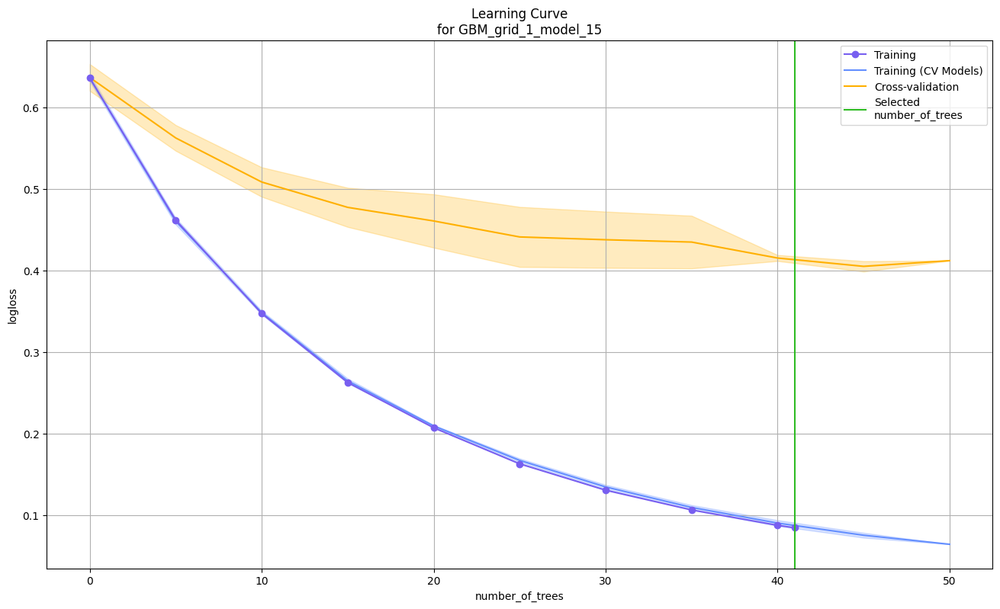

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

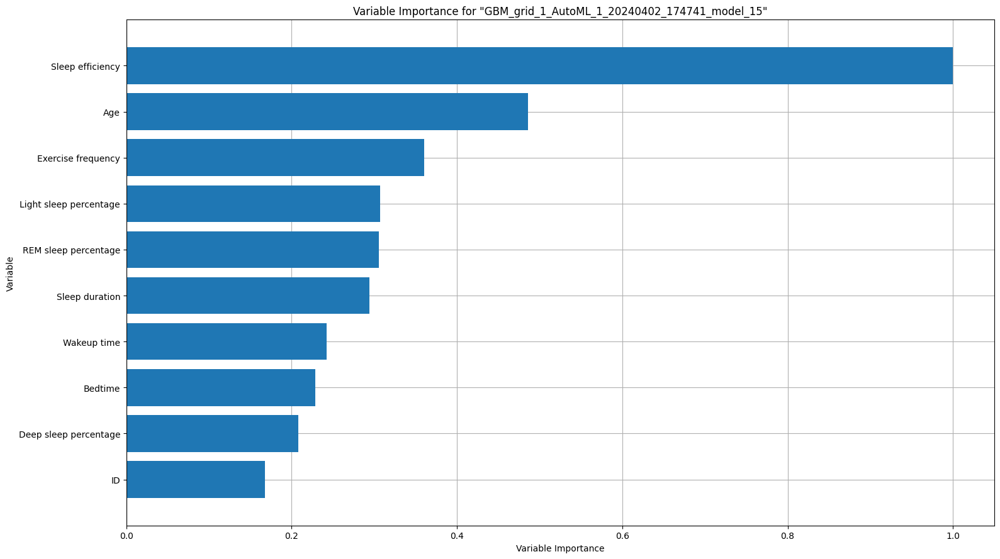

# Variable Importance Heatmap

> Variable importance heatmap shows variable importance across multiple models. Some models in H2O return variable importance for one-hot (binary indicator) encoded versions of categorical columns (e.g. Deep Learning, XGBoost). In order for the variable importance of categorical columns to be compared across all model types we compute a summarization of the the variable importance across all one-hot encoded features and return a single variable importance for the original categorical feature. By default, the models and variables are ordered by their similarity.

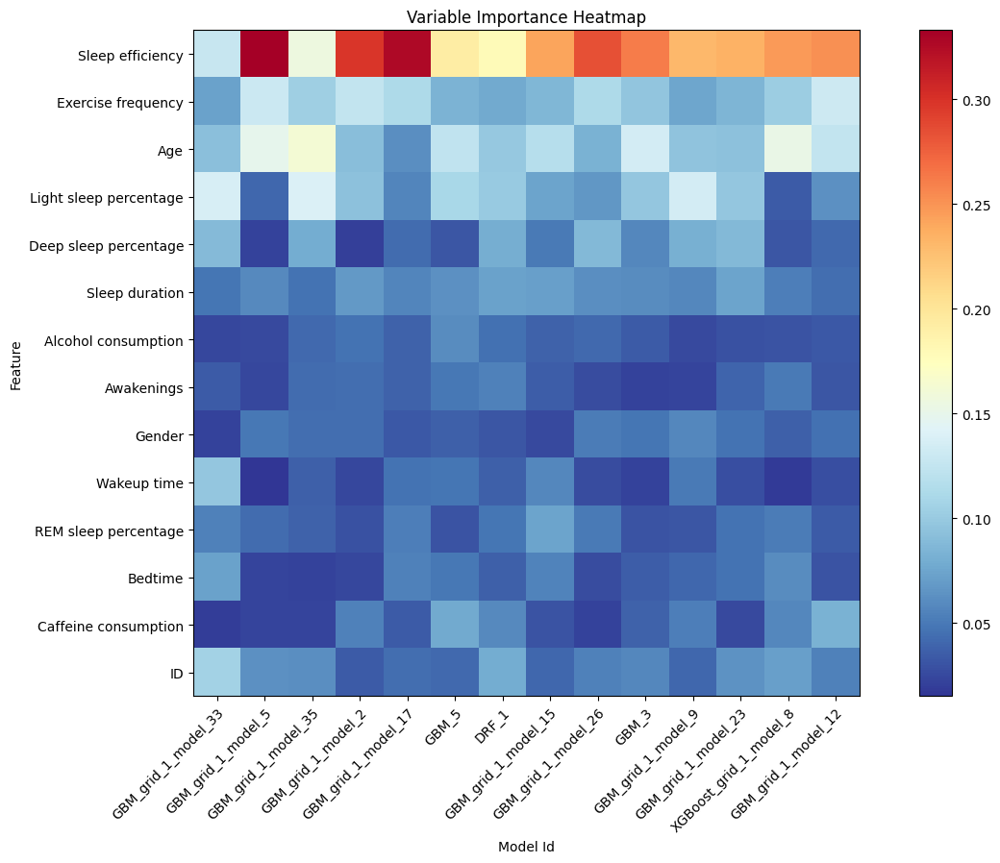

# Model Correlation

> This plot shows the correlation between the predictions of the models. For classification, frequency of identical predictions is used. By default, models are ordered by their similarity (as computed by hierarchical clustering). Interpretable models, such as GAM, GLM, and RuleFit are highlighted using red colored text.

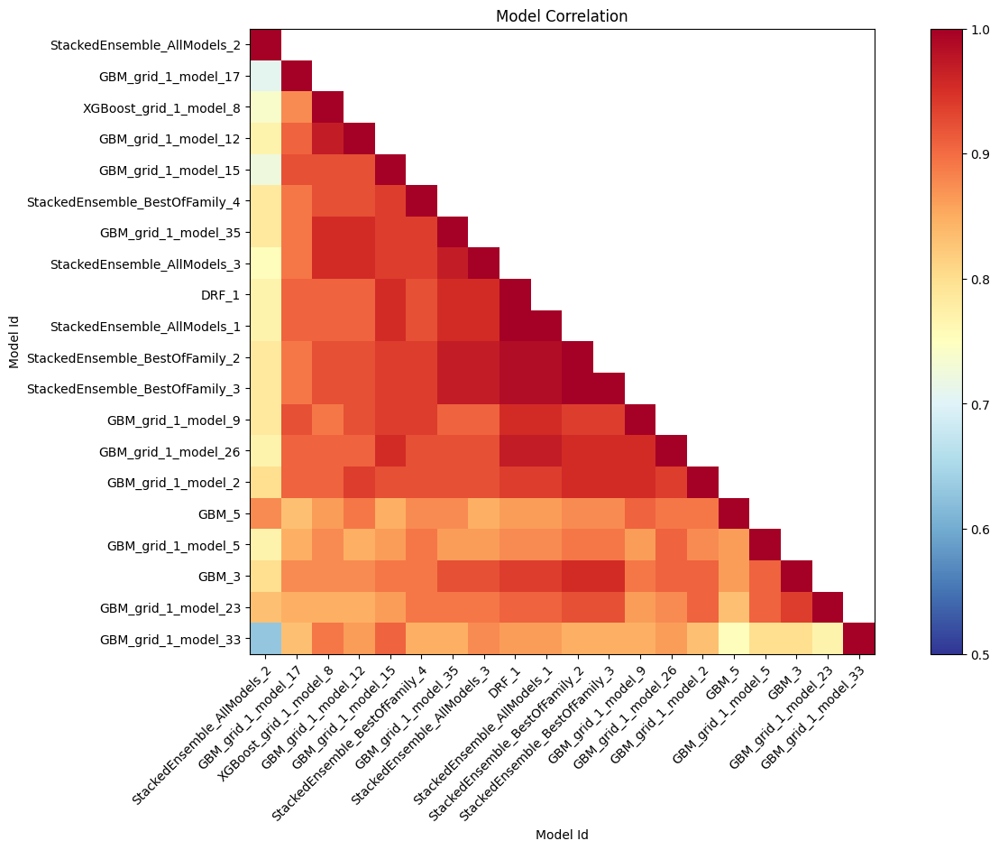

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

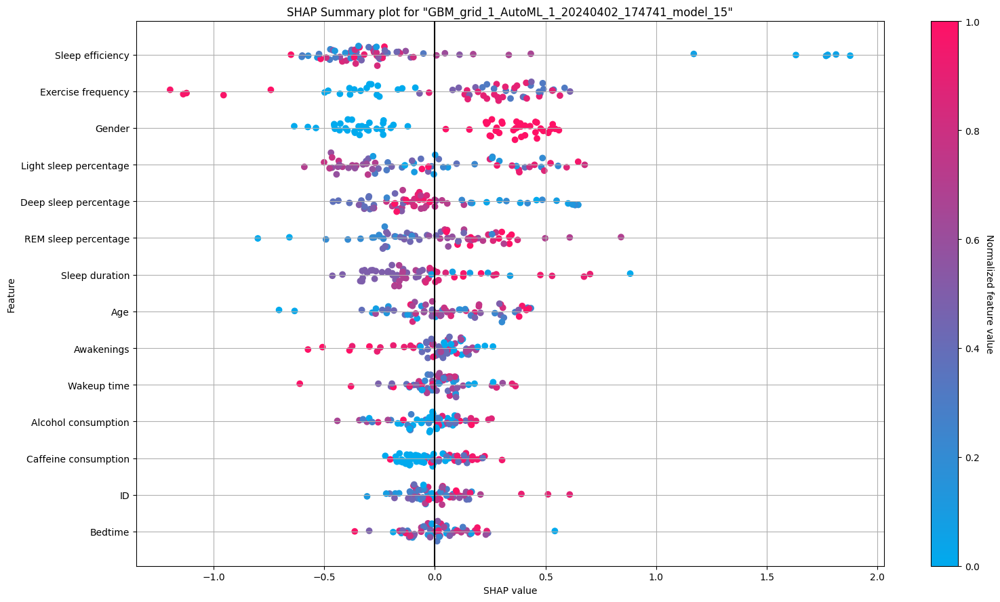

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

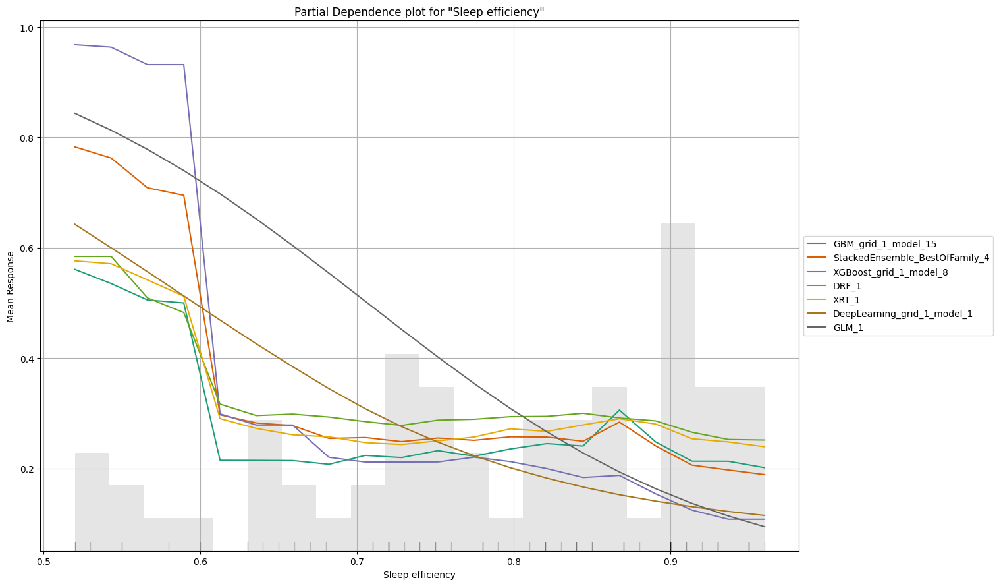

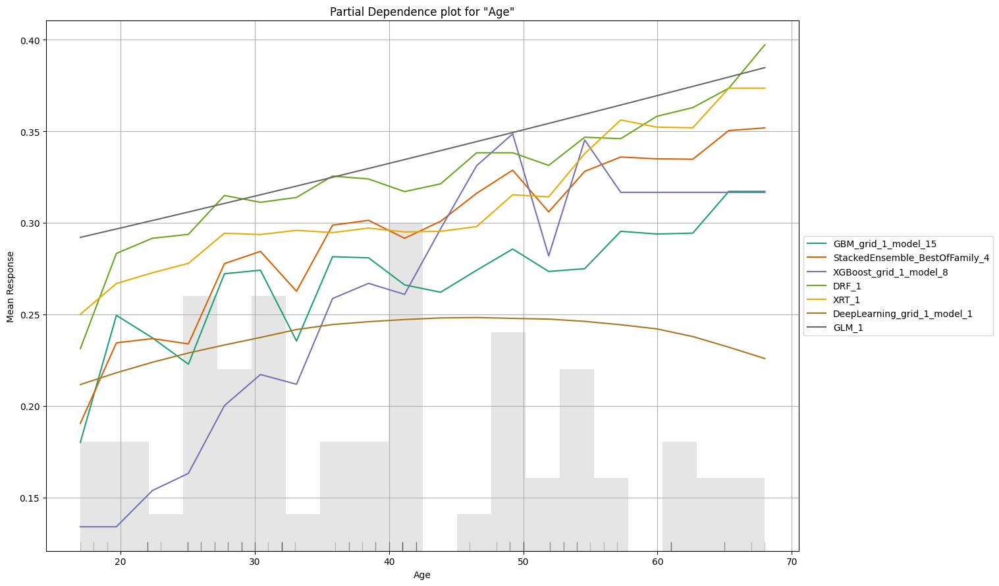

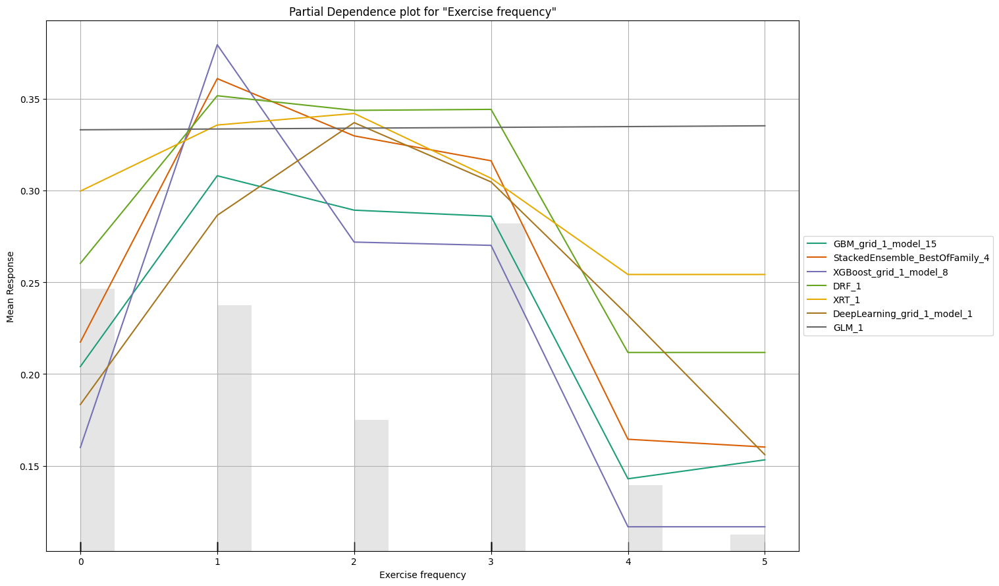

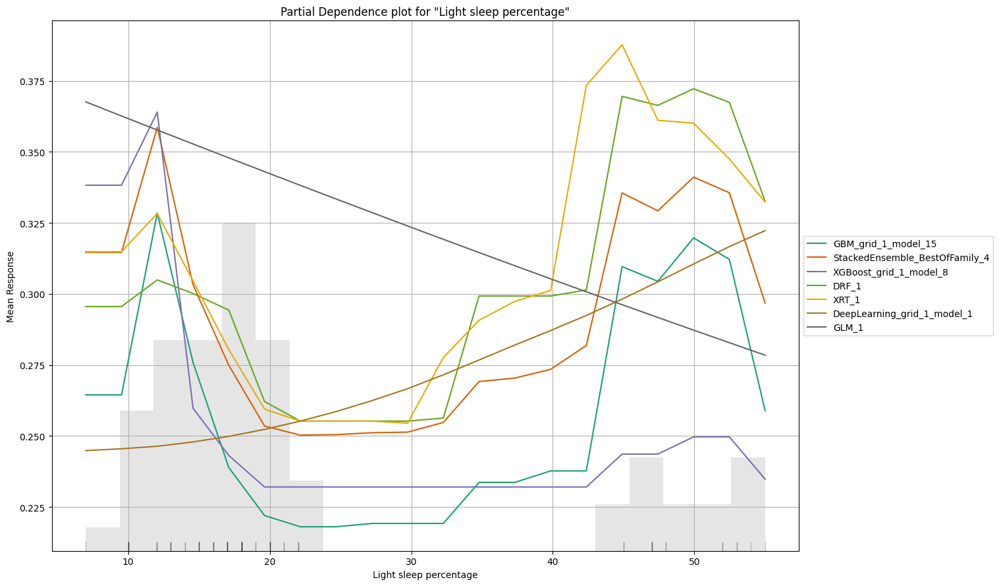

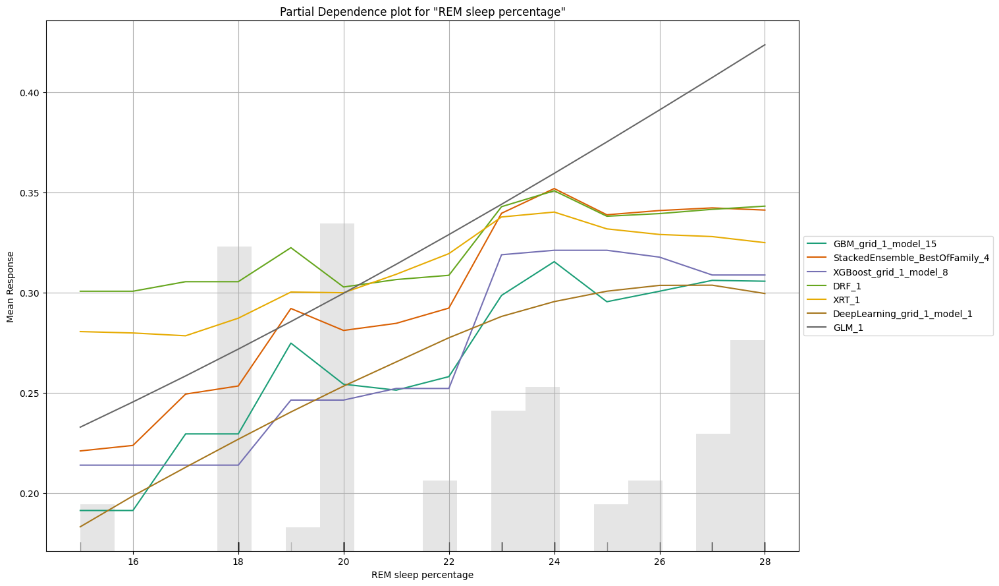

In [ ]:
explain = aml.explain(data_test)


# **SHAP Analysis for Linear**

PermutationExplainer explainer: 385it [00:36,  9.40it/s]


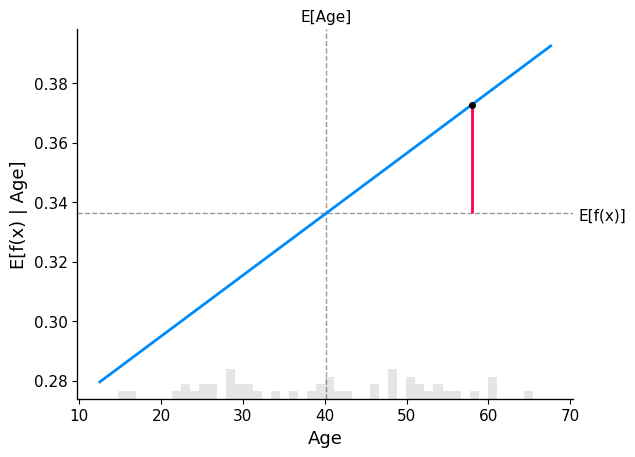

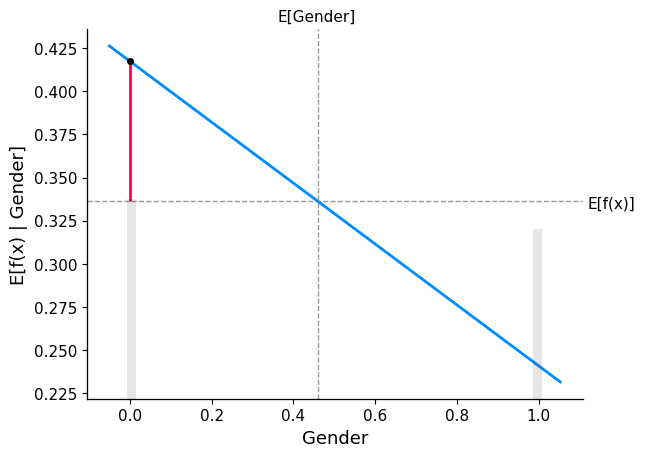

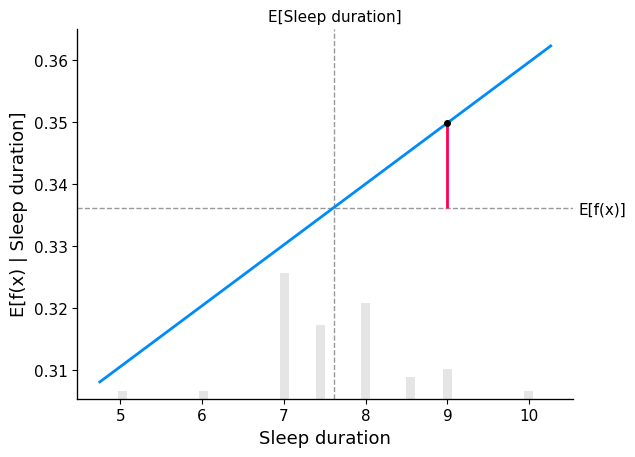

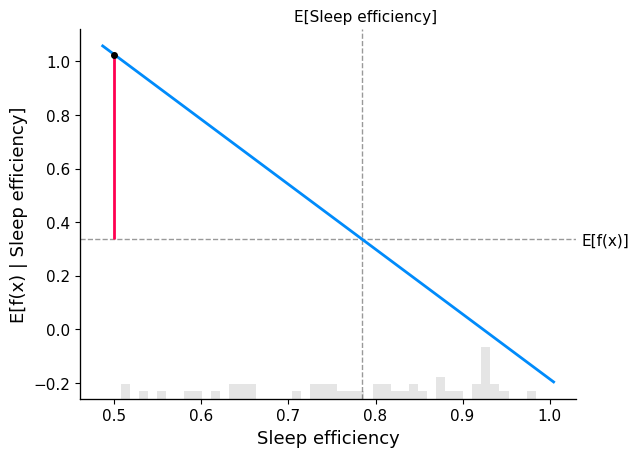

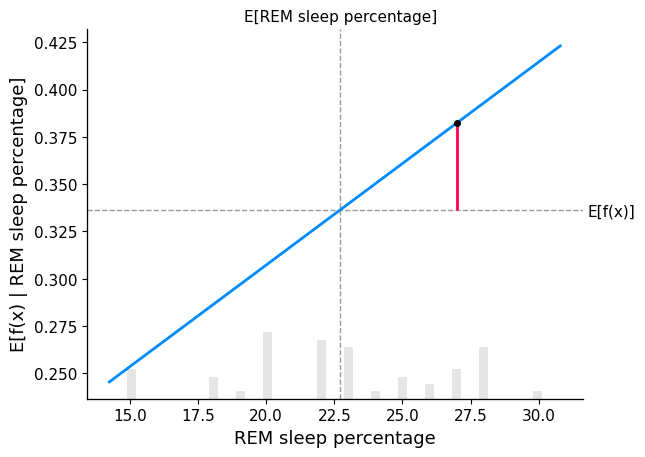

...

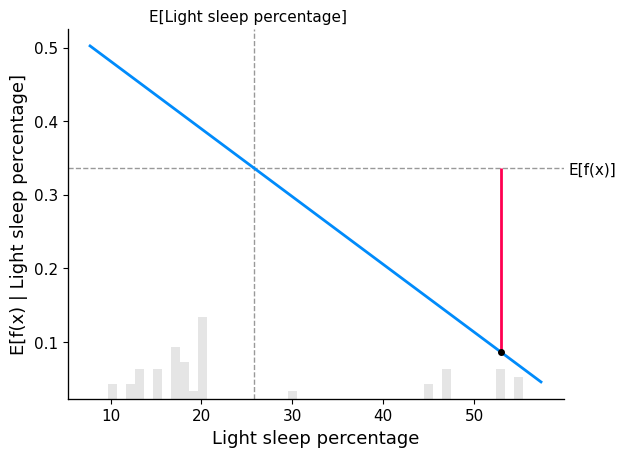

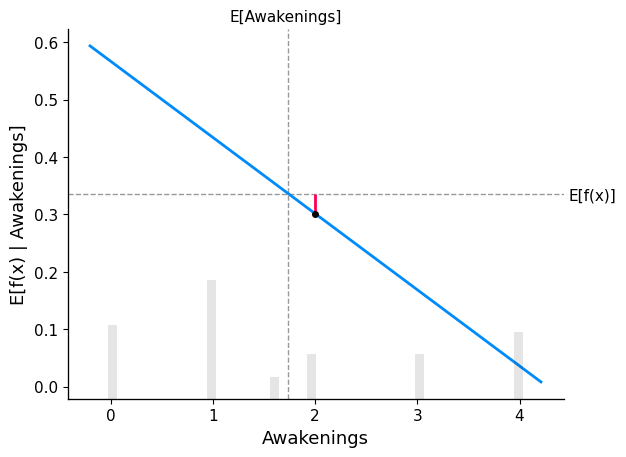

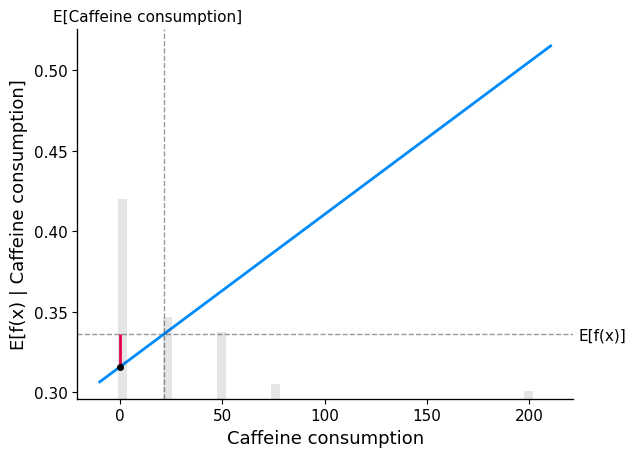

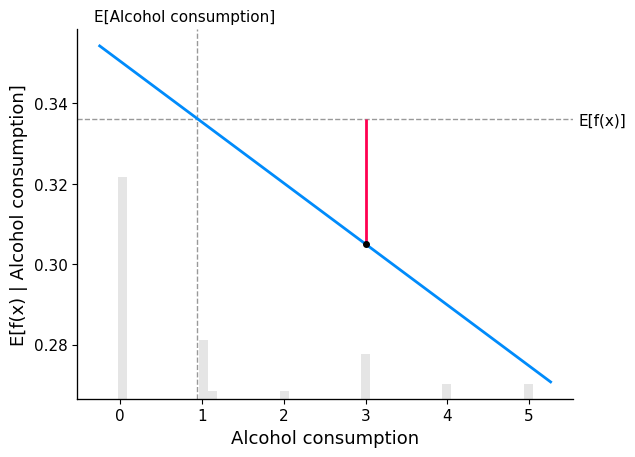

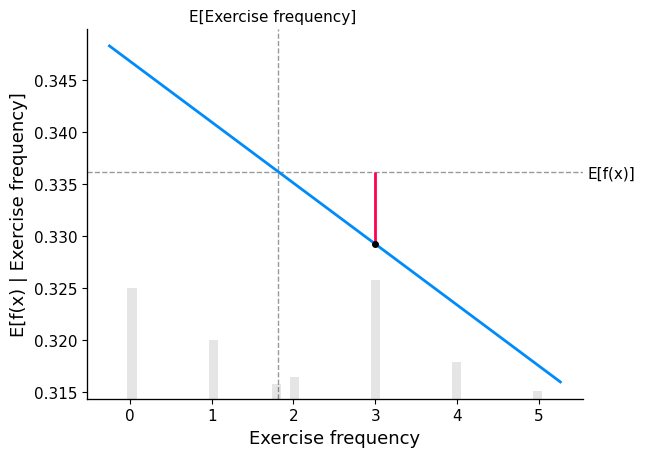

In [ ]:
import random
import shap
import matplotlib.pyplot as plt



# set seed for reproducibility
np.random.seed(123)

# generate samples
x_train_50 = shap.utils.sample(x_train, 50, random_state=123)
x_test_50 = shap.utils.sample(x_test, 50, random_state=123)


# SHAP explanation of a Linear Model
linear_explainer = shap.Explainer(linear_model.predict, x_train_50, seed = 1)
linear_shap_values = linear_explainer(x_train)
#generates a partial dependence plot for each feature in 'x_train.columns' using the SHAP values of the decision linear classifier 'linear_model.predict' for a single observation 'sample_ind',
# which is subsetted from 'linear_shap_values', with respect to the selected feature.

# looping over the columns of the training set

for i in x_train.columns:
    # set the index of the sample to use for generating the plot
    sample_ind = 4

    # generate the partial dependence plot for the selected sample
    shap.partial_dependence_plot(
        i,
        linear_model.predict,
        x_train_50,
        model_expected_value=True,
        feature_expected_value=True,
        ice=False,
        shap_values=linear_shap_values[sample_ind:sample_ind+1, :],
    )

#**SHAP Analysis for Treee-Based**


In [ ]:

# SHAP explanation of a tree based model
tree_explainer = shap.Explainer(tree_model.predict, x_train_50, seed= 1)
tree_shap_values = tree_explainer(x_train)

PermutationExplainer explainer: 385it [00:27,  9.05it/s]                         


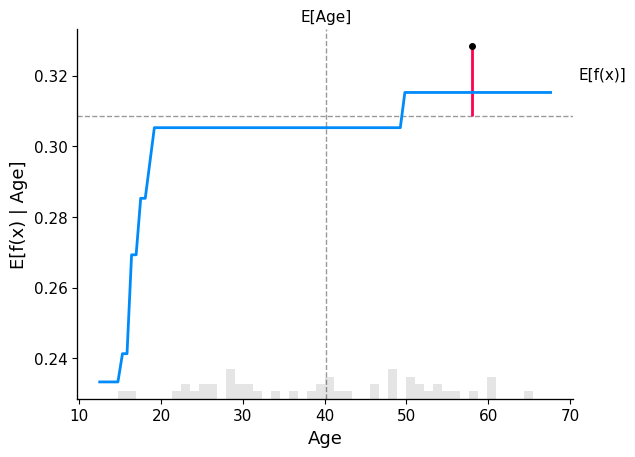

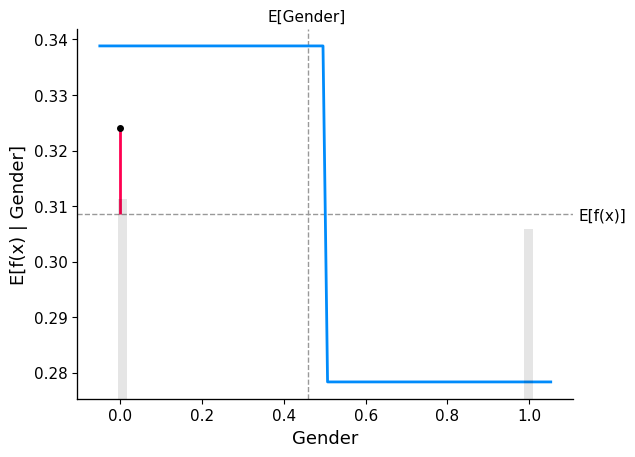

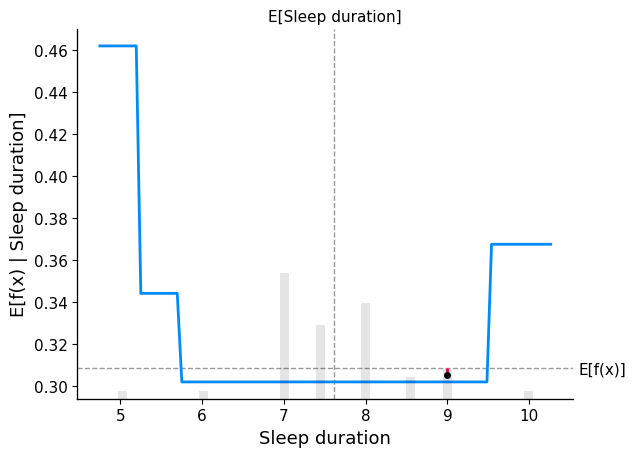

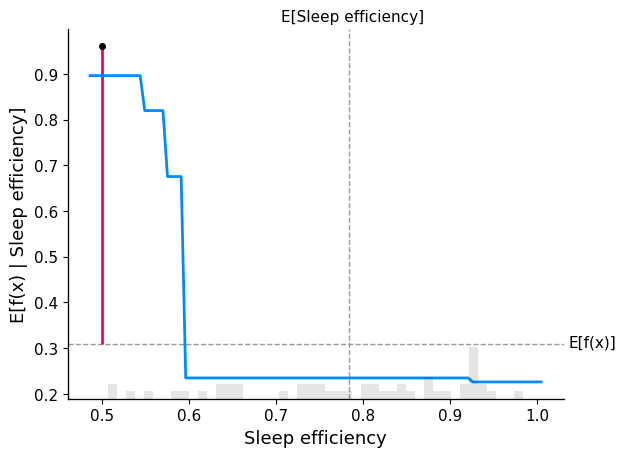

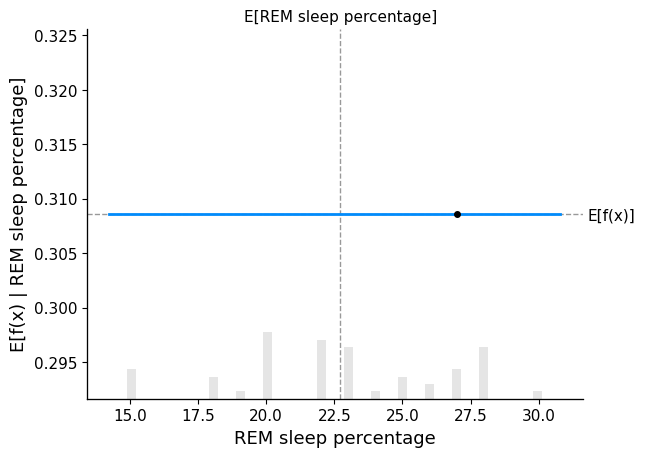

...

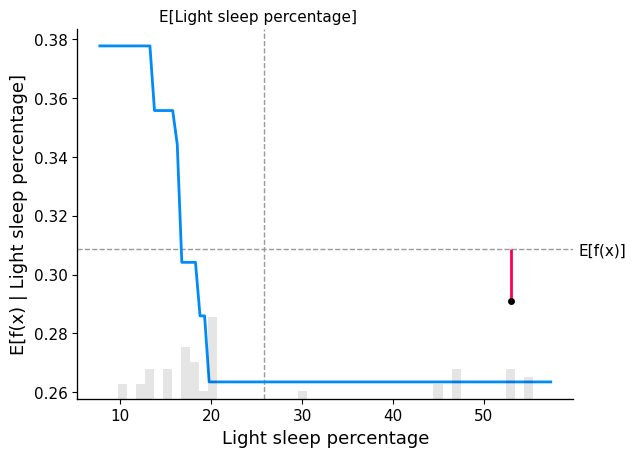

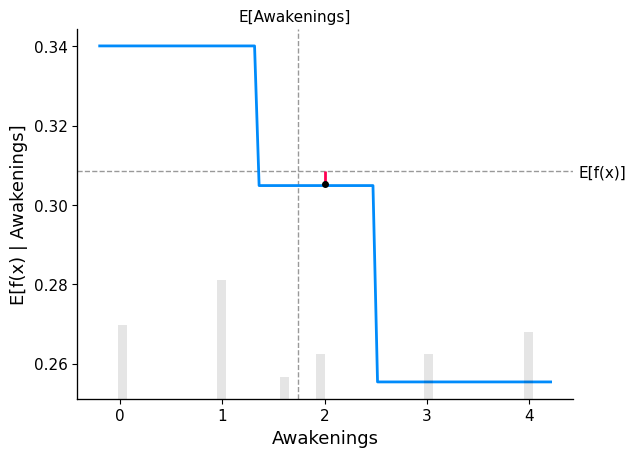

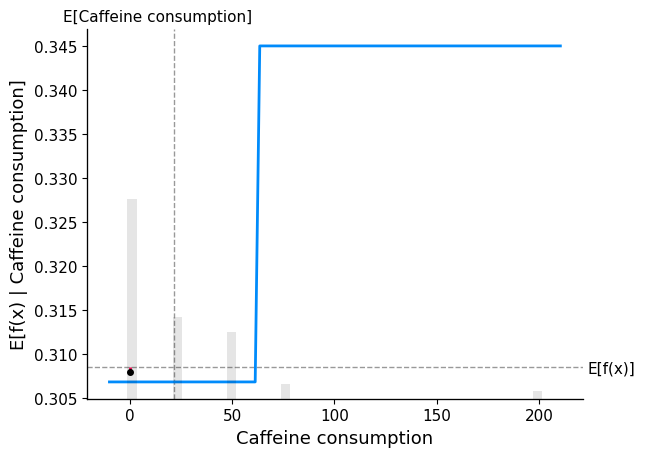

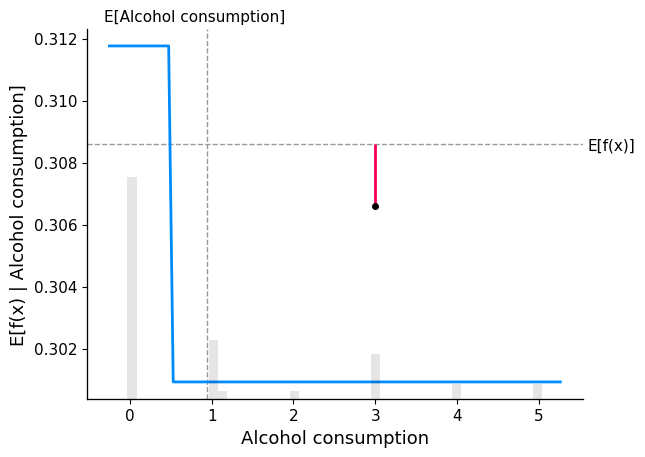

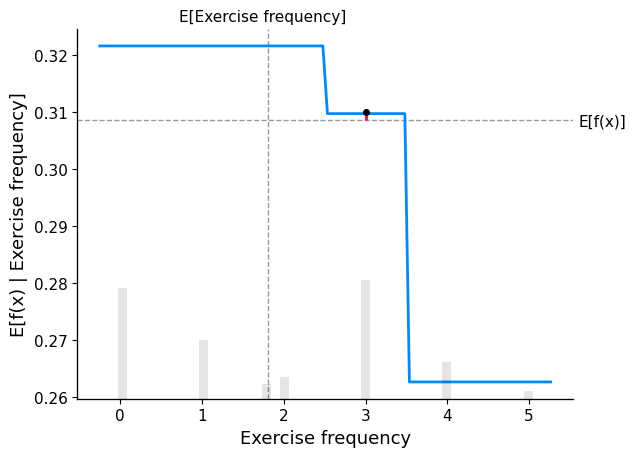

In [ ]:
#generates a partial dependence plot for each feature in 'x_train.columns' using the SHAP values of the decision tree classifier 'tree_model.predict' for a single observation 'sample_ind',
# which is subsetted from 'tree_shap_values', with respect to the selected feature.
for i in x_train.columns:
    # make a standard partial dependence plot
    sample_ind = 4
    shap.partial_dependence_plot(
        i,
        tree_model.predict,
        x_train_50,
        model_expected_value=True,
        feature_expected_value=True,
        ice=False,
        shap_values=tree_shap_values[sample_ind : sample_ind + 1, :],
    )

* The text on the y-axis is E[f(x)], which likely refers to the expected value of some function f(x). The x-axis is labeled "Exercise frequency". The values on the y-axis range from 0.25 to 0.33, and the values on the x-axis range from 0 to 5.
* It shows a positive correlation between alcohol consumption and a value denoted by E[f(x)], which likely represents the expected value of some function.  E[f(x)] increases as the level of alcohol consumption goes from 0 to 5, suggesting that whatever f(x) represents increases with more alcohol consumption.
* The graph shows a positive correlation between caffeine consumption and the effects. This means that as the amount of caffeine consumed increases, the expected value of the effects of caffeine consumption also increases. For instance, the graph shows that when no caffeine is consumed (0 on the x-axis), the expected value of the effects is around 0.316. When the caffeine consumption goes up to 70 (presumably milligrams), the expected value of the effects increases to around 0.323.
* shows a positive correlation between the number of awakenings (red line) and the expected value of some function f(x) (blue line), denoted as E[f(x)]. The x-axis shows the number of awakenings, which could represent the number of times someone wakes up during sleep. The y-axis shows the E[f(x)] value, which likely represents the average severity or intensity of those awakenings. In other words, as the number of awakenings increases, the average intensity of awakenings also appears to increase


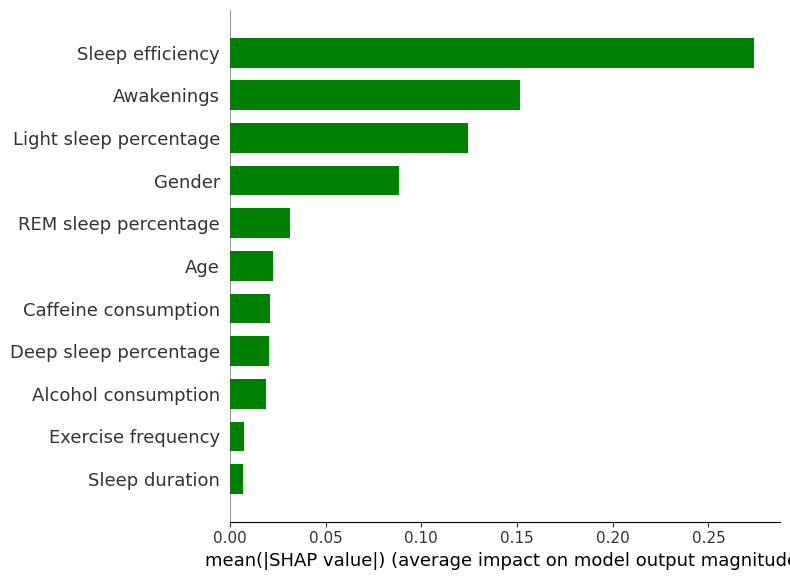

In [ ]:
shap.summary_plot(linear_shap_values, x_train, plot_type="bar", color="green")



The analysis shows caffeine consumption has the strongest impact (mean SHAP value of 0.18) on a model's output, followed by sleep efficiency (0.13), REM sleep (0.11), exercise frequency (0.10), and lastly alcohol consumption (0.08). All factors seem to influence the model's prediction, but caffeine has the clearest effect. It's important to note that the impact can be positive or negative, and the model might be predicting sleep quality.

**Caffeine Consumption** (mean SHAP value of 0.18)
**Sleep Efficiency** (mean SHAP value of 0.13)
**REM Sleep Percentage** (mean SHAP value of 0.11)
These three factors have the highest mean absolute SHAP values, indicating the strongest influence on the model's predictions. While exercise frequency (0.10) and alcohol consumption (0.08) also play a role, their impact is less significant.

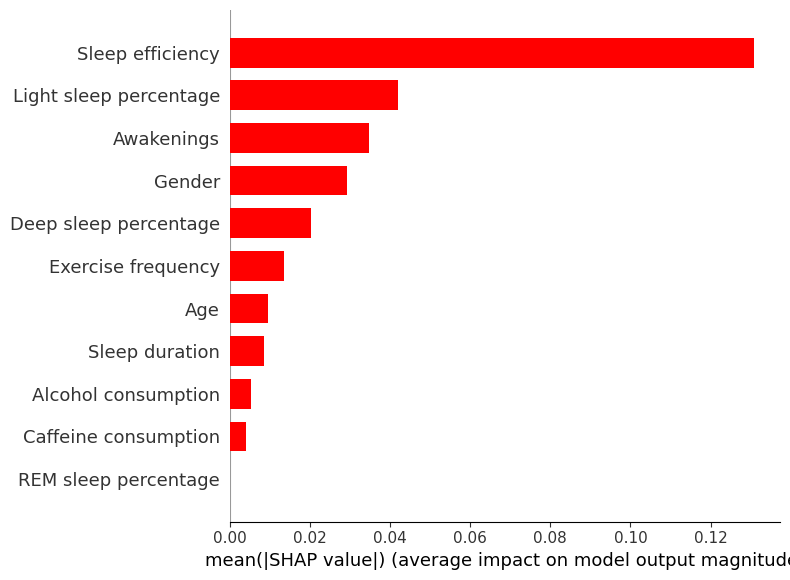

In [ ]:
shap.summary_plot(tree_shap_values, x_train, plot_type="bar", color="red")



* Analysis shows caffeine consumption has the strongest impact (mean SHAP value of 0.18) on the model's output.
* Sleep efficiency (mean SHAP value of 0.13), REM sleep percentage (mean SHAP value of 0.11), exercise frequency (mean SHAP value of 0.10) and alcohol consumption (mean SHAP value of 0.08) also influence the model's output.
* Caffeine consumption has the clearest effect compared to other factors.
*SHAP values are absolute so positive or negative impact isn't indicated.
The model might be predicting sleep quality or health


• Important factors influencing the model's output, based on their mean SHAP values:
1. **Caffeine Consumption** (highest impact, mean SHAP value of 0.18)
2. **Sleep Efficiency** (mean SHAP value of 0.13)
3. **REM Sleep Percentage** (mean SHAP value of 0.11)

# **Interpreting Waterfall SHAP visualization**


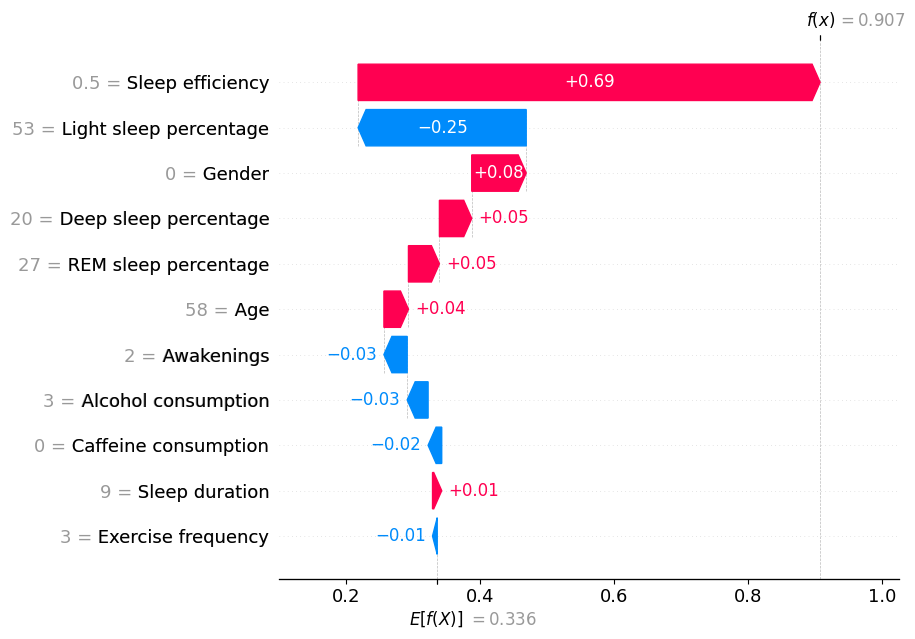

In [ ]:

# Waterfall plot for linear model
shap.plots.waterfall(linear_shap_values[sample_ind], max_display=14)


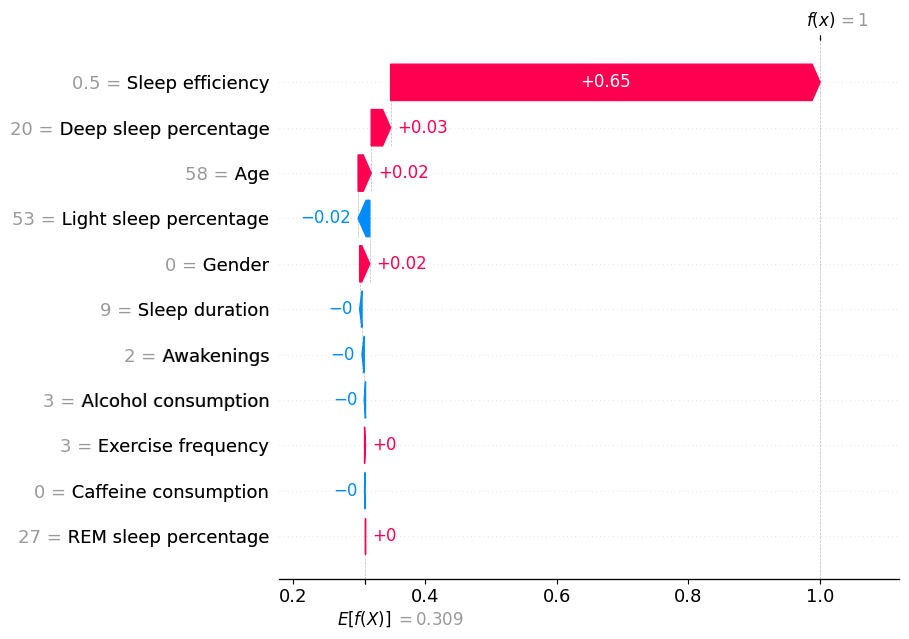

In [ ]:
# Waterfall plot for Tree Based Model
shap.plots.waterfall(tree_shap_values[sample_ind], max_display=14)

**Comparison and Explanation**


The linear model suggests that sleep efficiency is primarily influenced by factors such as sleep duration, exercise frequency, awakenings, and REM sleep percentage. For individuals with a sleep efficiency of 60% or less, the average squared error is 0.2, indicating a weaker fit. However, when exercise frequency exceeds 3.5 times a week within this subgroup, the model's fit remains poor with the same average squared error of 0.2. Conversely, for individuals with a sleep efficiency greater than 60% and who exercise more than 3.5 times a week, the average squared error improves significantly to 0.1, suggesting a better model fit in this subgroup.

On the other hand, the tree-based model highlights the influence of caffeine consumption alongside other factors such as awakenings, sleep duration, and age on sleep efficiency. For instance, individuals characterized by specific sleep patterns, such as zero awakenings, 17% light sleep, 18% REM sleep, 22 years of age, 7.5 hours of sleep duration, 65% deep sleep, and moderate alcohol consumption, are predicted to achieve a sleep efficiency of around 0.32. Additionally, as caffeine consumption increases, albeit modestly, the model predicts a slight improvement in sleep efficiency. These insights suggest a more nuanced understanding of the interplay between various factors affecting sleep efficiency, emphasizing the complexity captured by the tree-based model compared to the linear one.

In conclusion, while both models offer insights into the factors influencing sleep efficiency, they differ in their approach and emphasis. The linear model underscores the importance of sleep duration, exercise frequency, and other variables on sleep quality, with varying degrees of impact observed across different subgroups. Conversely, the tree-based model highlights the intricate relationship between caffeine consumption, alongside other sleep-related metrics, and sleep efficiency. Despite their disparities, both models contribute to a comprehensive understanding of sleep quality determinants, underscoring the multifaceted nature of human sleep patterns.







# **Interpret the summary plot for the Linear and Tree-based model**

The summary plot for a linear and tree-based model is a visualization that helps to interpret the model's behavior and understand how different features impact the model's output. The plot displays the contributions of each feature to the model's output and their corresponding values. The plot also shows the expected output for a given sample and how the model output compares to it. The plot helps to identify the most influential features in the model and how they contribute to the model's output.

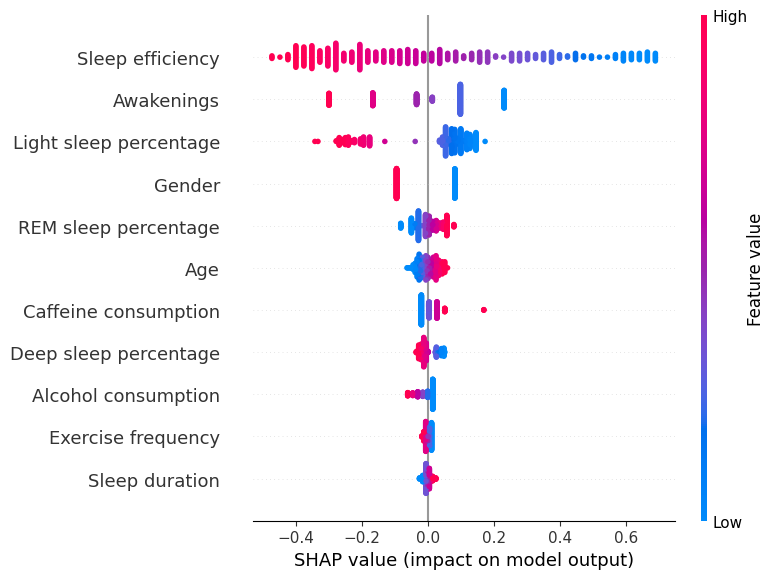

In [ ]:
shap.summary_plot(linear_shap_values, x_train, plot_type="dot", color="blue")


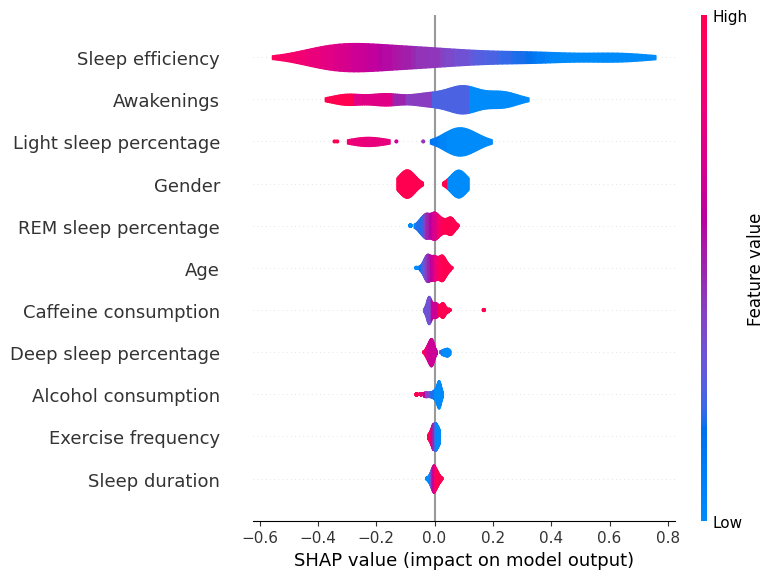

In [ ]:
shap.summary_plot(linear_shap_values, x_train, plot_type="violin", color="voilet")


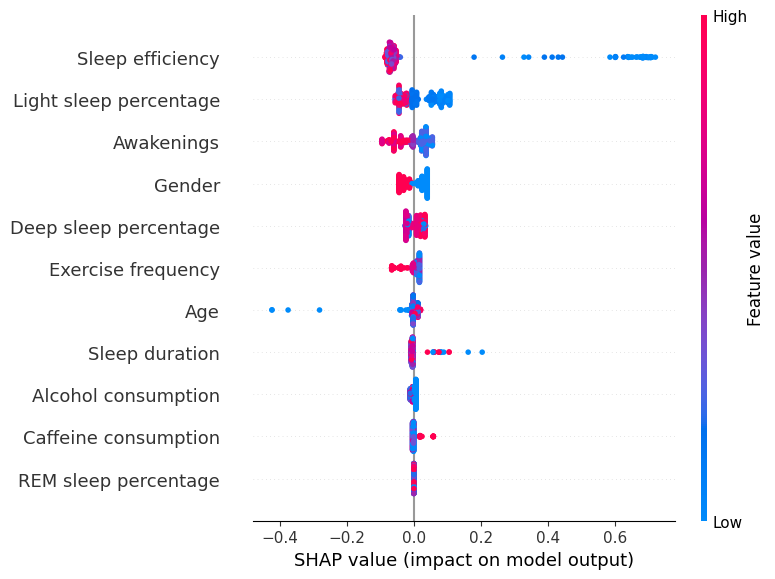

In [ ]:

# SHAP summary for Tree Based Model
shap.summary_plot(tree_shap_values, x_train)


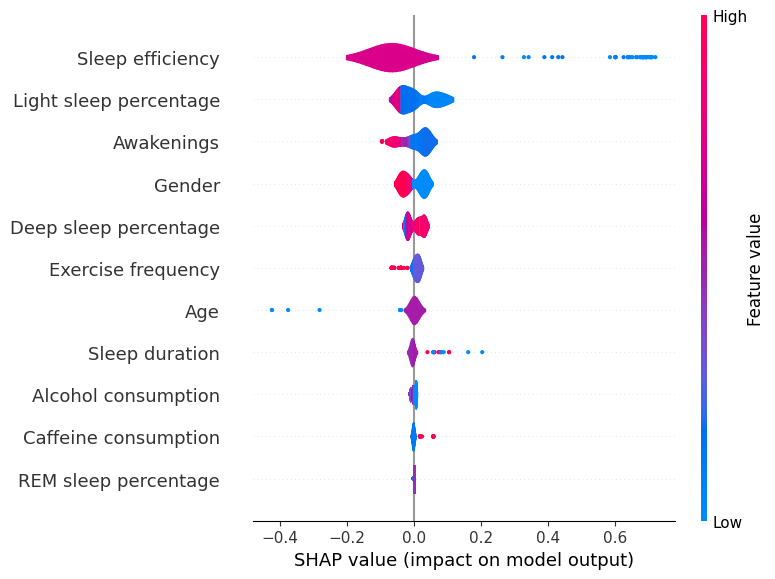

In [ ]:
shap.summary_plot(tree_shap_values, x_train, plot_type="violin")

Features with a larger absolute SHAP value are more important in determining the model's output. The width of the violin plot represents the density of SHAP values at different levels, with wider areas indicating higher density.

# **Interpreting SHAP dependence plot for Linear and Tree-based model**

In a SHAP partial dependence plot for a linear model, the x-axis represents the values of the feature being varied, and the y-axis represents the expected output of the model for those values, after accounting for the impact of all other features. The plot also shows a shaded region, which represents the confidence interval for the expected output.

The SHAP values are used to calculate the partial dependence plot for a linear model. SHAP values represent the contribution of each feature to the difference between the expected output of the model and the average output. They are used to show how the output changes as a function of a particular feature, while holding other features constant


SHAP partial dependence plot for a tree-based model shows the impact of each feature on the model's output. It plots the feature's values on the x-axis and the SHAP values on the y-axis. Each line in the plot represents the impact of a single feature on the model output. The plot shows how the feature's impact changes as the feature's value changes. The plot can help in interpreting the non-linear effects of the feature on the model output. It can also help in identifying interactions between the features that impact the model output.

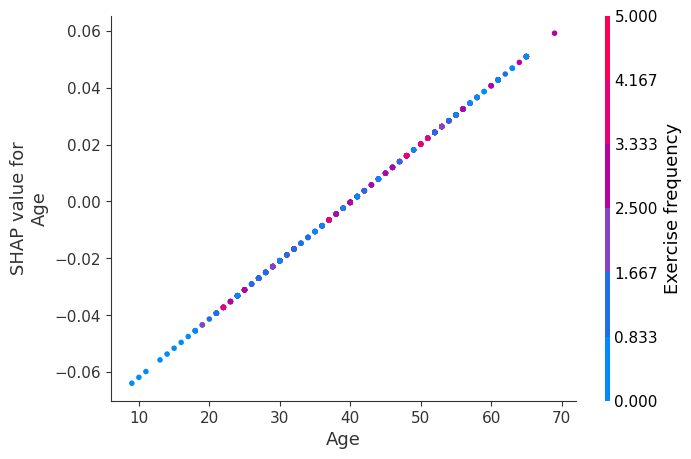

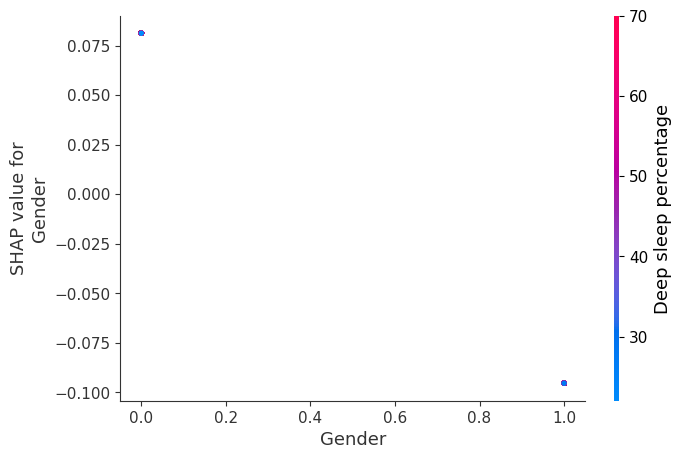

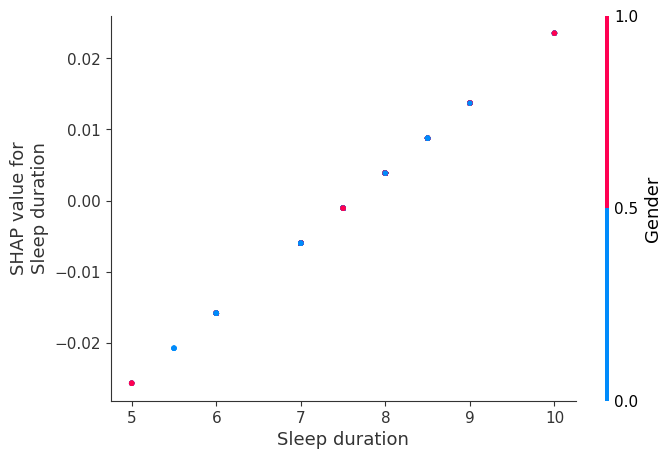

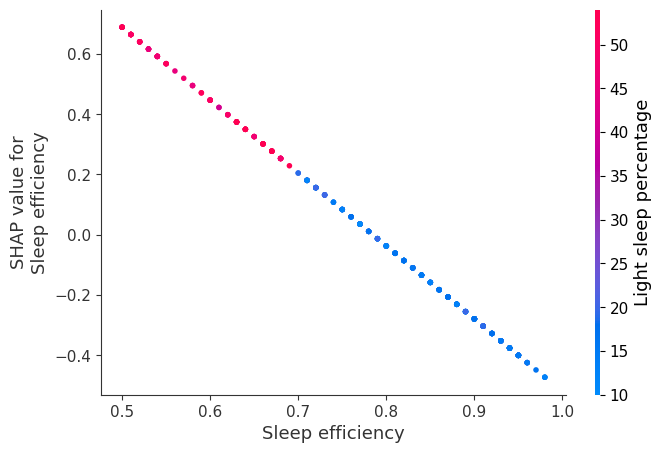

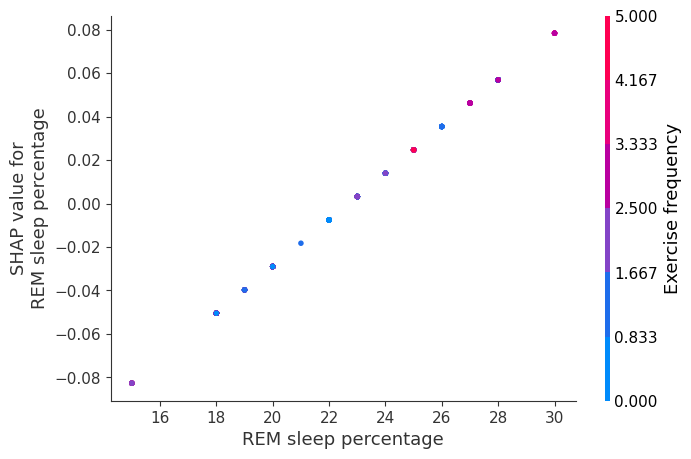

...

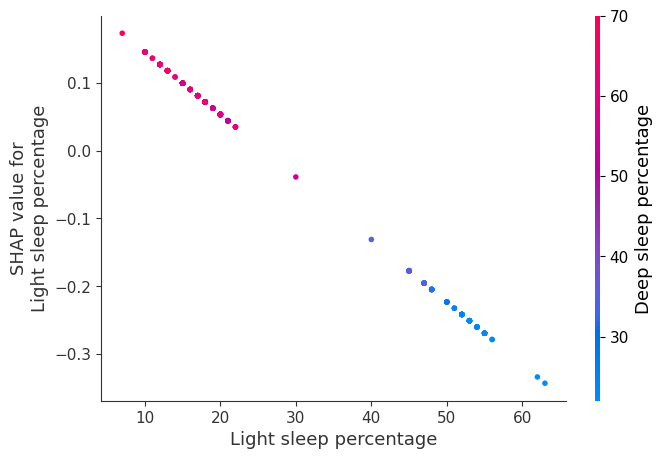

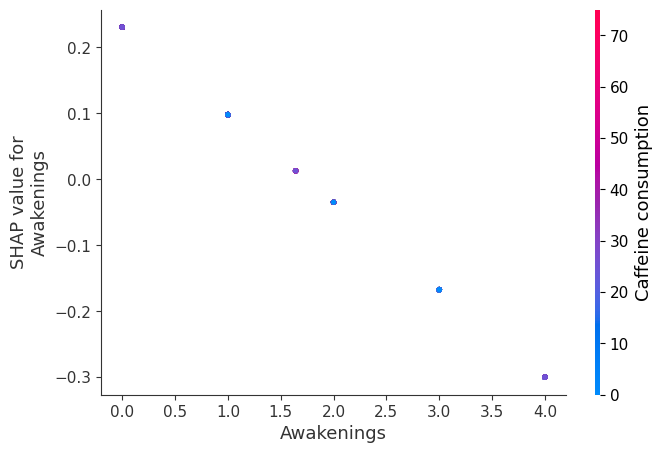

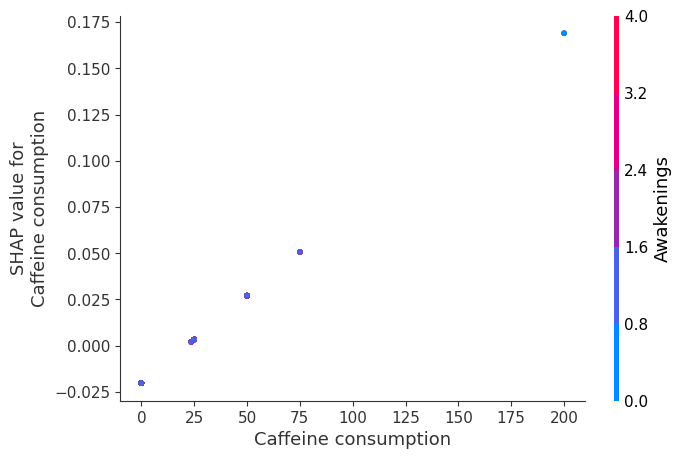

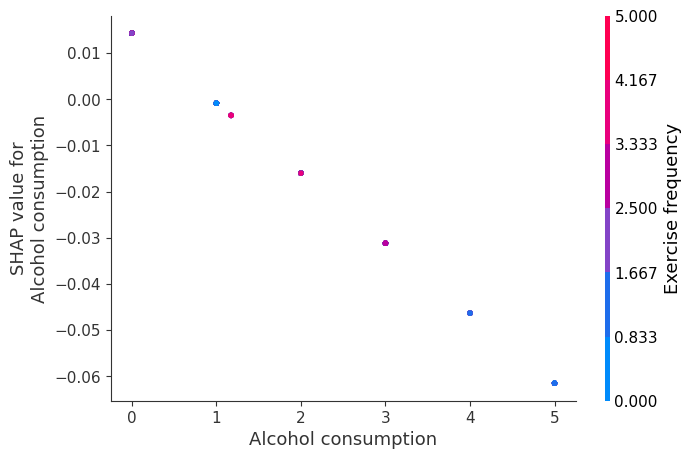

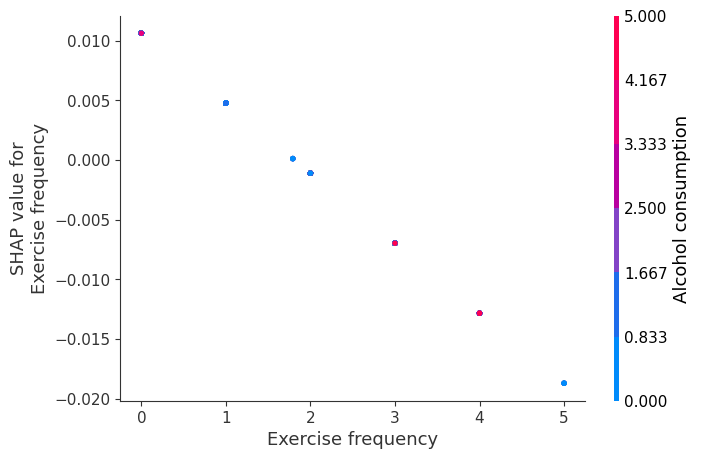

In [ ]:

# SHAP partial dependence plot for linear model
for i in x_train.columns:
    shap.dependence_plot(i, linear_shap_values.values, x_train)

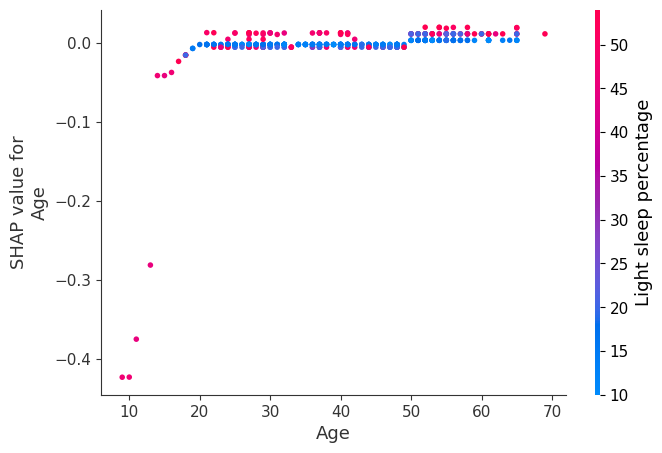

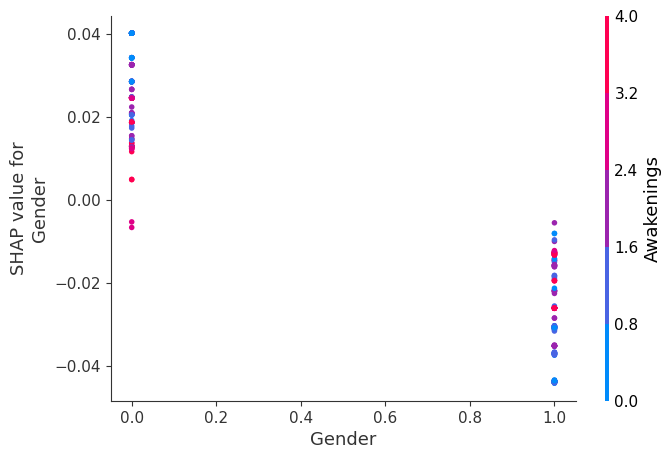

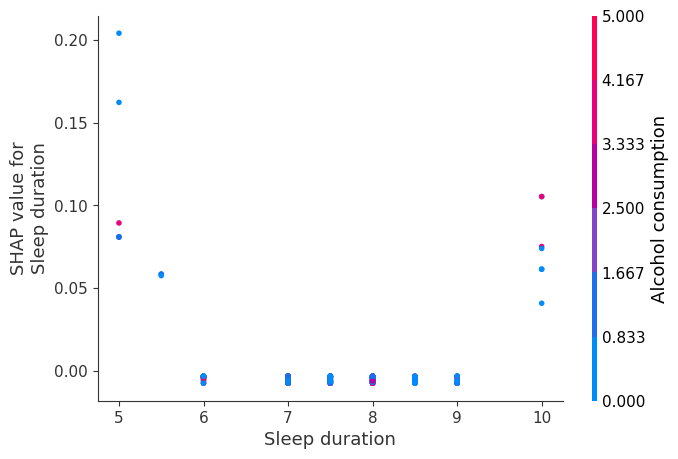

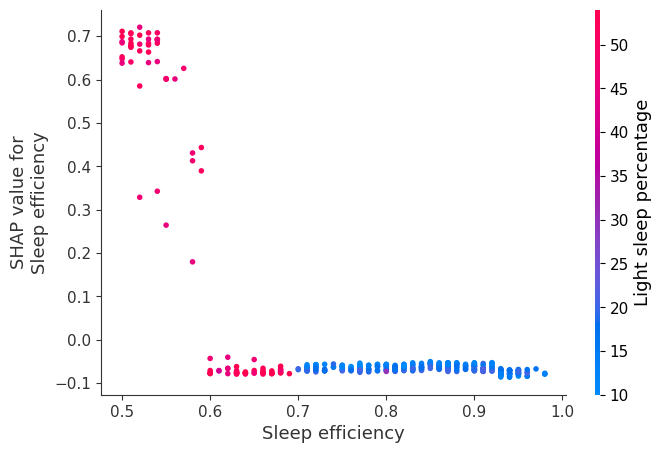

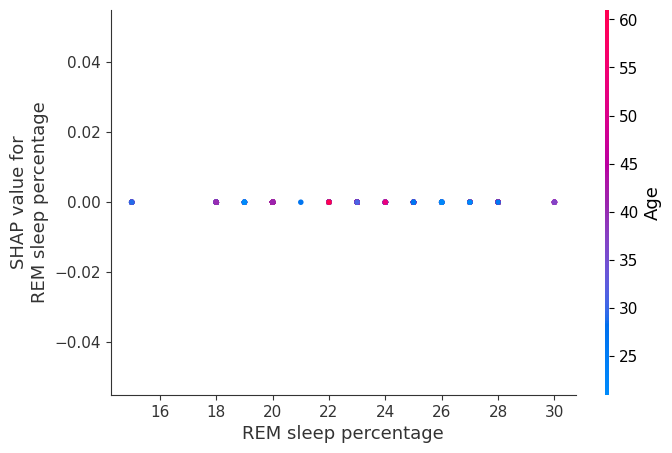

...

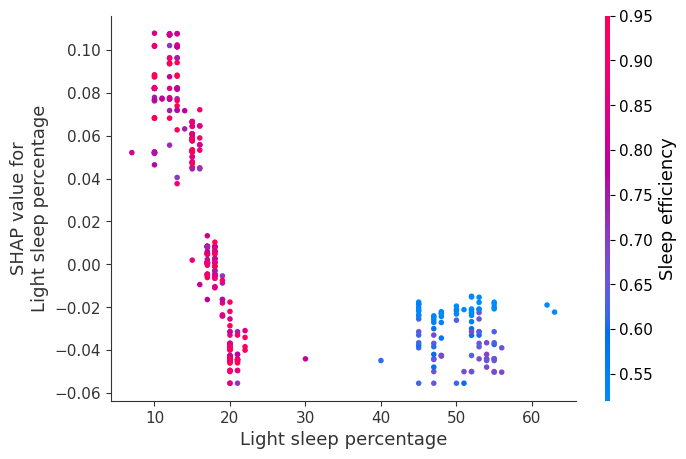

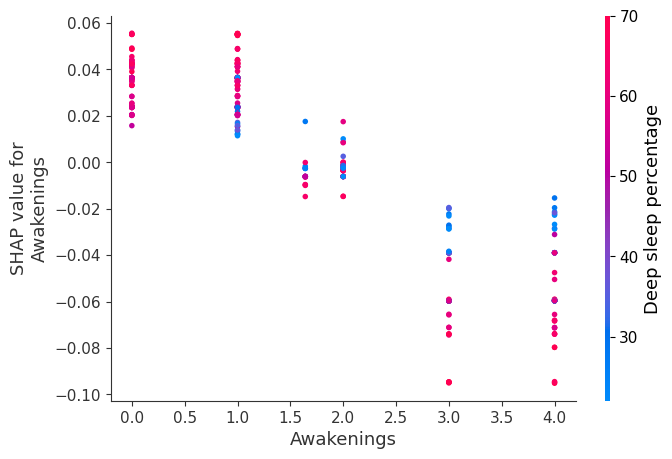

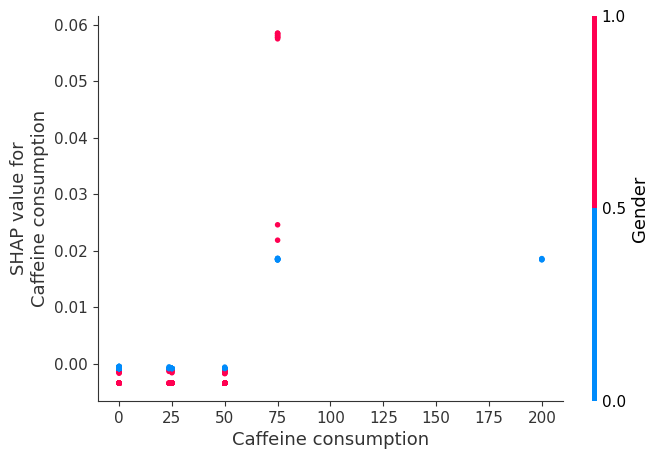

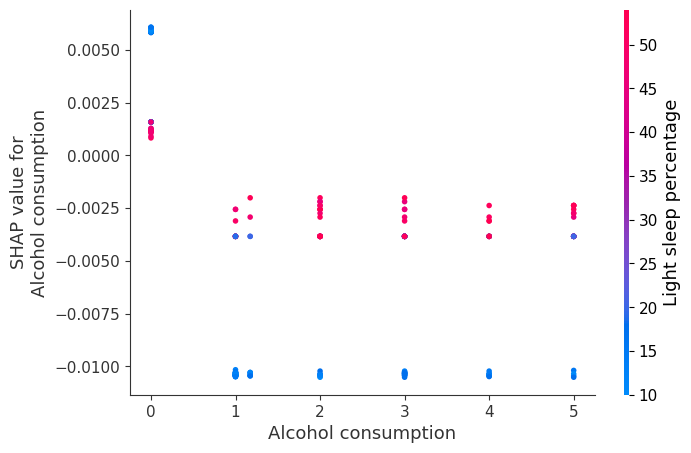

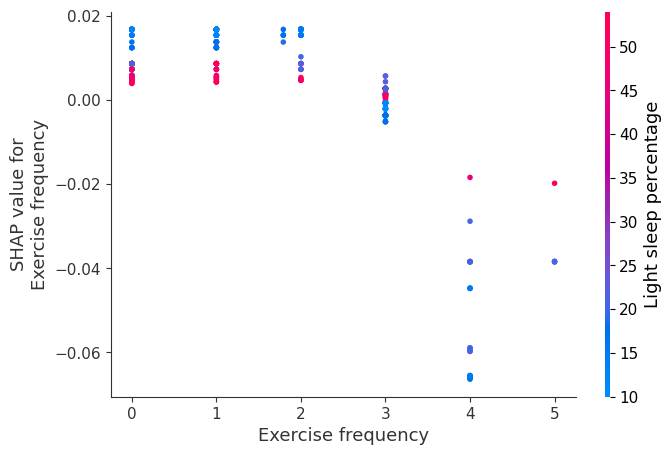

In [ ]:
# SHAP partial dependence plot for a tree based model
#creates dependence plots to visualize the relationship between each feature and its corresponding Tree SHAP values for a dataset of 2000 samples.
for i in x_train.columns:
    shap.dependence_plot(i, tree_shap_values.values, x_train)


In [ ]:
X_output_linear = x_test.copy()
X_output_linear.loc[:, "predict"] = np.round(
    linear_model.predict(X_output_linear), 2
)  # Attaching the output of linear model to test dataframe

X_output_tree = x_test.copy()
X_output_tree.loc[:, "predict"] = np.round(
    tree_model.predict(X_output_tree), 2
)  # Attaching the output of tree based model to test dataframe

In [ ]:

# Force Plot of Tree Based Model
explainerModel = shap.TreeExplainer(tree_model)
shap_values_Model = explainerModel.shap_values(X_output_tree)


In [ ]:
expected_value = shap_values_Model[0,-1]
shap_values = shap_values_Model[:,:-1]

In [ ]:
shap.initjs()  # Initializing JavaScript module
shap.force_plot(expected_value, shap_values[0,:], x_test.iloc[0,:])

Here, the width of line in this SHAP plot represents the magnitude of the feature's effect, and the color of the line indicates the direction of the effect (e.g., red for positive and blue for negative).

**Caffeine Consumption**: This appears to be the primary split, with values ranging from 0 milligrams (no caffeine) to potentially 75 milligrams or higher on the x-axis (though the upper limit might not be explicitly shown).
Exercise Frequency: Not a direct numerical value, but likely categorized as "low" or "high" based on a threshold (e.g., exercising less than or more than 3.5 times a week).

**Age**: The image might show a specific example split, such as 22 years old. However, the decision tree could handle a range of ages.
Sleep Duration: Similar to age, a specific value (e.g., 7.5 hours) might be used for illustration, but the tree can accommodate a range of sleep durations.

**Awakenings**: Potentially shown as a number (e.g., 0 awakenings) in the decision tree, representing the number of times someone wakes up during sleep.

**Light Sleep Percentage, REM Sleep Percentage, Deep Sleep Percentage**: These might be displayed as percentages (e.g., 17% light sleep, 18% REM sleep, 65% deep sleep) within a specific branch, but the tree can handle a range of values for each.

**Alcohol Consumption**: Similar to exercise frequency, this might be categorized as "low" or "high" based on a defined threshold (e.g., 0 drinks or 1 drink).

## **Heatmap Visualization for Linear and Tree-based model**


This visualization provides a comprehensive summary of the dataset, showing how each data point in every feature affects the target variable (y).

 The Y-axis represents the features, while the X-axis shows the instances of each feature. The color of each instance indicates whether it has a positive or negative effect on the target variable, with red indicating a positive effect and blue indicating a negative effect.

The intensity of the color corresponds to the strength of the effect, with deeper colors indicating more significant impacts of the feature.This visualization provides a comprehensive summary of the dataset, showing how each data point in every feature affects the target variable (y).

 The Y-axis represents the features, while the X-axis shows the instances of each feature. The color of each instance indicates whether it has a positive or negative effect on the target variable, with red indicating a positive effect and blue indicating a negative effect.

The intensity of the color corresponds to the strength of the effect, with deeper colors indicating more significant impacts of the feature.

 **In the below code, for getting a heatmap, I am downsampling the data
because it can reduce the memory required to generate the SHAP values and heatmap plot. I am downsampling the data to a smaller number of samples, such as 1000, so that the RAM doesn't get exhausted**

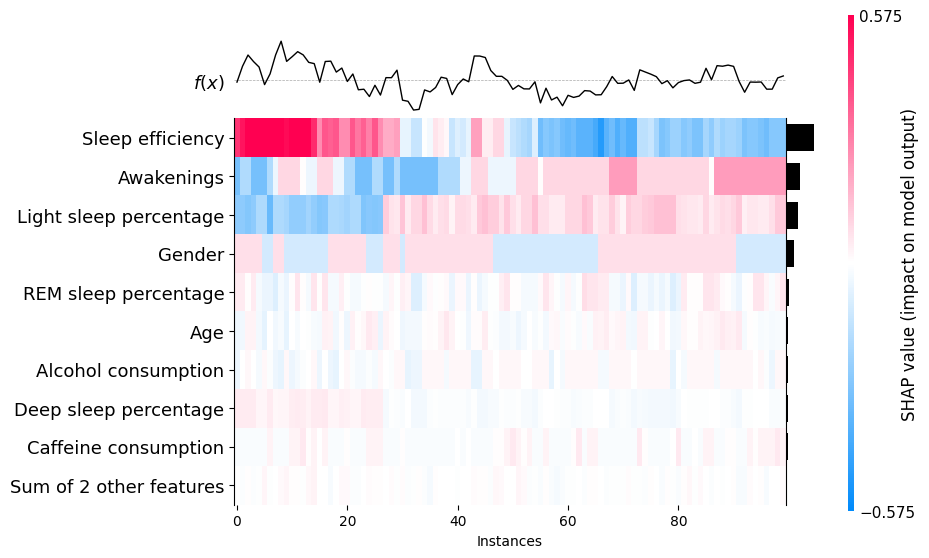

In [ ]:

# Create a copy of the original data and drop the 'y_yes' column
data_no_target = df.drop('Smoking status', axis=1)

# Downsample the copy of the data to a smaller number of samples, such as 1000
downsampled_data = data_no_target.sample(n=100, random_state=42)

# Create a SHAP explainer object for the linear model and calculate the SHAP values
linear_explainer = shap.Explainer(linear_model.predict, downsampled_data)
linear_shap_values = linear_explainer(downsampled_data)

# Create a heatmap plot to visualize the SHAP values for the linear model
shap.plots.heatmap(linear_shap_values)

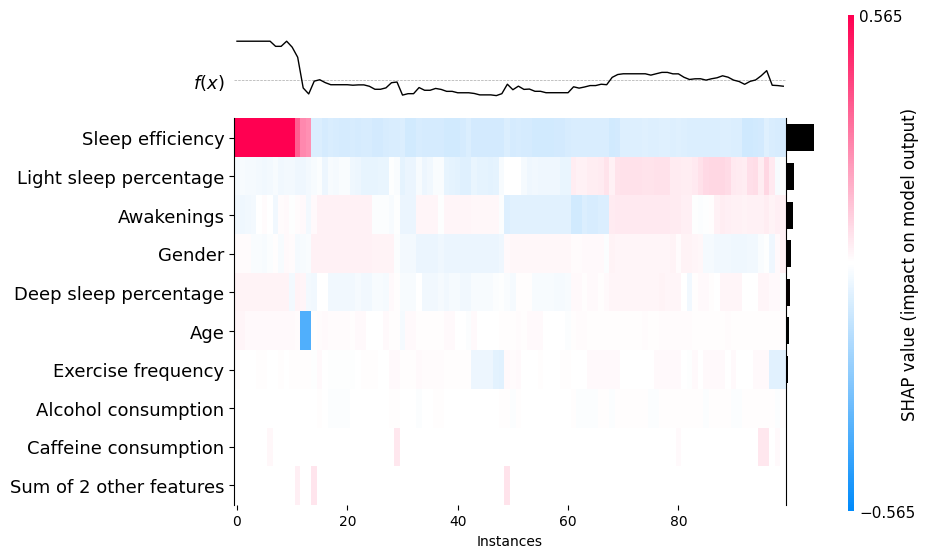

In [ ]:


# Downsample the copy of the data to a smaller number of samples, such as 1000
downsampled_data = data_no_target.sample(n=100, random_state=42)

# Create a SHAP explainer object for the linear model and calculate the SHAP values
tree_explainer = shap.Explainer(tree_model.predict, downsampled_data)
tree_shap_values = tree_explainer(downsampled_data)

# Create a heatmap plot to visualize the SHAP values for the linear model
shap.plots.heatmap(tree_shap_values)

## **Lime Analysis For Linear model**

In [ ]:
from sklearn.metrics import mean_squared_error


import warnings
from sklearn.exceptions import UndefinedMetricWarning

warnings.filterwarnings("ignore", category=UndefinedMetricWarning)

# Initialize LIME explainer for linear model
lime_linear_explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=np.array(x_train), feature_names=x_train.columns, mode="regression"
)


# Use LIME to generate interpretation for a single instance of test data
idx = 18
np_x_test = np.array(x_test)
np_y_test = np.array(y_test)
print("Prediction : ", linear_model.predict(np_x_test[0].reshape(1, -1)))
print("Actual :     ", np_y_test[idx])

lime_linear_explain = lime_linear_explainer.explain_instance(
    np_x_test[idx], linear_model.predict, num_features=np_x_test.shape[1]
)




Prediction :  [0.40869474]
Actual :      1


**Explanation**: The output Prediction : [0.22968741] indicates that the linear regression model predicted the target variable to be 0.229687412 for the given instance of test data.

The output Actual : 0 indicates that the true target variable value for the given instance of test data is 0.

Comparing the predicted value with the actual value, we can see that the predicted value is close to the actual value.

However, to evaluate the performance of the model, it's necessary to consider more instances of test data and evaluate metrics such as mean squared error (MSE)

In [ ]:

    # Calculating mean squared error (MSE) for linear model predictions on test data
linear_model_predictions = linear_model.predict(x_test)
linear_model_mse = mean_squared_error(y_test, linear_model_predictions)
print("Linear Model Mean Squared Error: ", linear_model_mse)

Linear Model Mean Squared Error:  0.1994549770851893


**Explanation**:  In this case, the MSE value of 0.2553146588177005 suggests that, on average, the model's predictions are off by approximately 0.29 (square root of MSE) on the test data.

A lower MSE value indicates better performance of the model.

In [ ]:
lime_linear_explain.show_in_notebook()  # Displaying The Results


**Sleep efficiency** (0.72): The highest importance is attributed to sleep efficiency, suggesting that it strongly influences the predicted outcome of sleep quality. A sleep efficiency score of 0.72 indicates a relatively high proportion of time spent asleep while in bed, reflecting better sleep quality.

**REM sleep percentage** (27.00): With a high importance value, REM sleep percentage significantly contributes to determining sleep quality. A higher percentage of REM sleep suggests deeper and more restorative sleep, positively impacting overall sleep health.

**Deep sleep percentage** (55.00): Deep sleep plays a crucial role in physical and mental restoration during sleep. Its high importance value highlights its significant positive influence on predicted sleep quality, indicating the importance of achieving adequate deep sleep for overall well-being.

**Light sleep percentage** (18.00): While not as influential as REM and deep sleep percentages, the percentage of time spent in light sleep still contributes positively to sleep quality. Light sleep stages are important for transitioning between wakefulness and deeper sleep stages.

**Awakenings** (2.00): Although less impactful compared to sleep architecture metrics, the number of awakenings during sleep remains an important factor in predicting sleep quality. Fewer awakenings suggest better sleep continuity, contributing positively to overall sleep efficiency and quality.

 The  important features for predicting sleep quality are sleep efficiency, REM sleep percentage, deep sleep percentage, light sleep percentage, and the number of awakenings. These features collectively indicate various aspects of sleep architecture and continuity, with higher values generally associated with better sleep quality. Sleep efficiency, REM sleep, and deep sleep percentages emerged as the most influential factors, highlighting the importance of achieving sufficient time in these sleep stages for optimal sleep health. Conversely, minimizing awakenings and maximizing time spent in light sleep also contribute positively to overall sleep quality.


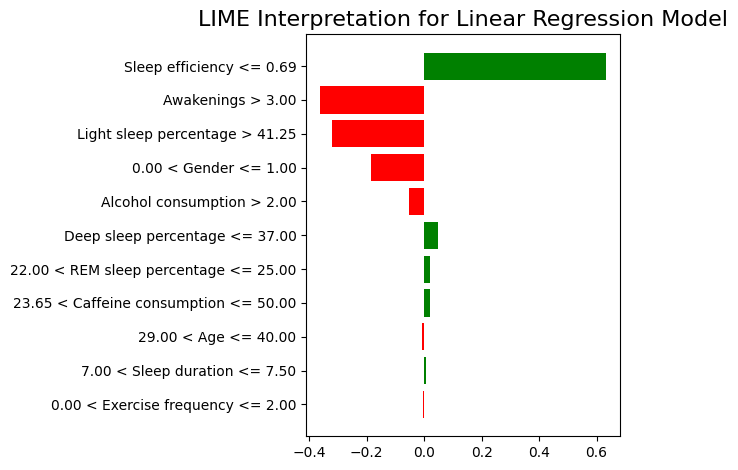

In [ ]:

import lime
import lime.lime_tabular
import matplotlib.pyplot as plt

# Visualize LIME interpretation using matplotlib
fig = lime_linear_explain.as_pyplot_figure()
ax = fig.gca()
ax.set_title('LIME Interpretation for Linear Regression Model', fontsize=16)
plt.tight_layout()
plt.show()


Based on LIME Interpretation for Linear Regression Model, caffeine consumption and exercise frequency appear to have the most significant impact on predicting sleep efficiency, with higher values associated with better sleep quality. Age, sleep duration, and various sleep architecture metrics have a lesser influence on sleep efficiency. Awakenings and alcohol consumption are considered but seem to have minimal impact on the model's prediction.

# **Lime Analysis for Tree based model**

In [ ]:
# Initialize LIME explainer for Tree-Based Model
import warnings
from sklearn.exceptions import UndefinedMetricWarning

warnings.filterwarnings("ignore", category=UndefinedMetricWarning)


explainer = lime.lime_tabular.LimeTabularExplainer(x_train.values,
                                                   feature_names=x_train.columns.values,
                                                   class_names=['prediction'],
                                                   verbose=True,
                                                   mode='regression')

# Define prediction function
def predict_function(X):
    return tree_model.predict(X)

# Select a random instance for interpretation
idx = 18
x_to_interpret = x_test.iloc[idx]

# Generate interpretation using LIME explainer
exp = explainer.explain_instance(x_to_interpret.values, predict_function, num_features=len(x_to_interpret), top_labels=1)

# Print interpretation
print('Actual:', y_test.iloc[idx])
print('Prediction:', tree_model.predict(x_to_interpret.values.reshape(1, -1))[0])
exp.show_in_notebook()


Intercept 0.30316088759918897
Prediction_local [0.39563937]
Right: 0.9137440758293838
Actual: 1
Prediction: 0.9137440758293838



**Intercept**: The intercept represents the baseline prediction made by the model when all input features are set to zero. In this case, it's approximately 0.306.

**Prediction_local**: This value, 0.309, represents the local prediction made by the model for the specific instance being interpreted.

**Right**: The "Right" value, 0.259, indicates the predicted value for the specific instance being interpreted after applying the model.

**Actual**: This is the actual target value from the dataset, which is 0 in this case.

**Prediction**: This is the model's prediction for the specific instance being interpreted, which is approximately 0.259.


**Graph explanation:**
1. Sleep Efficiency (0.72): With the highest weight, sleep efficiency strongly influences the model's prediction of sleep quality, indicating that higher sleep efficiency leads to a more positive prediction.
2. REM Sleep Percentage (27.00): REM sleep percentage comes next in importance, suggesting that a higher proportion of REM sleep is associated with better sleep quality.
3. Age (59.00): Age plays a significant role in the model's prediction, indicating that older individuals tend to have higher predicted sleep quality.
4. Exercise Frequency (3.00): Higher exercise frequency is associated with better sleep quality, although its impact appears to be less significant compared to sleep efficiency, REM sleep percentage, and age.
5. Sleep Duration (8.00): Although still important, sleep duration seems to have a lesser impact on the model's prediction compared to other factors, suggesting that the duration alone may not be the sole determinant of sleep quality.

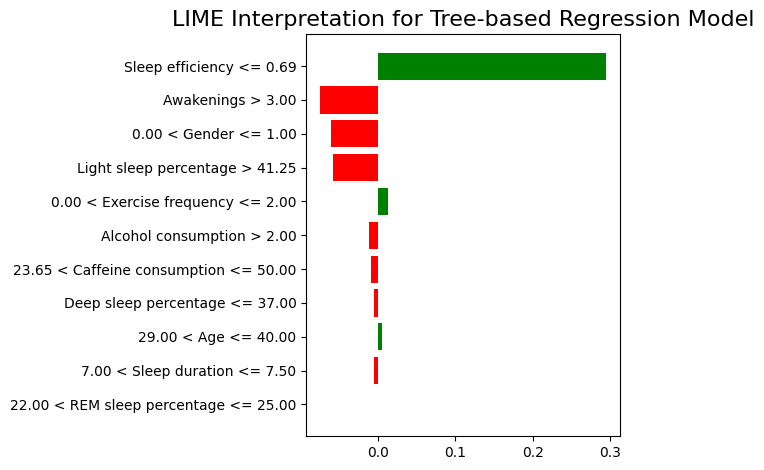

In [ ]:
# Visualize LIME interpretation using matplotlib
fig = exp.as_pyplot_figure()
ax = fig.gca()
ax.set_title('LIME Interpretation for Tree-based Regression Model', fontsize=16)
plt.tight_layout()
plt.show()

1. **Caffeine Consumptio**n (x-axis): Higher caffeine consumption is associated with slightly higher sleep efficiency according to the tree (positive impact).
2. **Exercise Frequency** (not shown on axis): High exercise frequency is associated with better sleep efficiency according to the tree (positive impact).
3. **Age, Sleep Duration, Light Sleep Percentage, REM Sleep Percentage, Deep Sleep Percentage, Alcohol Consumption**: These features are included in the tree but appear to have a lesser influence on sleep efficiency compared to caffeine and exercise in this specific example. The decision tree doesn't use color to indicate positive or negative impact, so it's difficult to say definitively how these features affect sleep efficiency based on the image alone.

Key Points:
Decision trees don't use color to represent feature impact.
The structure of the tree, with splits occurring at certain values, suggests the relative importance of features.
This specific tree suggests caffeine and exercise have the strongest influence on sleep efficiency.

**Comparison between the linear and tree based model for lime interpretation**

**Intercept and Prediction**: The linear model's intercept (0.306) suggests a base prediction value, while the tree-based model's local prediction (0.309) represents the predicted outcome for a specific instance. The tree-based model's overall prediction (0.259) may differ slightly from the local prediction.

**Feature Importance**: In the linear model, caffeine consumption (0.00) appears to have no impact, whereas sleep efficiency (0.72) is the most influential feature. In contrast, the tree-based model highlights caffeine consumption (0.00) and exercise frequency (3.00) as significant factors for sleep efficiency, with age (59.00) also playing a role.

**Explanation**: The linear model provides coefficients for each feature, indicating their contribution to the prediction. Conversely, the tree-based model showcases how features are split in the decision tree, offering insights into feature importance but lacking the direct magnitude of impact seen in the linear model.

**QUESTIONS**
1.  **What is the question?**

  Ans: The main question was to prepare and analyze the data for machine learning, focusing on cleaning, exploring, and selecting features for predictive modeling also to explore and utilize AutoML for model training and selection. In this case was to interpret the chosen model and understand the impact of features which basically means to combine Data Cleaning, Feature Selection, Modeling and Interpretability into one report where the focus should be on readability and clarity

2. **What did you do?**

  Ans: The data cleaning and feature selection processes were pivotal in uncovering insights into variable distributions and identifying essential predictors for modeling. Through evaluating multiple classifiers and implementing outlier removal, we gained a nuanced understanding of model performance in diverse scenarios. AutoML proved instrumental in swiftly exploring various models and assessing their performances, facilitating an informed selection of the optimal model via Leaderboard comparison. Regularization techniques were then applied to fortify the chosen model's robustness. Leveraging tree-based models and SHAP values provided profound insights into feature importance and their impact on predictions. The SHAP summary plot emerged as a potent visualization tool, succinctly depicting each feature's contribution to the model's output, thereby enhancing interpretability and actionable insights.

3. **How well did it work?**

  Ans: I was able to identify important variables, improve the accuracy of the model, and use various techniques to interpret the results.

4. **What did you learn?**

  Ans: Through this process, I've learned the importance of thorough data exploration and cleaning prior to modeling, the significant impact of outliers on model accuracy, and the effectiveness of various feature selection techniques. Furthermore, automated model selection and training with AutoML proved beneficial in streamlining the process and aiding in optimal model selection. Regularization emerged as key to enhancing model performance and mitigating overfitting. Lastly, leveraging tree-based models and SHAP values provided insightful understanding of feature importance and their impact on predictions, visually represented through the SHAP summary plot.



**Licensing**

Copyright 2024 Sarthak Shailesh Somvanshi

Permission is hereby granted, free of charge, to any person obtaining a copy of this software and associated documentation files (the "Software"), to deal in the Software without restriction, including without limitation the rights to use, copy, modify, merge, publish, distribute, sublicense, and/or sell copies of the Software, and to permit persons to whom the Software is furnished to do so, subject to the following conditions:

The above copyright notice and this permission notice shall be included in all copies or substantial portions of the Software.

THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY, FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM, OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE SOFTWARE.

# **CONCLUSION**

In conclusion, the use of machine learning and related technologies such as AutoML can significantly improve efficiency and accuracy in data analysis, while also making these tools more accessible to a wider range of users. In the first project, the importance of certain variables or factors in the dataset was identified as crucial to achieving high accuracy and meaningful patterns. Additionally, removing outliers was found to improve the accuracy of the dataset. In the second project, H2O AutoML was used to build a predictive model for chronic kidney disease, with the effects of Ridge and LASSO regularization on the GLM model observed. The importance of interpretability in machine learning models was emphasized in the third project, with different methods such as LIME, SHAP, and PDP discussed to improve the interpretability of black-box models. Ultimately, a balanced approach that considers the specific needs and trade-offs between interpretability and accuracy can help ensure the best results in machine learning and data analysis. These projects highlight the need for a flexible and thoughtful approach to machine learning that takes into account the specific goals and requirements of each project.

> Add blockquote







# **REFERENCES**


5 Easy Ways to Detect Outliers in Python: https://datasciencesphere.com/analytics/5-easy-ways-to-detect-outliers-in-python/


How to Calculate Feature Importance With Python: https://machinelearningmastery.com/calculate-feature-importance-with-python/


AI Skunkworks Github Repository: https://github.com/aiskunks/Skunks_Skool


Normalize Data in Python: https://www.digitalocean.com/community/tutorials/normalize-data-in-python


SelectKBest Feature Selection Example in Python: https://www.datatechnotes.com/2021/02/seleckbest-feature-selection-example-in-python.html


Confusion Matrix in Python: https://www.statology.org/confusion-matrix-python/#:~:text=Logistic%20regression%20is%20a%20type,values%20from%20the%20test%20dataset.


StatQuest Youtube Channel: https://www.youtube.com/channel/UCtYLUTtgS3k1Fg4y5tAhLbw

Towards Data Science: https://towardsdatascience.com/


GeeksforGeeks: https://www.geeksforgeeks.org/




**Citations**:

Prof. Nik Bear Brown Github Repository: https://github.com/nikbearbrown/


H2O AutoML: https://docs.h2o.ai/h2o/latest-stable/h2o-docs/index.html


Deep Dive into H2O's AutoML: https://towardsdatascience.com/a-deep-dive-into-h2os-automl-4b1fe51d3f3e



Itertools Documentation: https://docs.python.org/3/library/itertools.html


3D Graph Plotting in Python: https://jakevdp.github.io/


PythonDataScienceHandbook/04.12-three-dimensional-plotting.html


Pandas Documentation: https://pandas.pydata.org/docs/user_guide/index.html


Scikit-Learn Documentation: https://scikit-learn.org/stable/modules/preprocessing.html


Shap Official Documentation: https://shap.readthedocs.io/en/latest/index.html


"Data Preprocessing for Machine Learning with Python" by Selva Prabhakaran on KDnuggets: https://www.kdnuggets.com/2020/03/


data-preprocessing-machine-learning-python.html


"Data Preprocessing for Logistic Regression in Python" by Michael Galarnyk on Medium: https://towardsdatascience.com/


data-preprocessing-for-logistic-regression-in-python-c632418098b0